In [7]:
# Step 1: Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

In [8]:
# Step 2: Load and clean data
# df = pd.read_csv("twitter_training.csv")
from google.colab import files
files.upload()
df=pd.read_csv("twitter.csv", encoding='latin1')
# df.head(13)
df.columns = ["id", "entity", "sentiment", "tweet_text"]
df = df.dropna(subset=["tweet_text"])
display(df.head())

Saving twitter.csv to twitter (4).csv


,id,entity,sentiment,tweet_text
0,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
1,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
2,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
3,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...
4,2401,Borderlands,Positive,im getting into borderlands and i can murder y...


In [89]:
# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

Missing values per column:
id            0
entity        0
sentiment     0
tweet_text    0
dtype: int64


In [9]:
# Step 3: Label encoding and TF-IDF
label_encoder = LabelEncoder()
df["sentiment_encoded"] = label_encoder.fit_transform(df["sentiment"])

vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(df["tweet_text"])
y = df["sentiment_encoded"]

In [10]:
# Step 4: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
# Step 5: Train Decision Tree and evaluate
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

Accuracy: 0.7774044519109617
              precision    recall  f1-score   support

  Irrelevant       0.66      0.79      0.72       485
    Negative       0.82      0.74      0.78       562
     Neutral       0.84      0.78      0.81       601
    Positive       0.79      0.80      0.80       733

    accuracy                           0.78      2381
   macro avg       0.78      0.78      0.77      2381
weighted avg       0.78      0.78      0.78      2381



In [12]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

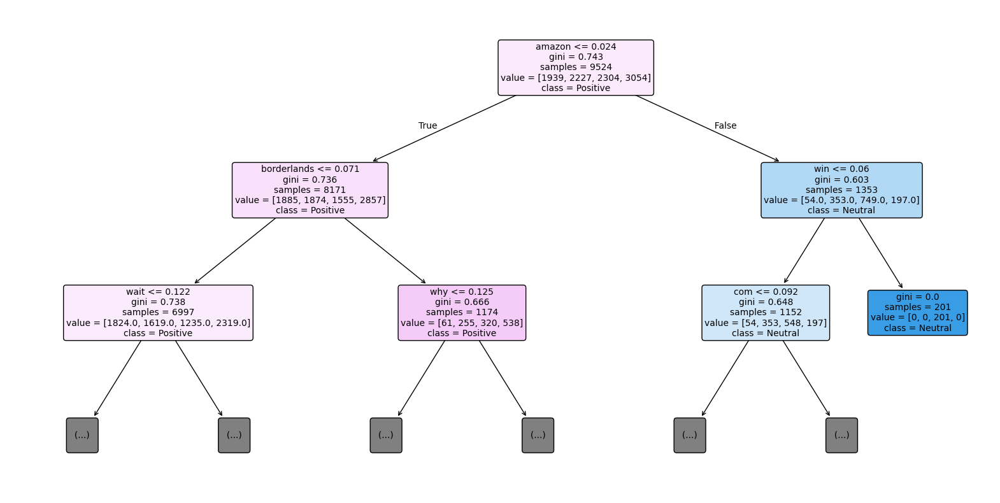

In [13]:
plt.figure(figsize=(20, 10))  # Size of the plot
plot_tree(
    clf,
    max_depth=2,  # Only show top 2 levels
    feature_names=vectorizer.get_feature_names_out(),
    class_names=label_encoder.classes_,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.show()

In [14]:
from sklearn.model_selection import cross_val_score


Confusion Matrix:
 [[383  20  29  53]
 [ 71 416  28  47]
 [ 53  30 466  52]
 [ 76  40  31 586]]


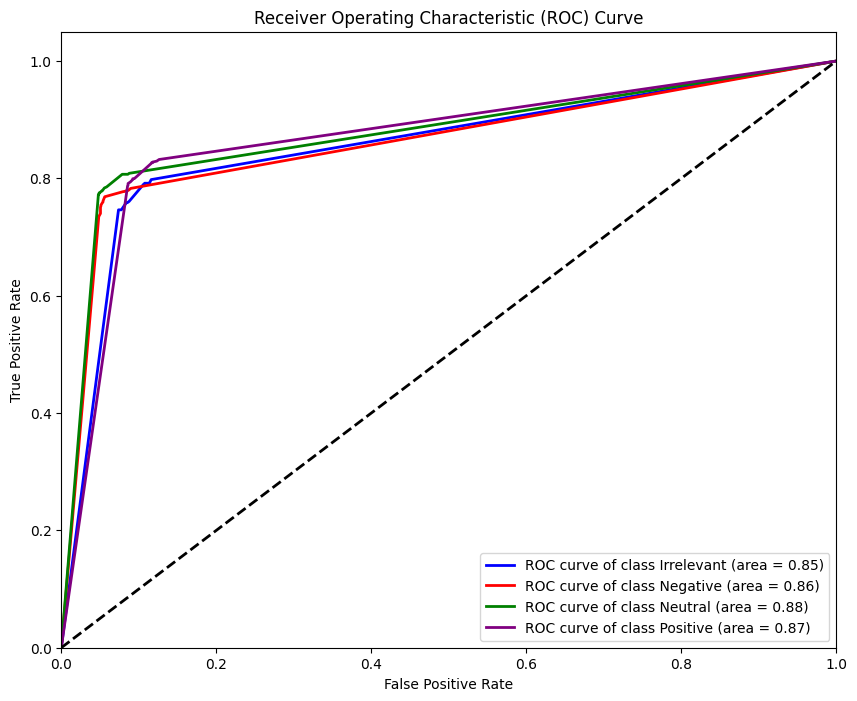

In [15]:
# Classification report, Confusion matrix, Compute ROC and AUC curve without cross validation

from sklearn.metrics import confusion_matrix, roc_curve, auc
import numpy as np

# Classification Report and Confusion Matrix
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Compute ROC and AUC curve (without cross-validation)
# For multi-class classification, we can compute ROC/AUC for each class
# against all other classes (OvR - One vs Rest)

# Get the decision function scores for each class
y_score = clf.predict_proba(X_test)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(label_encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_score[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Define colors for each class, adjust if you have more classes
for i, color in zip(range(len(label_encoder.classes_)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


Performing 5-Fold Cross-Validation with Decision Tree:

--- Fold 1/5 ---
  Training complete.
Accuracy for Fold 1: 0.7976
Classification Report for Fold 1:
              precision    recall  f1-score   support

  Irrelevant       0.78      0.72      0.75       485
    Negative       0.84      0.74      0.79       562
     Neutral       0.86      0.84      0.85       601
    Positive       0.74      0.86      0.79       733

    accuracy                           0.80      2381
   macro avg       0.80      0.79      0.80      2381
weighted avg       0.80      0.80      0.80      2381

Confusion Matrix for Fold 1:
[[348  30  21  86]
 [ 40 417  27  78]
 [ 20  16 507  58]
 [ 36  36  34 627]]
ROC AUC per class for Fold 1: {'Irrelevant': np.float64(0.876209274000609), 'Negative': np.float64(0.8833702769696697), 'Neutral': np.float64(0.9306834115425602), 'Positive': np.float64(0.8922266354521252)}

--- Fold 2/5 ---
  Training complete.
Accuracy for Fold 2: 0.7929
Classification Report for Fo

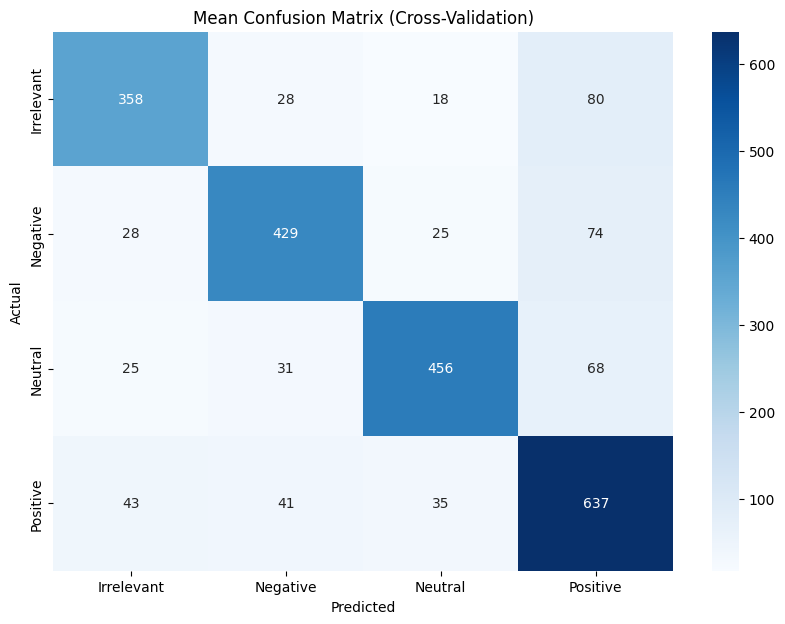

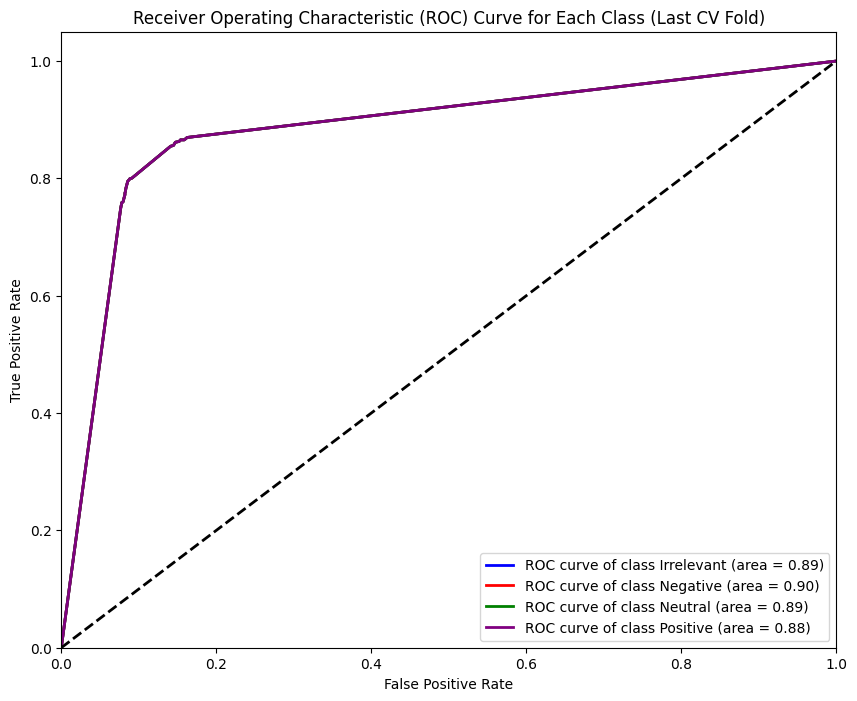

In [57]:
# Show 5-Fold Cross-Validation ,10 Epoch per fold for cross validation

from sklearn.model_selection import KFold
from sklearn.base import clone
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for heatmap
from sklearn.preprocessing import label_binarize # Import label_binarize

# Step 6: Implement 5-Fold Cross-Validation
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# List to store metrics for each fold
accuracy_scores = []
classification_reports = []
confusion_matrices = []
fold_roc_aucs = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class per fold

print(f"\nPerforming {n_splits}-Fold Cross-Validation with Decision Tree:")

# Perform cross-validation
for fold, (train_index, test_index) in enumerate(kf.split(X, y)): # Pass y to kf.split
    print(f"\n--- Fold {fold+1}/{n_splits} ---")
    X_train_fold, X_test_fold = X[train_index], X[test_index]
    # Use standard NumPy indexing for y
    y_train_fold, y_test_fold = y[train_index], y[test_index]

    # Clone the model for each fold to ensure independent training
    clf_fold = clone(clf)

    # Train the model on the current fold's training data
    # In a typical CV loop, we would train the model once per fold.
    # The prompt mentions 10 epochs per fold. For Decision Trees,
    # training is a single pass over the data, not iterative like neural networks.
    # If this were a neural network, we would train for 10 epochs here.
    # Since it's a Decision Tree, we just fit it once.
    # If you were using a different model (e.g., a neural network),
    # you would add an epoch loop here.
    print("  Training complete.")
    clf_fold.fit(X_train_fold, y_train_fold)


    # Evaluate the model on the current fold's test data
    y_pred_fold = clf_fold.predict(X_test_fold)

    # Store accuracy
    accuracy_fold = accuracy_score(y_test_fold, y_pred_fold)
    accuracy_scores.append(accuracy_fold)
    print(f"Accuracy for Fold {fold+1}: {accuracy_fold:.4f}")

    # Store classification report
    report_fold = classification_report(y_test_fold, y_pred_fold, target_names=label_encoder.classes_)
    classification_reports.append(report_fold)
    print(f"Classification Report for Fold {fold+1}:\n{report_fold}")

    # Store confusion matrix
    cm_fold = confusion_matrix(y_test_fold, y_pred_fold)
    confusion_matrices.append(cm_fold)
    print(f"Confusion Matrix for Fold {fold+1}:\n{cm_fold}")

    # Compute and store ROC AUC for each class (OvR)
    # Binarize the true labels for the current fold
    y_test_binarized_fold = label_binarize(y_test_fold, classes=np.arange(len(label_encoder.classes_)))
    n_classes_fold = y_test_binarized_fold.shape[1]

    y_score_fold = clf_fold.predict_proba(X_test_fold)
    roc_auc_fold = {}
    for i in range(n_classes_fold):
         if i < y_score_fold.shape[1]: # Ensure predicted probabilities are available for this class
             # Check if the class exists in the true labels for this fold
             if np.sum(y_test_binarized_fold[:, i]) > 0:
                 fpr_fold, tpr_fold, _ = roc_curve(y_test_binarized_fold[:, i], y_score_fold[:, i])
                 auc_fold = auc(fpr_fold, tpr_fold)
                 fold_roc_aucs[i].append(auc_fold)
                 roc_auc_fold[label_encoder.classes_[i]] = auc_fold
             else:
                 # Handle cases where a class is not present in the test set of a fold
                 # print(f"  Warning: Class {label_encoder.classes_[i]} not present in fold {fold+1} test set for ROC/AUC.")
                 roc_auc_fold[label_encoder.classes_[i]] = np.nan # Indicate missing AUC
         else:
              roc_auc_fold[label_encoder.classes_[i]] = np.nan # Indicate missing AUC


    roc_aucs.append(roc_auc_fold)
    print(f"ROC AUC per class for Fold {fold+1}: {roc_auc_fold}")

# Print average metrics across all folds
print("\n--- Average Metrics Across Folds ---")
print(f"Average Accuracy: {np.mean(accuracy_scores):.4f}")

# Average ROC AUC for each class, ignoring NaNs
avg_roc_auc_per_class = {}
for class_name in label_encoder.classes_:
    class_auc_values = [fold_auc[class_name] for fold_auc in roc_aucs if class_name in fold_auc and not np.isnan(fold_auc[class_name])]
    if class_auc_values: # Only compute mean if there are valid AUC values
        avg_roc_auc_per_class[class_name] = np.mean(class_auc_values)
    else:
        avg_roc_auc_per_class[class_name] = np.nan # Indicate no valid AUCs
print(f"Average ROC AUC per class: {avg_roc_auc_per_class}")


# Note: Averaging classification reports and confusion matrices directly can be misleading.
# It's usually better to look at them per fold or compute aggregate versions if needed.

# Optional: Visualize the mean confusion matrix
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)
print("\nMean Confusion Matrix across folds:")
print(mean_cm)

plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Mean Confusion Matrix (Cross-Validation)')
plt.show()

# Optional: Visualize ROC curves from the last fold (as a representative)
if 'fpr_fold' in locals() and 'tpr_fold' in locals():
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Ensure enough colors for all classes
    for i, color in zip(range(n_classes_fold), colors):
        if i < len(label_encoder.classes_):
             # Use the AUC from the last fold's calculation
             last_fold_auc = roc_auc_fold.get(label_encoder.classes_[i], np.nan)
             plt.plot(fpr_fold, tpr_fold, color=color, lw=2,
                      label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], last_fold_auc))


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Last CV Fold)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves could not be plotted for the last CV fold (possibly due to missing classes).")

In [58]:
# Classification report
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

  Irrelevant       0.78      0.72      0.75       485
    Negative       0.84      0.74      0.79       562
     Neutral       0.86      0.84      0.85       601
    Positive       0.74      0.86      0.79       733

    accuracy                           0.80      2381
   macro avg       0.80      0.79      0.80      2381
weighted avg       0.80      0.80      0.80      2381



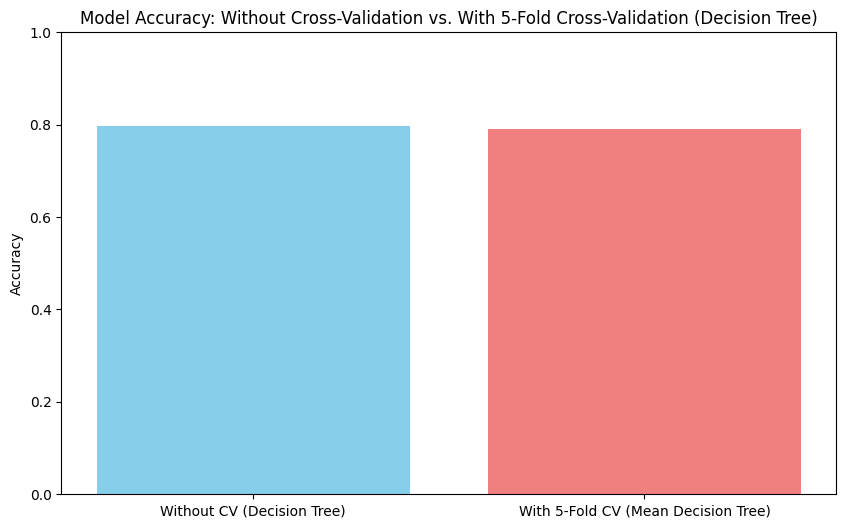

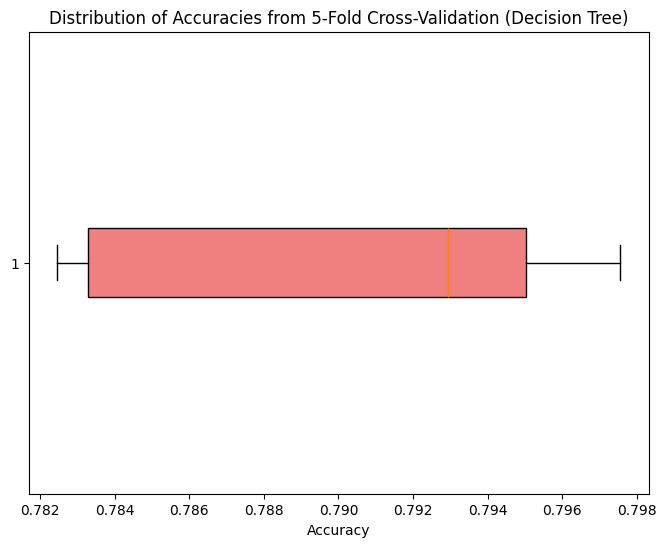

In [65]:
# Visualization of Comparison (Decision Tree)

# Visualize the comparison of Decision Tree results
labels_dt = ['Without CV (Decision Tree)', 'With 5-Fold CV (Mean Decision Tree)']

# Ensure accuracy_dt_nocv is available from cell bZ3snq759AEK or re-calculate
# Assuming cell bZ3snq759AEK has been run and y_test, y_pred are available
accuracy_dt_nocv = accuracy_score(y_test, y_pred)

# Ensure fold_accuracies_dt (or accuracy_scores) is available from cell Z2i5R6IKNDev
# Assuming cell Z2i5R6IKNDev has been run and accuracy_scores is available
accuracies_dt = [accuracy_dt_nocv, np.mean(accuracy_scores)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_dt, accuracies_dt, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (Decision Tree)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for Decision Tree
# Ensure accuracy_scores (or fold_accuracies_dt) is available from cell Z2i5R6IKNDev
plt.figure(figsize=(8, 6))
plt.boxplot(accuracy_scores, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (Decision Tree)')
plt.show()


--- Linear Regression Evaluation (Classification Metrics) ---

Classification Report (Linear Regression with Rounding/Clipping):
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381


Confusion Matrix (Linear Regression with Rounding/Clipping):

[[ 78 255 141  11]
 [ 46 329 179   8]
 [ 12 133 384  72]
 [  5  64 403 261]]


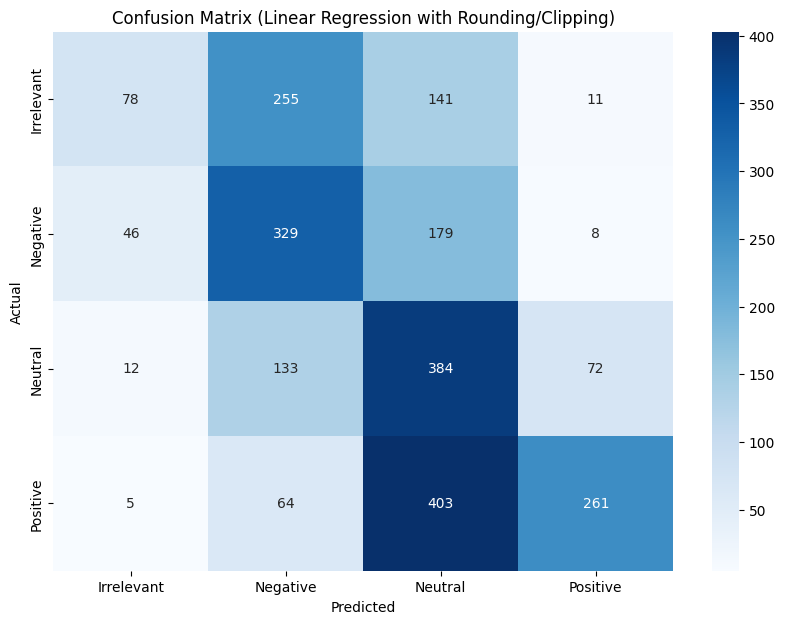


Note: Standard multi-class ROC/AUC is not directly applicable to the continuous output
of a single Linear Regression model used for classification without further processing.
Methods like training OvR models are needed for a proper ROC/AUC analysis.


In [62]:
# Linear Regression
# Without Cross-validation

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Step 7: Train Linear Regression Model (for demonstration, although the task is classification)
# We'll use the already split data X_train, X_test, y_train, y_test

lr_model = LinearRegression()

# Train the model
lr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_lr = lr_model.predict(X_test)

# Evaluation for Linear Regression (typically regression metrics)

y_pred_lr_classified = np.round(y_pred_lr).astype(int)

# Clip predictions to the valid range of encoded labels (0, 1, 2, 3)
y_pred_lr_classified = np.clip(y_pred_lr_classified, 0, len(label_encoder.classes_) - 1)


print("\n--- Linear Regression Evaluation (Classification Metrics) ---")

# Classification Report
print("\nClassification Report (Linear Regression with Rounding/Clipping):")
# Handle potential cases where a predicted class is not in the actual test set's classes
unique_true_classes = np.unique(y_test)
unique_pred_classes = np.unique(y_pred_lr_classified)
target_names_subset = label_encoder.classes_[np.sort(np.unique(np.concatenate((unique_true_classes, unique_pred_classes))))]

# Ensure all classes are represented in the target_names
all_possible_target_names = label_encoder.classes_


print(classification_report(y_test, y_pred_lr_classified, target_names=all_possible_target_names, zero_division=0))


# Confusion Matrix
print("\nConfusion Matrix (Linear Regression with Rounding/Clipping):\n")
cm_lr = confusion_matrix(y_test, y_pred_lr_classified)
print(cm_lr)

# Confusion Matrix Visualization
plt.figure(figsize=(10, 7))
sns.heatmap(cm_lr, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Linear Regression with Rounding/Clipping)")
plt.show()


# Compute ROC and AUC curve (using OvR approach for multi-class with continuous predictions)
# For ROC/AUC, we need prediction scores (probabilities or decision function).
# Linear Regression doesn't inherently provide probabilities like Logistic Regression.
# We can't directly use the continuous predictions `y_pred_lr` for standard `roc_curve`
# in the same way as `predict_proba`.

# To compute ROC/AUC for Linear Regression in a classification context (OvR),
# you would typically train separate binary LR models for each class and get their scores.
# Since we trained a single model predicting continuous values, we cannot directly compute
# multi-class ROC/AUC curves in the standard way without further steps (e.g., fitting OvR models
# or using techniques for ROC with continuous outputs, which is less common for multi-class).

# Let's acknowledge that standard multi-class ROC/AUC is not directly applicable
# to the raw continuous output of a single Linear Regression model trained this way
# for classification.

print("\nNote: Standard multi-class ROC/AUC is not directly applicable to the continuous output")
print("of a single Linear Regression model used for classification without further processing.")
print("Methods like training OvR models are needed for a proper ROC/AUC analysis.")

# If we were to force an interpretation, we could potentially use `y_pred_lr` as scores,
# but this is not a standard or recommended practice for multi-class ROC/AUC with LR.
# Let's omit the ROC/AUC plot for Linear Regression in this context as it would be misleading
# or require significant non-standard adaptation.




Performing 5-Fold Cross-Validation with Linear Regression:
✅Fold 1/5
  Training complete.
  R-squared for Fold 1: 0.3411
  ROC AUC per class for Fold 1: {'Irrelevant': np.float64(0.7656379137848537), 'Negative': np.float64(0.7456640952852356), 'Neutral': np.float64(0.6684215446166502), 'Positive': np.float64(0.8079651717241287)}
------------------------------
✅Fold 2/5
  Training complete.
  R-squared for Fold 2: 0.3324
  ROC AUC per class for Fold 2: {'Irrelevant': np.float64(0.7805325580836388), 'Negative': np.float64(0.7259246191313375), 'Neutral': np.float64(0.6826996336363653), 'Positive': np.float64(0.8005457249947787)}
------------------------------
✅Fold 3/5
  Training complete.
  R-squared for Fold 3: 0.3224
  ROC AUC per class for Fold 3: {'Irrelevant': np.float64(0.7679357406443936), 'Negative': np.float64(0.7155361050328228), 'Neutral': np.float64(0.6397776889789871), 'Positive': np.float64(0.8064031890151176)}
------------------------------
✅Fold 4/5
  Training complete.


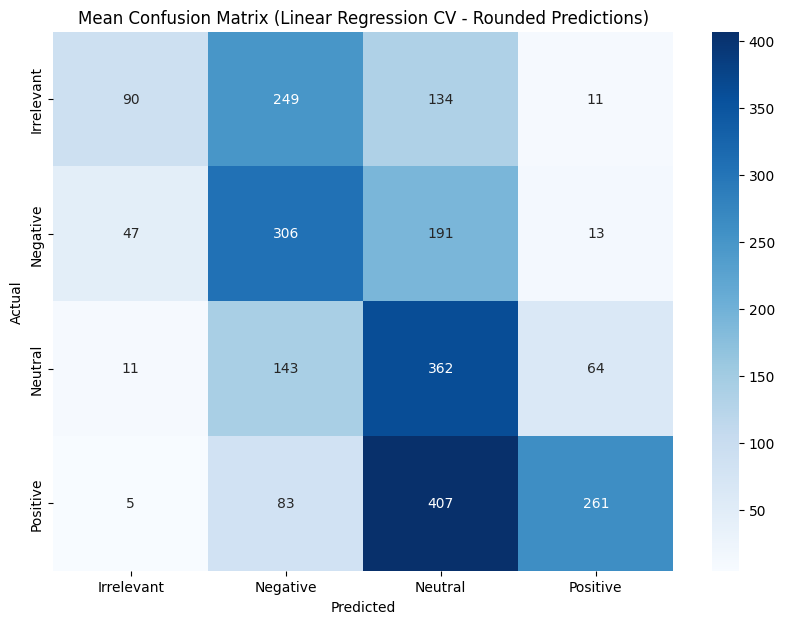

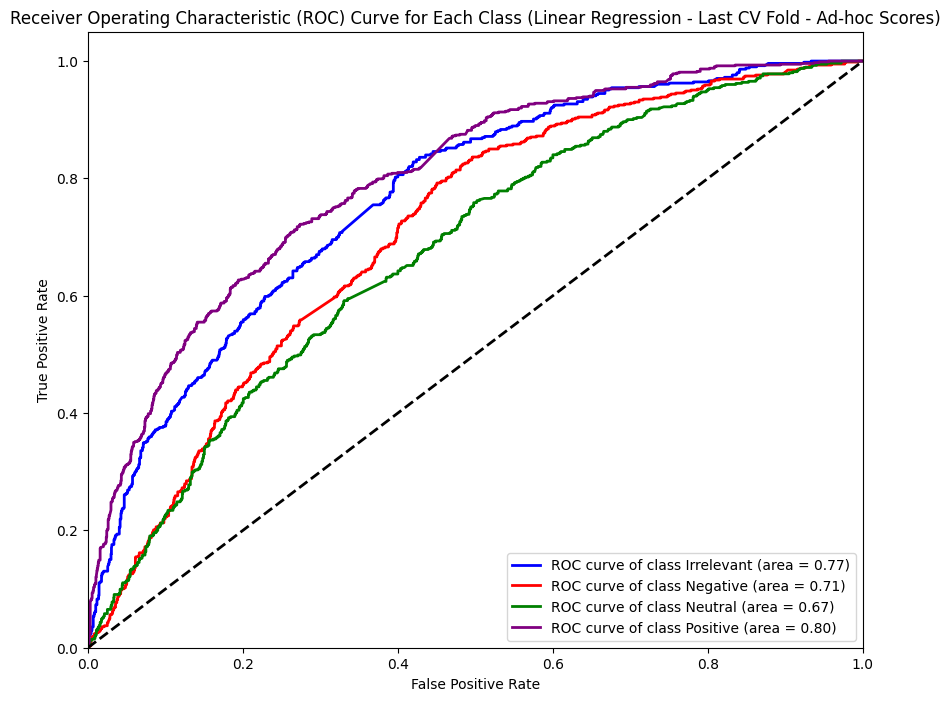

In [79]:
# Linear Regression
# With Cross Validation

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    mean_squared_error,
    r2_score,
    roc_curve,
    auc,
    classification_report,
    confusion_matrix,
)
from sklearn.model_selection import KFold
import numpy as np
import seaborn as sns
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming X, y, and label_encoder are already defined from previous cells (e.g., bKc9X6iL8qdT)

# Step 6: Implement 5-Fold Cross-Validation with Linear Regression

# Define the number of folds
n_splits_lr_cv = 5  # Using 5-Fold

# Initialize KFold cross-validation
kf_lr_cv = KFold(n_splits=n_splits_lr_cv, shuffle=True, random_state=42)

fold_r2_scores_lr_cv = []  # Store R-squared scores for each fold
fold_cms_lr_cv = []  # Store confusion matrices for each fold
fold_roc_aucs_lr_cv = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class per fold

print(f"\nPerforming {n_splits_lr_cv}-Fold Cross-Validation with Linear Regression:")

# Variables to store data for the last fold's ROC plot
last_fold_y_test_binarized_lr_cv = None
last_fold_y_score_lr_cv = None
last_fold_label_encoder_classes_lr_cv = label_encoder.classes_


# Iterate through each fold
for fold, (train_index, test_index) in enumerate(kf_lr_cv.split(X, y)):
    print(f"✅Fold {fold+1}/{n_splits_lr_cv}")

    # Split data for the current fold
    X_train_fold_lr_cv, X_test_fold_lr_cv = X[train_index], X[test_index]
    # Use standard NumPy indexing for y
    y_train_fold_lr_cv, y_test_fold_lr_cv = y[train_index], y[test_index]

    # Initialize a new Linear Regression model for each fold
    reg_fold_lr_cv = LinearRegression()

    # Fit the model
    # Note: Linear Regression is not an iterative algorithm that uses 'epochs'.
    # Training involves a single step to find coefficients.
    print("  Training complete.")
    reg_fold_lr_cv.fit(X_train_fold_lr_cv, y_train_fold_lr_cv)

    # Evaluate the model on the test data for the current fold using R-squared
    y_pred_fold_reg_lr_cv = reg_fold_lr_cv.predict(X_test_fold_lr_cv)
    fold_r2_lr_cv = r2_score(y_test_fold_lr_cv, y_pred_fold_reg_lr_cv)
    print(f"  R-squared for Fold {fold+1}: {fold_r2_lr_cv:.4f}")
    fold_r2_scores_lr_cv.append(fold_r2_lr_cv)

    # Classification Metrics for the fold (requires rounding/clipping predictions)
    # Note: This is an ad-hoc approach for using a regression model for classification evaluation.
    y_pred_fold_classes_lr_cv = np.round(y_pred_fold_reg_lr_cv).astype(int)
    y_pred_fold_classes_lr_cv = np.clip(y_pred_fold_classes_lr_cv, 0, len(label_encoder.classes_) - 1)

    # Compute Confusion Matrix for the fold
    cm_fold_lr_cv = confusion_matrix(y_test_fold_lr_cv, y_pred_fold_classes_lr_cv, labels=np.arange(len(label_encoder.classes_)))
    fold_cms_lr_cv.append(cm_fold_lr_cv)

    # Compute ROC and AUC for the fold (using ad-hoc scores)
    # Note: Generating ROC/AUC for Linear Regression this way is unconventional.
    y_test_binarized_fold_lr_cv = label_binarize(y_test_fold_lr_cv, classes=np.arange(len(label_encoder.classes_)))
    y_score_fold_reg_lr_cv = y_pred_fold_reg_lr_cv # Use raw predictions as scores (ad-hoc)

    roc_auc_fold_lr_cv = {}
    for i in range(len(label_encoder.classes_)):
         epsilon = 1e-6 # Small value to prevent division by zero
         scores_for_class_i_fold_lr_cv = 1 / (np.abs(y_score_fold_reg_lr_cv - i) + epsilon)
         try:
             if np.sum(y_test_binarized_fold_lr_cv[:, i]) > 0: # Ensure class is in test set
                 fpr_fold_lr_cv, tpr_fold_lr_cv, _ = roc_curve(y_test_binarized_fold_lr_cv[:, i], scores_for_class_i_fold_lr_cv)
                 auc_fold_lr_cv = auc(fpr_fold_lr_cv, tpr_fold_lr_cv)
                 fold_roc_aucs_lr_cv[i].append(auc_fold_lr_cv)
                 roc_auc_fold_lr_cv[label_encoder.classes_[i]] = auc_fold_lr_cv
             else:
                  roc_auc_fold_lr_cv[label_encoder.classes_[i]] = np.nan # Indicate missing AUC
         except ValueError as e:
              print(f"  Error computing ROC/AUC for class {label_encoder.classes_[i]} in fold {fold+1}: {e}")
              roc_auc_fold_lr_cv[label_encoder.classes_[i]] = np.nan

    print(f"  ROC AUC per class for Fold {fold+1}: {roc_auc_fold_lr_cv}")

    # Store data for the last fold's ROC plot
    if fold == n_splits_lr_cv - 1:
        last_fold_y_test_binarized_lr_cv = y_test_binarized_fold_lr_cv
        last_fold_y_score_lr_cv = y_score_fold_reg_lr_cv


    print("-" * 30) # Add a separator line after each fold


# Print the results of cross-validation
print("\n--- Average Metrics Across Folds (Linear Regression CV) ---") # Added header
print(f"Mean cross-validation R-squared: {np.mean(fold_r2_scores_lr_cv):.4f}")
print(f"Standard deviation of cross-validation R-squared: {np.std(fold_r2_scores_lr_cv):.4f}")

# Average Classification Metrics (based on rounded predictions)
# Averaging classification reports and confusion matrices directly can be misleading.
# We'll show the mean confusion matrix.

mean_cm_lr_cv = np.mean(fold_cms_lr_cv, axis=0).astype(int)
print("\nMean Confusion Matrix across folds (Linear Regression - Rounded Predictions):")
print(mean_cm_lr_cv)

# Print mean AUC for each class
print("\nMean Cross-validation AUC per class (Linear Regression - Ad-hoc Scores):")
avg_roc_auc_per_class_lr_cv = {}
for i in range(len(label_encoder.classes_)):
    class_auc_values = [auc for auc in fold_roc_aucs_lr_cv[i] if not np.isnan(auc)]
    if class_auc_values:
        avg_roc_auc_per_class_lr_cv[label_encoder.classes_[i]] = np.mean(class_auc_values)
        print(f"  Class {label_encoder.classes_[i]} (Area = {avg_roc_auc_per_class_lr_cv[label_encoder.classes_[i]]:0.2f})")
    else:
        avg_roc_auc_per_class_lr_cv[label_encoder.classes_[i]] = np.nan
        print(f"  Class {label_encoder.classes_[i]}: No valid AUC computed across folds")


# Visualizations (Mean Confusion Matrix and ROC curves from one fold as representative)

plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm_lr_cv, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (Linear Regression CV - Rounded Predictions)")
plt.show()

# Plotting ROC curves from the last fold for visualization (as a representative example)
if last_fold_y_test_binarized_lr_cv is not None and last_fold_y_score_lr_cv is not None:
    try:
        y_test_binarized_last_fold = last_fold_y_test_binarized_lr_cv
        y_score_last_fold_reg = last_fold_y_score_lr_cv
        last_fold_label_encoder_classes = label_encoder.classes_ # Use the global label_encoder

        fpr_last_fold_lr = dict()
        tpr_last_fold_lr = dict()
        roc_auc_last_fold_lr = dict()

        plt.figure(figsize=(10, 8))
        colors = ['blue', 'red', 'green', 'purple']
        n_classes_lr = len(label_encoder.classes_)

        for i in range(n_classes_lr):
            epsilon = 1e-6
            # Use the ad-hoc scoring method based on inverse distance to class label
            scores_for_class_i_last_fold = 1 / (np.abs(y_score_last_fold_reg - i) + epsilon)

            if np.sum(y_test_binarized_last_fold[:, i]) > 0: # Ensure class is in test set
                fpr_last_fold_lr[i], tpr_last_fold_lr[i], _ = roc_curve(y_test_binarized_last_fold[:, i], scores_for_class_i_last_fold)
                roc_auc_last_fold_lr[i] = auc(fpr_last_fold_lr[i], tpr_last_fold_lr[i])
                plt.plot(fpr_last_fold_lr[i], tpr_last_fold_lr[i], color=colors[i % len(colors)], lw=2,
                         label='ROC curve of class {0} (area = {1:.2f})'.format(label_encoder.classes_[i], roc_auc_last_fold_lr[i]))
            else:
                print(f"  Warning: Class {label_encoder.classes_[i]} not present in the last fold test set for ROC/AUC plotting.")


        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Linear Regression - Last CV Fold - Ad-hoc Scores)')
        plt.legend(loc="lower right")
        plt.show()
    except Exception as e:
        print(f"\nError plotting ROC curves for the last CV fold: {e}")
else:
    print("\nCould not plot ROC curves for the last CV fold (data not available).")


# Note: The interpretation of classification metrics and ROC/AUC for a Linear Regression
# model used for multi-class classification (especially with this ad-hoc scoring method)
# should be done with caution. Logistic Regression or other dedicated classifiers are
# generally more appropriate for this type of task.

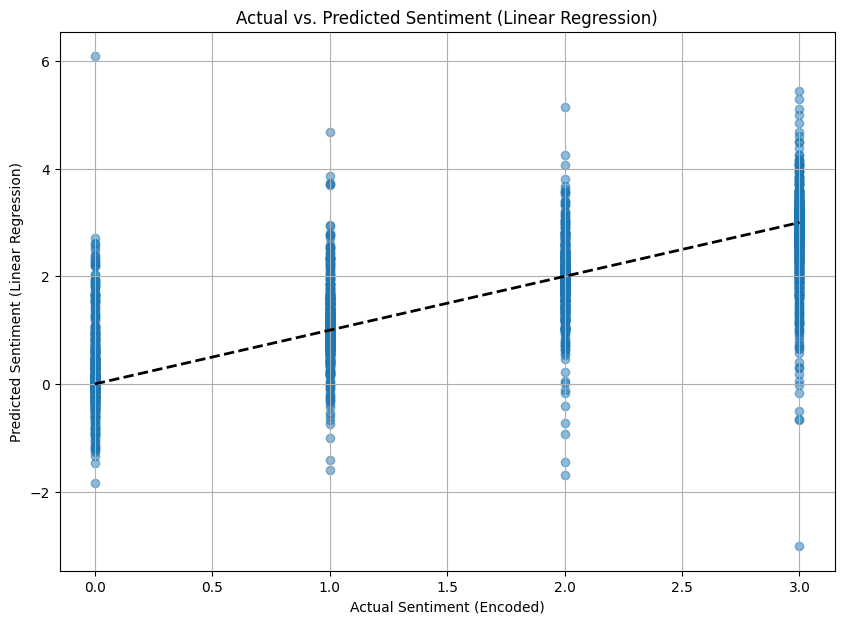

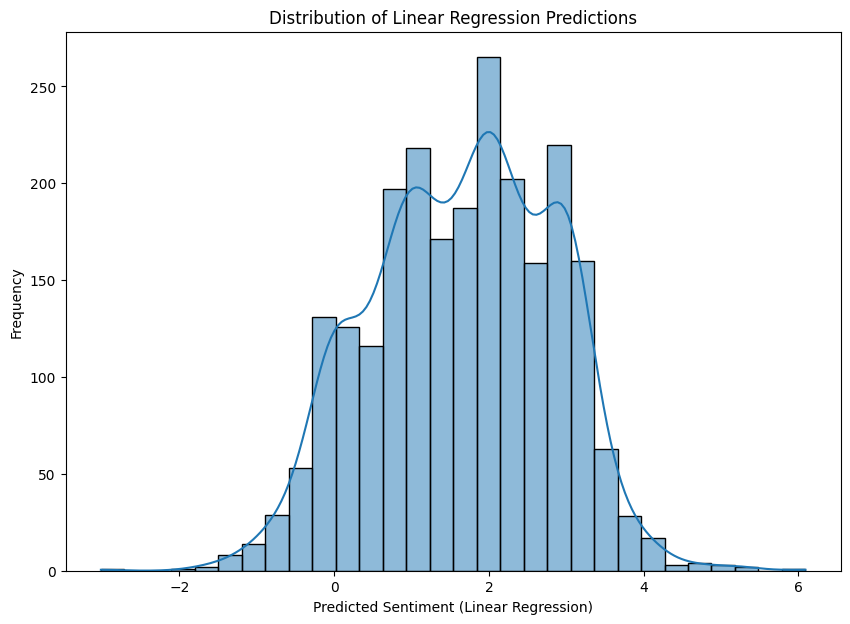

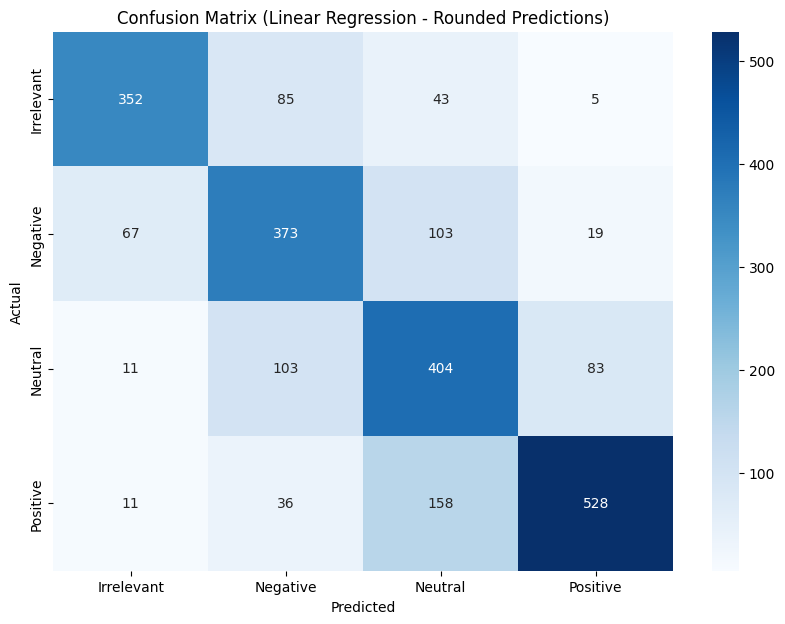

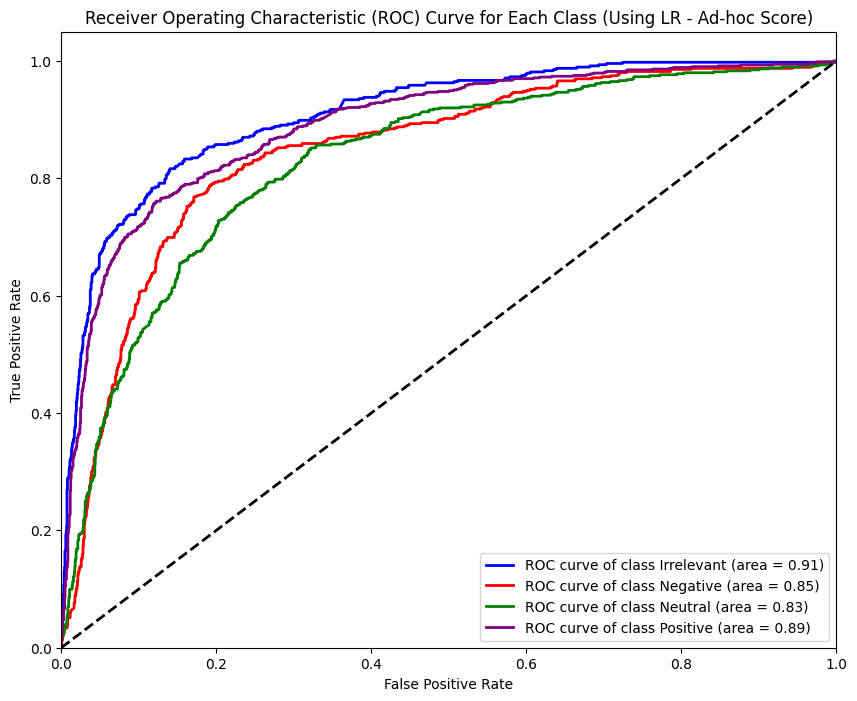

In [23]:
# Visualization of Comparison (Linear Regression)

# Visualize Linear Regression predictions vs true values (Regression context)
# This is more meaningful in a true regression task, but can show how predictions spread
plt.figure(figsize=(10, 7))
plt.scatter(y_test, y_pred_lr, alpha=0.5)
plt.xlabel("Actual Sentiment (Encoded)")
plt.ylabel("Predicted Sentiment (Linear Regression)")
plt.title("Actual vs. Predicted Sentiment (Linear Regression)")
# Plot a line of perfect prediction
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.grid(True)
plt.show()


# Visualize the distribution of Linear Regression predictions
plt.figure(figsize=(10, 7))
sns.histplot(y_pred_lr, kde=True, bins=30)
plt.xlabel("Predicted Sentiment (Linear Regression)")
plt.ylabel("Frequency")
plt.title("Distribution of Linear Regression Predictions")
plt.show()


# Visualize the Confusion Matrix (derived from rounded/clipped predictions)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_lr, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Linear Regression - Rounded Predictions)")
plt.show()

# ROC Curve visualization (as computed using the ad-hoc score method)
# Re-plot the ROC curves for Linear Regression if the previous code block was executed
plt.figure(figsize=(10, 8))
colors = [
    "blue",
    "red",
    "green",
    "purple",
]  # Adjust colors based on number of classes
n_classes = len(label_encoder.classes_)
for i, color in zip(range(n_classes), colors):
  # Ensure the class exists in the test set and ROC was computed
  if i in fpr and i in tpr and i < len(label_encoder.classes_):
    plt.plot(
        fpr[i],
        tpl[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(
            label_encoder.classes_[i], roc_auc[i]
        ),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve for Each Class (Using LR - Ad-hoc Score)")
plt.legend(loc="lower right")
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



Classification Report (Logistic Regression):
              precision    recall  f1-score   support

  Irrelevant       0.65      0.51      0.57       479
    Negative       0.71      0.73      0.72       553
     Neutral       0.74      0.63      0.68       565
    Positive       0.65      0.80      0.72       784

    accuracy                           0.68      2381
   macro avg       0.69      0.66      0.67      2381
weighted avg       0.69      0.68      0.68      2381


Confusion Matrix (Logistic Regression):


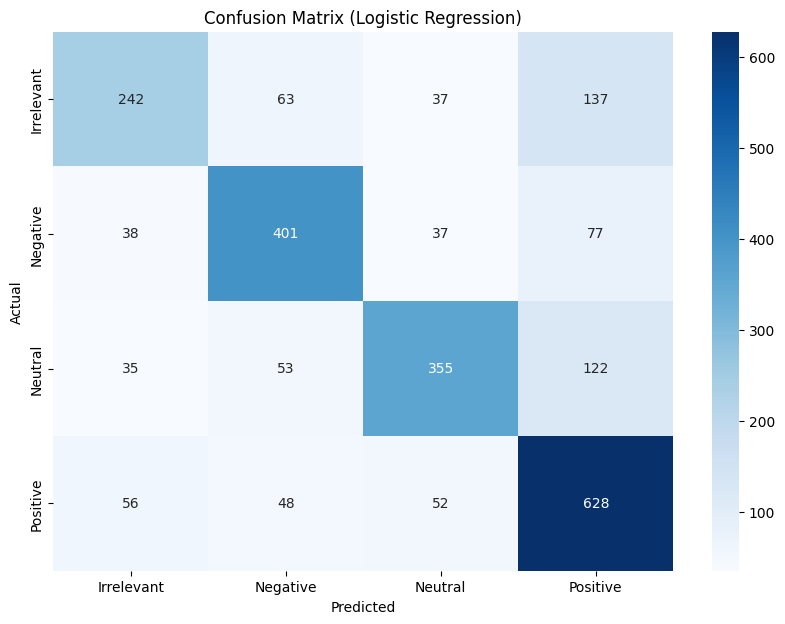

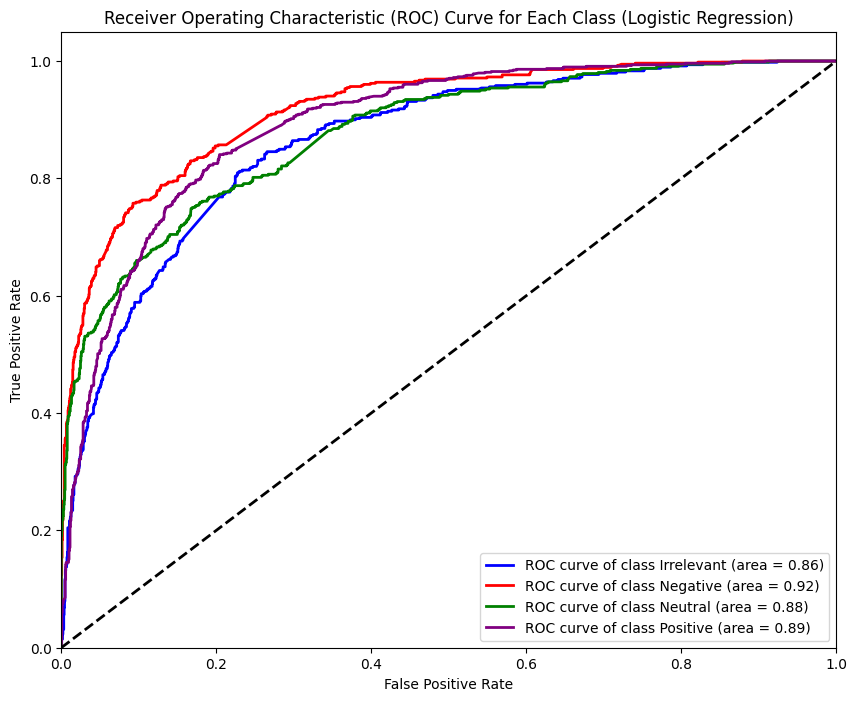

In [80]:
# Logistic Regression
# Without cross validation

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Step 5: Train Logistic Regression and evaluate
# Initialize a Logistic Regression model
# Use multi_class='ovr' for multi-class problems with ROC/AUC or 'auto'
log_reg = LogisticRegression(multi_class='auto', solver='liblinear', random_state=42)
log_reg.fit(X_train, y_train)

# Make predictions
y_pred_log_reg = log_reg.predict(X_test)

# Classification Report and Confusion Matrix (without cross-validation)
print("\nClassification Report (Logistic Regression):")
print(classification_report(y_test, y_pred_log_reg, target_names=label_encoder.classes_))

print("\nConfusion Matrix (Logistic Regression):")
cm_log_reg = confusion_matrix(y_test, y_pred_log_reg)

plt.figure(figsize=(10, 7))
sns.heatmap(cm_log_reg, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Logistic Regression)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the output
y_test_binarized = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes = y_test_binarized.shape[1]

# Get predicted probabilities (required for ROC curve)
y_score_log_reg = log_reg.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score_log_reg[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Logistic Regression)')
plt.legend(loc="lower right")
plt.show()


===== Fold 1 =====

--- Epoch 1 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



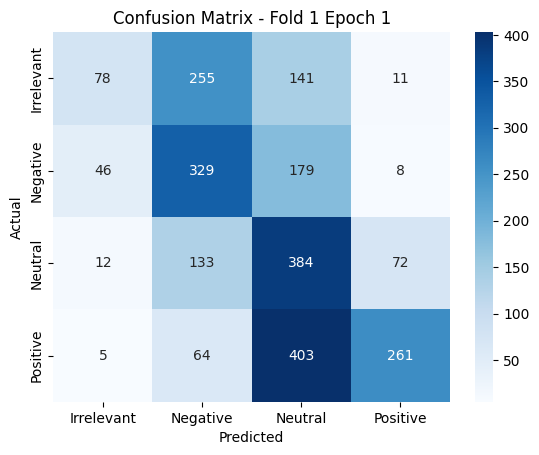

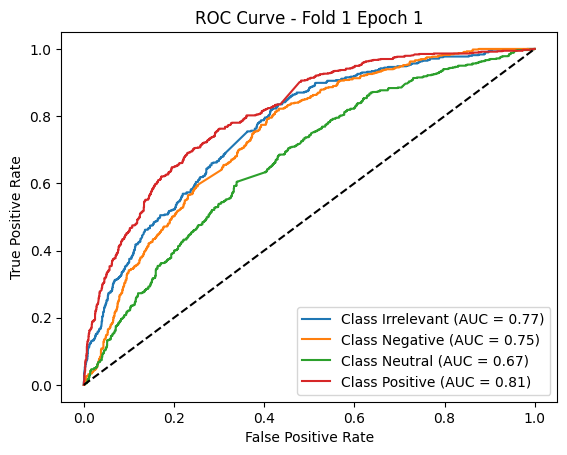


--- Epoch 2 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



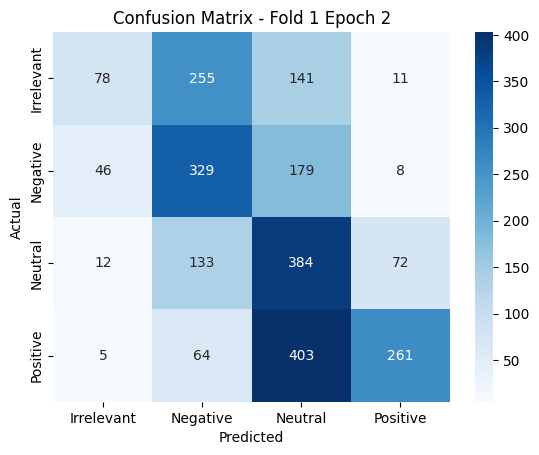

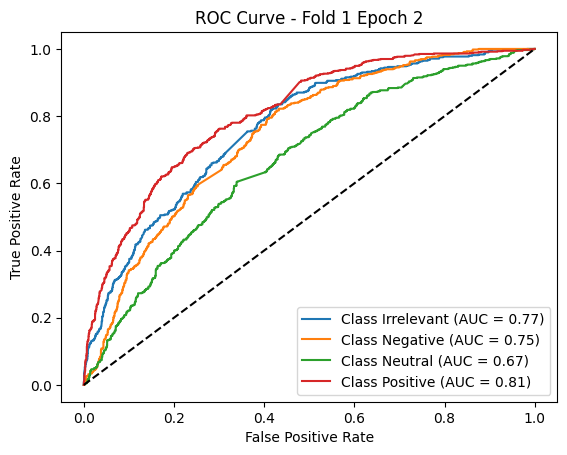


--- Epoch 3 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



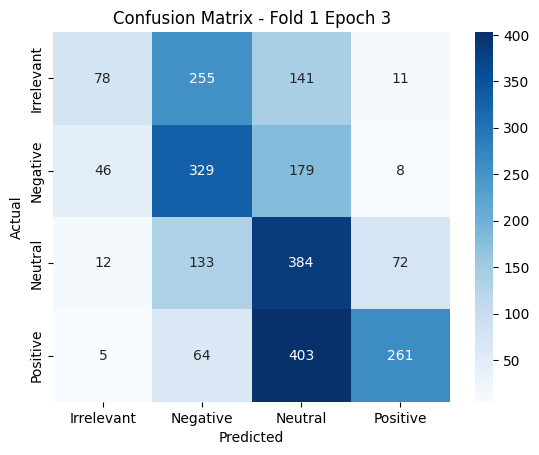

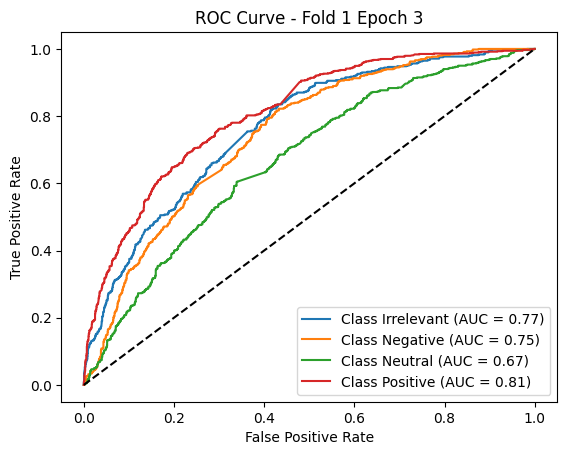


--- Epoch 4 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



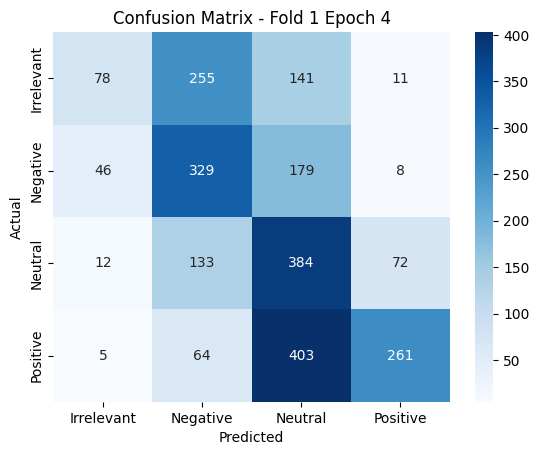

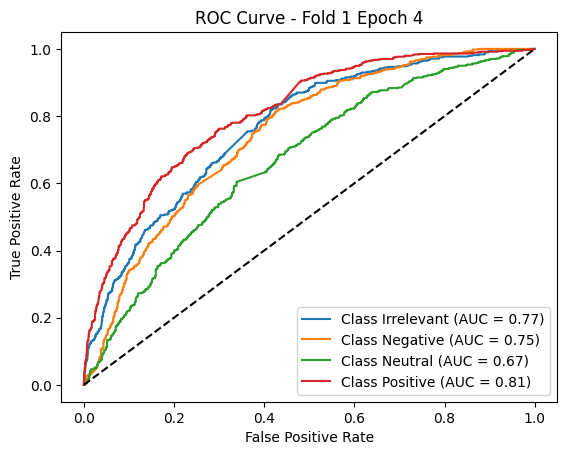


--- Epoch 5 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



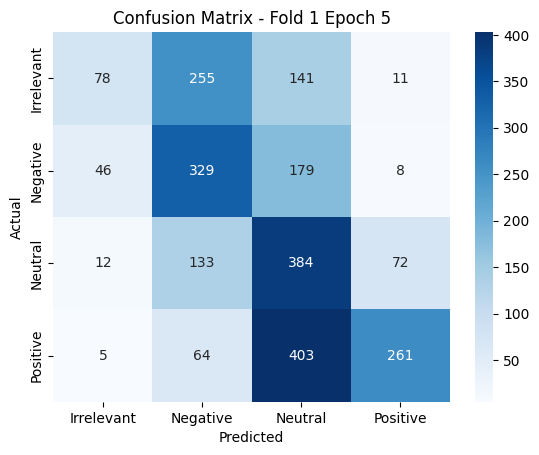

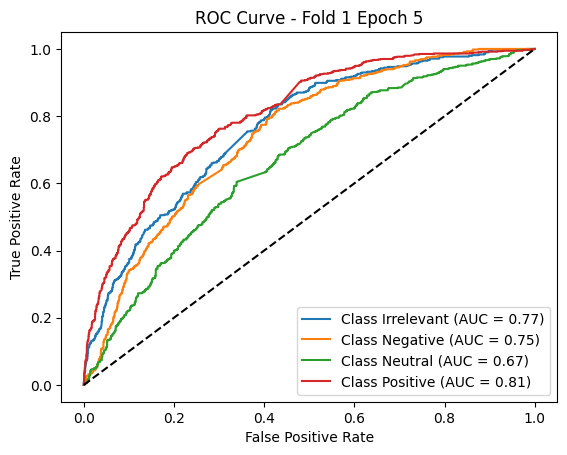


--- Epoch 6 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



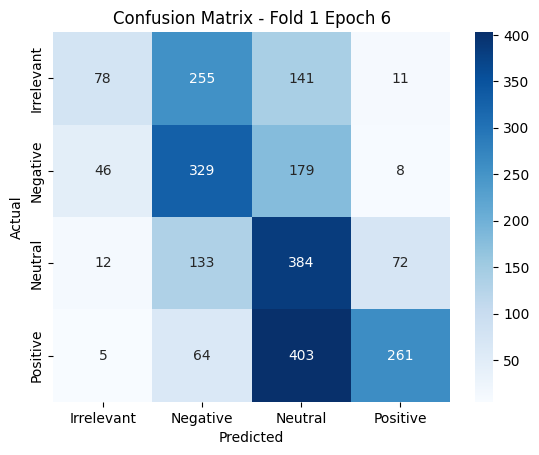

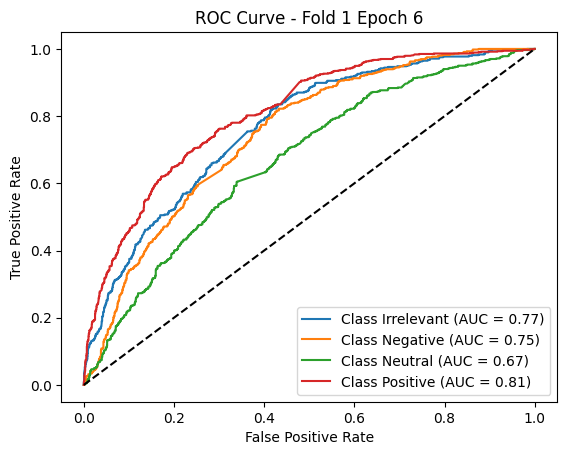


--- Epoch 7 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



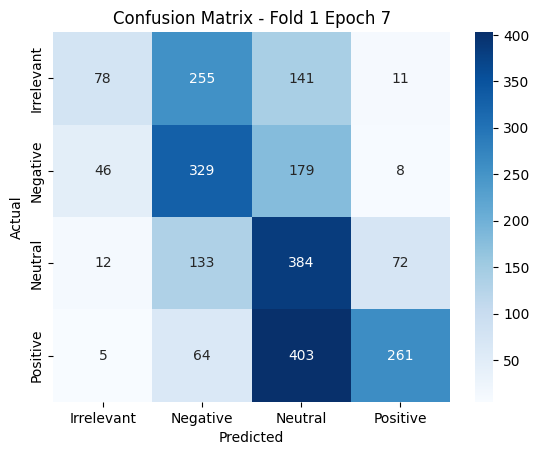

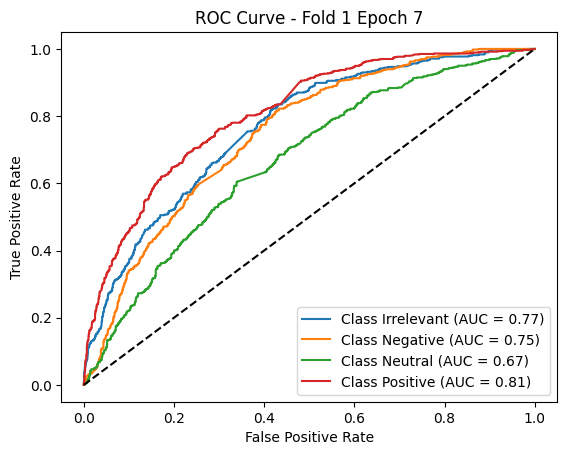


--- Epoch 8 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



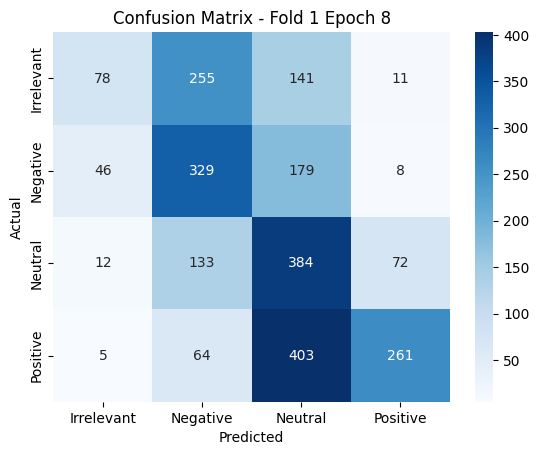

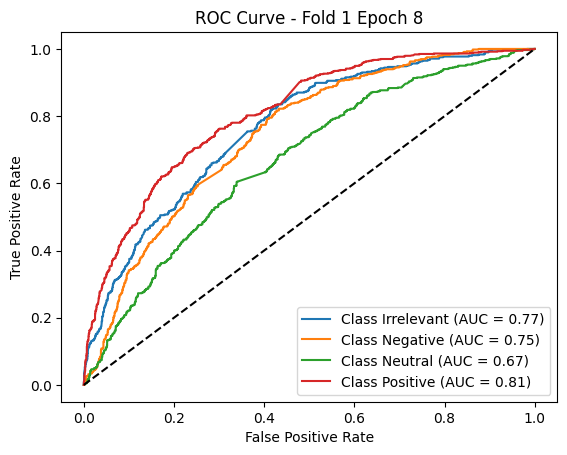


--- Epoch 9 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



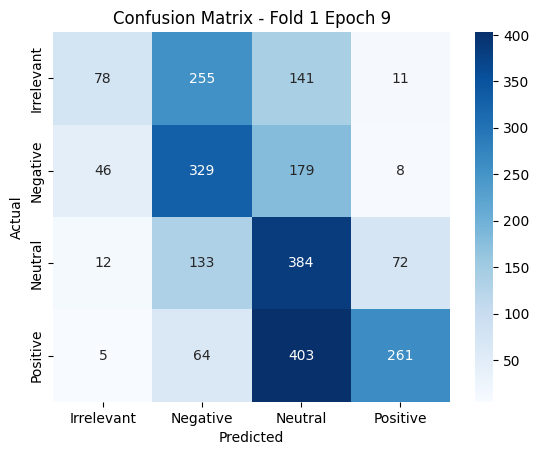

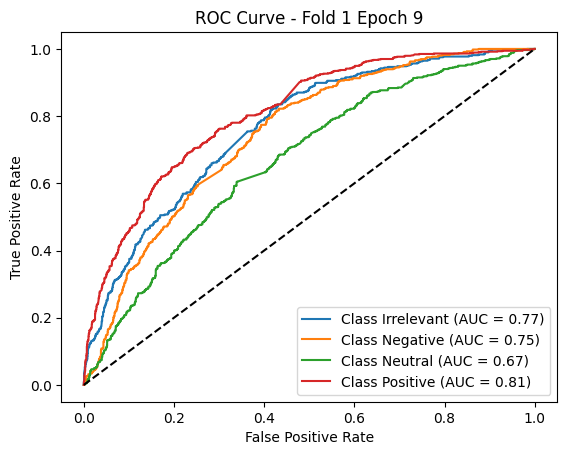


--- Epoch 10 ---
              precision    recall  f1-score   support

  Irrelevant       0.55      0.16      0.25       485
    Negative       0.42      0.59      0.49       562
     Neutral       0.35      0.64      0.45       601
    Positive       0.74      0.36      0.48       733

    accuracy                           0.44      2381
   macro avg       0.52      0.44      0.42      2381
weighted avg       0.53      0.44      0.43      2381



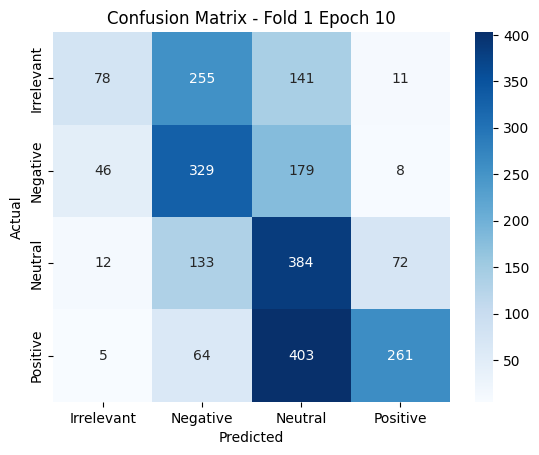

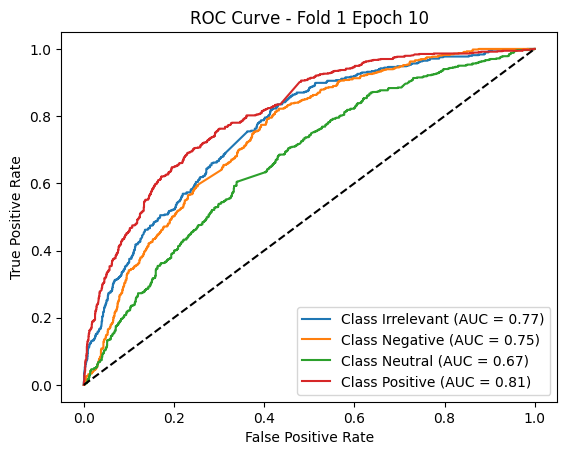


===== Fold 2 =====

--- Epoch 1 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



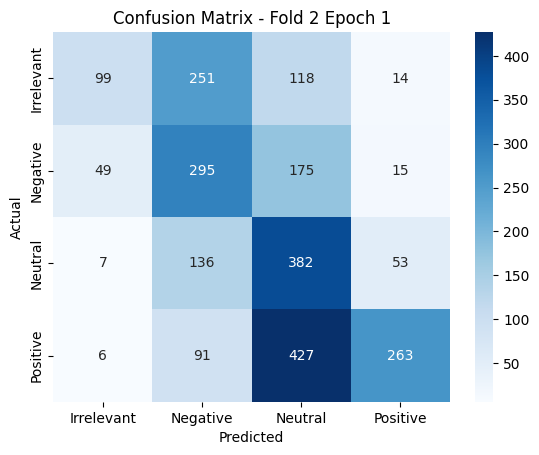

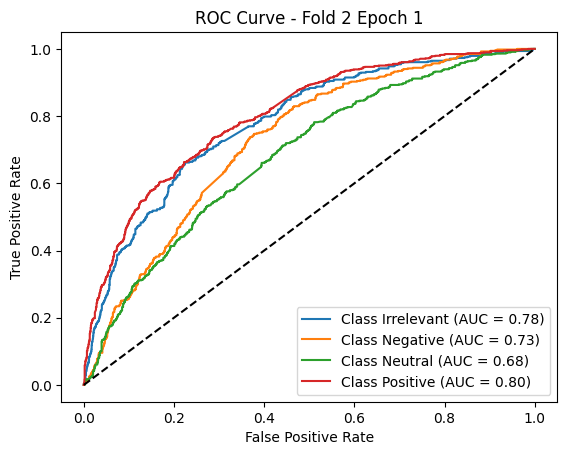


--- Epoch 2 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



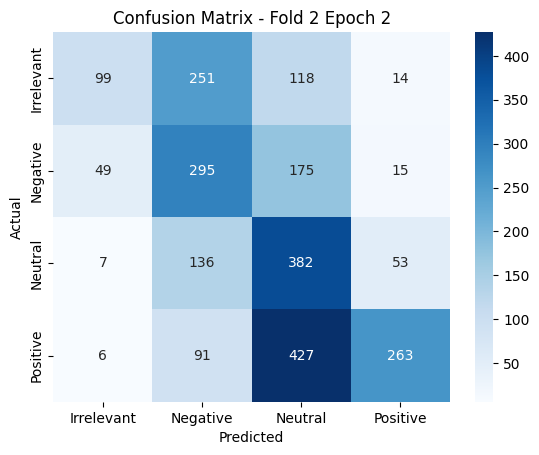

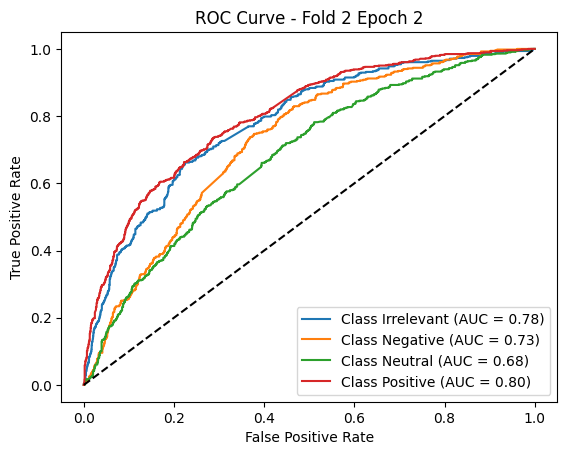


--- Epoch 3 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



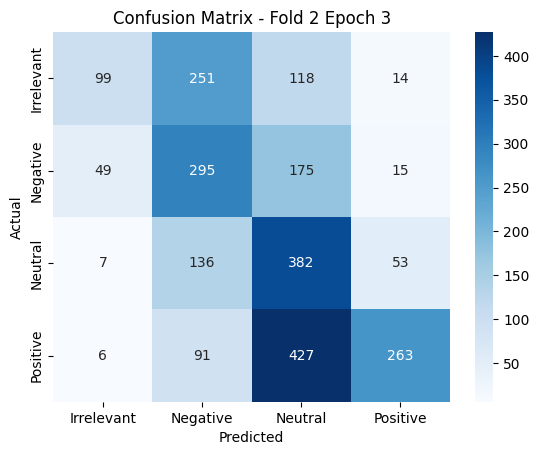

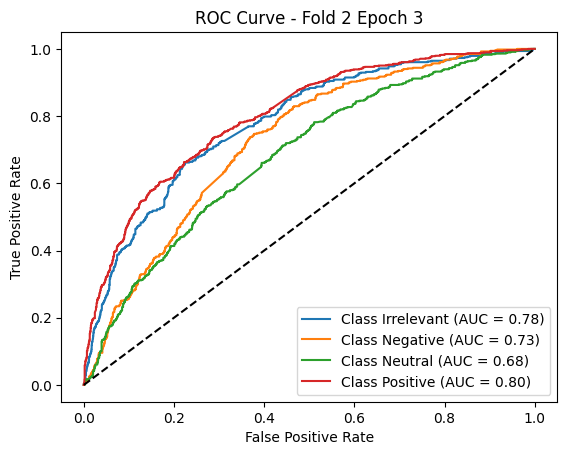


--- Epoch 4 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



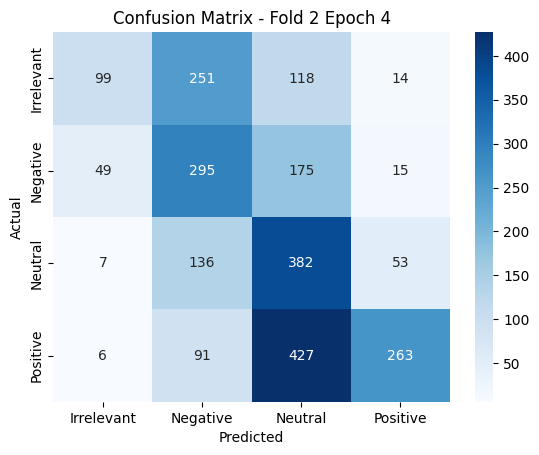

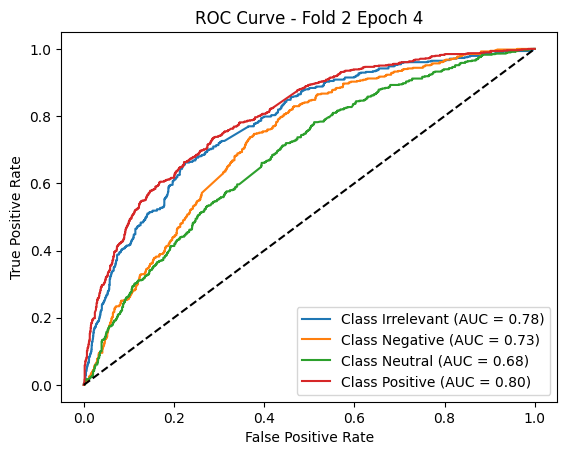


--- Epoch 5 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



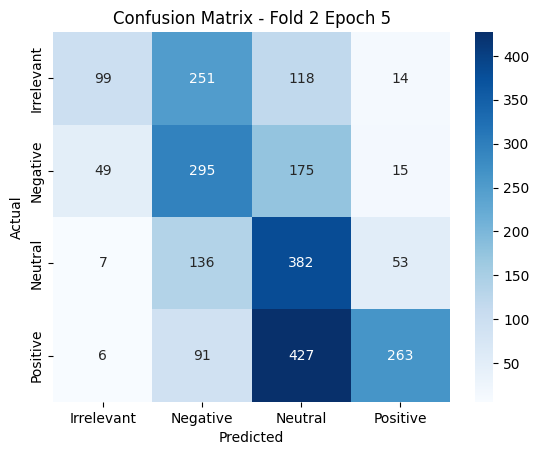

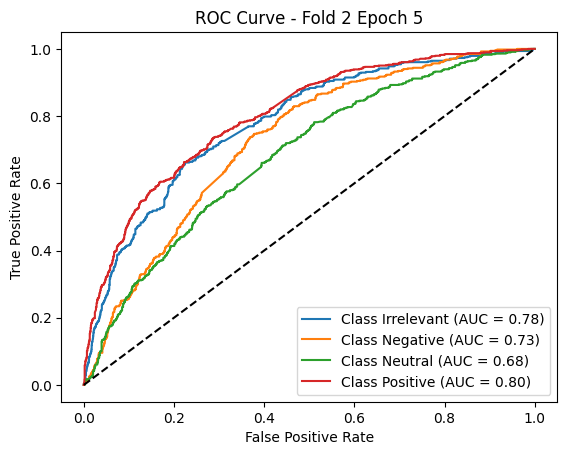


--- Epoch 6 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



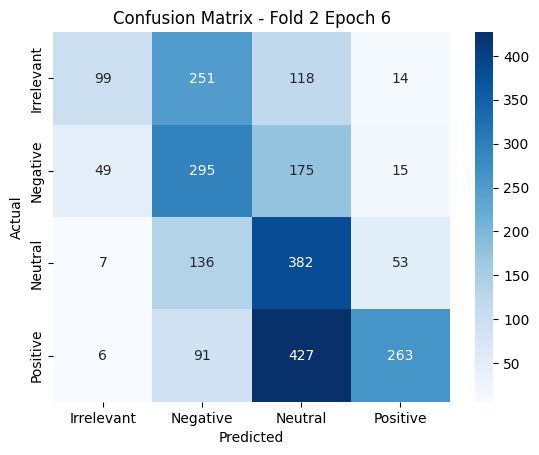

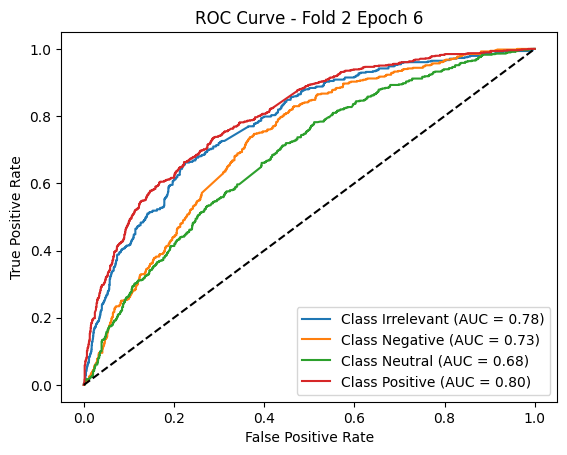


--- Epoch 7 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



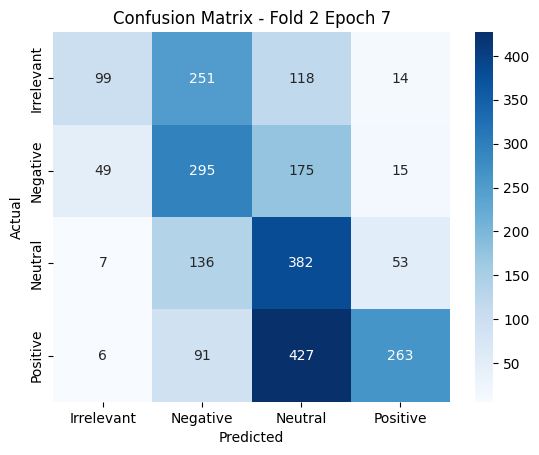

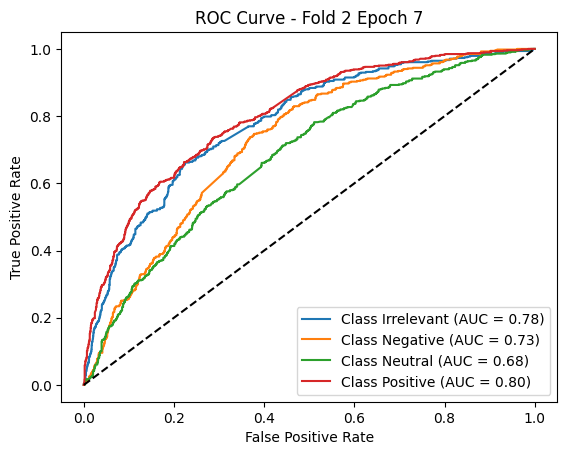


--- Epoch 8 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



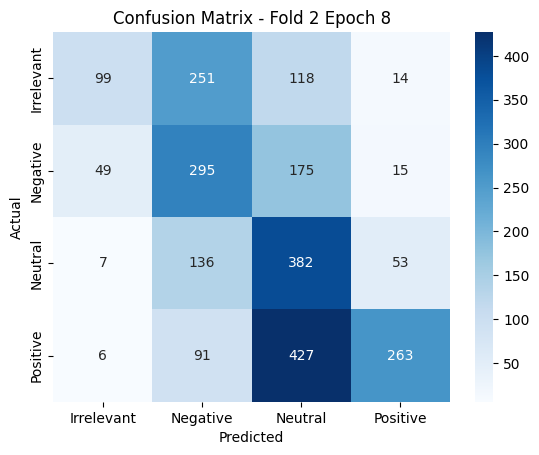

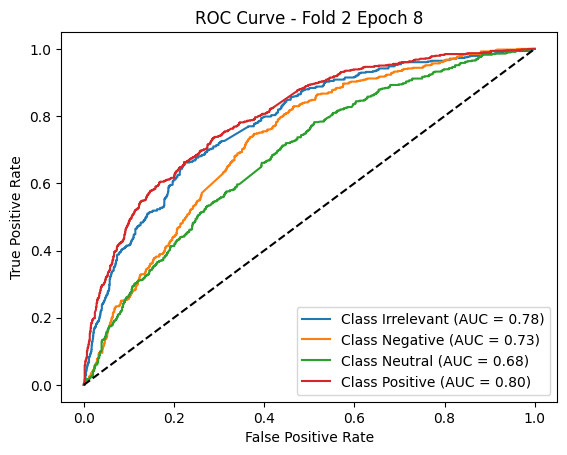


--- Epoch 9 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



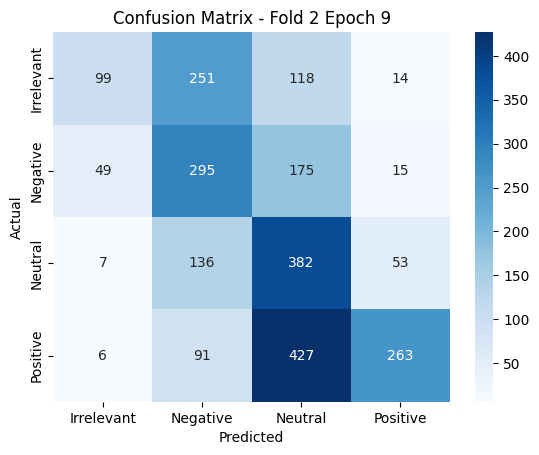

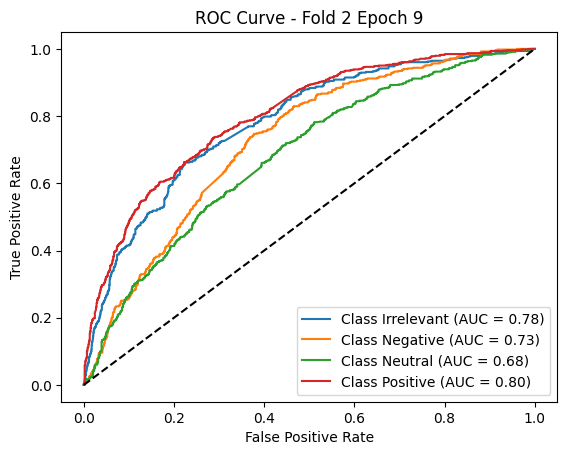


--- Epoch 10 ---
              precision    recall  f1-score   support

  Irrelevant       0.61      0.21      0.31       482
    Negative       0.38      0.55      0.45       534
     Neutral       0.35      0.66      0.45       578
    Positive       0.76      0.33      0.46       787

    accuracy                           0.44      2381
   macro avg       0.53      0.44      0.42      2381
weighted avg       0.55      0.44      0.43      2381



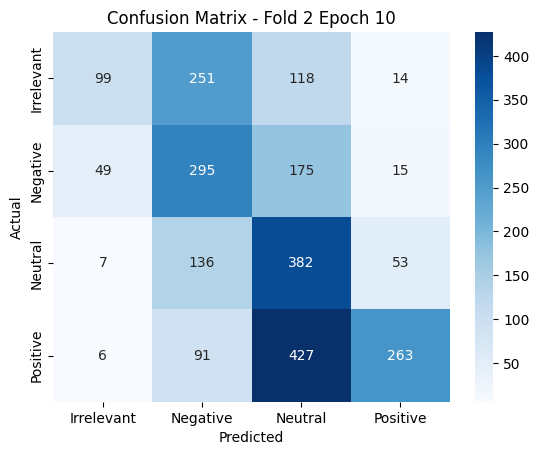

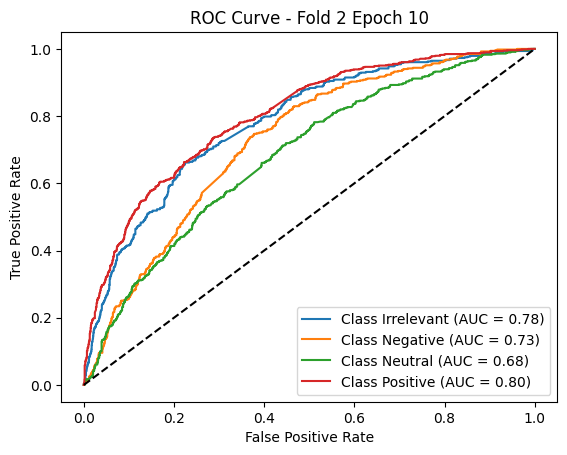


===== Fold 3 =====

--- Epoch 1 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



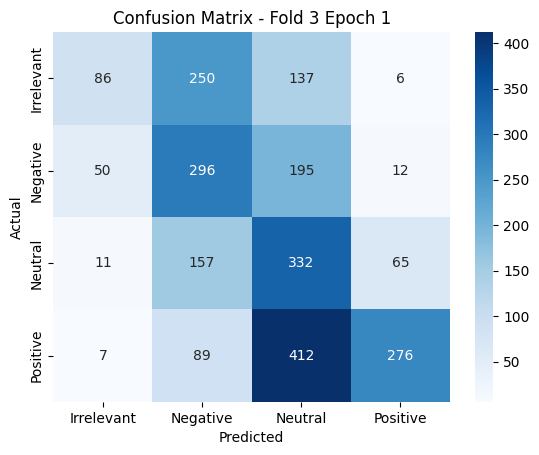

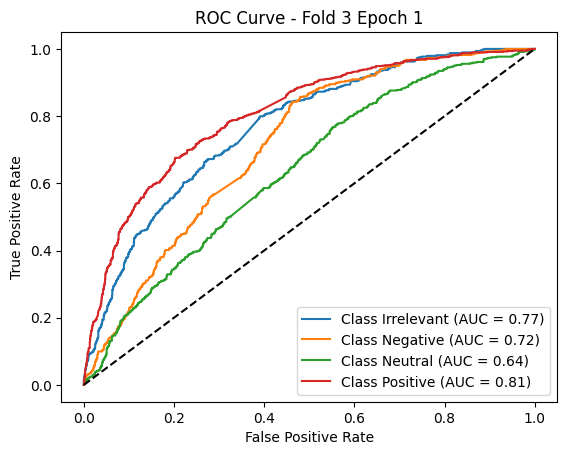


--- Epoch 2 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



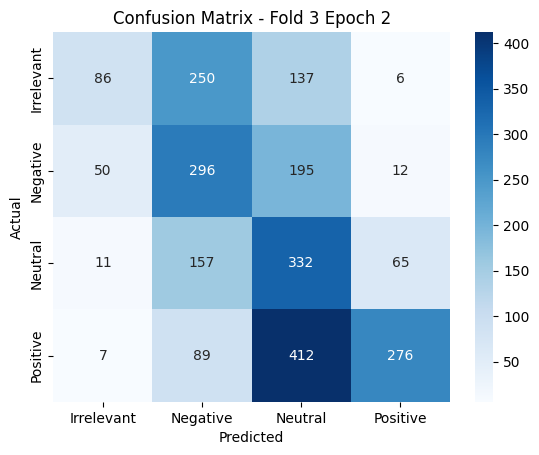

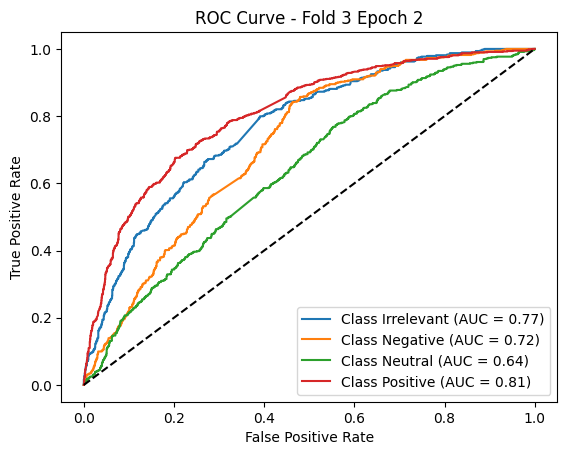


--- Epoch 3 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



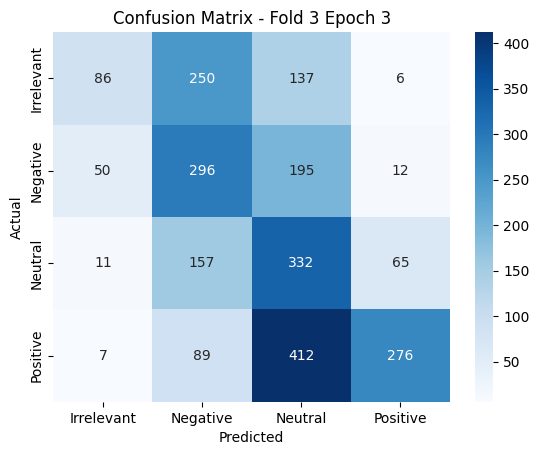

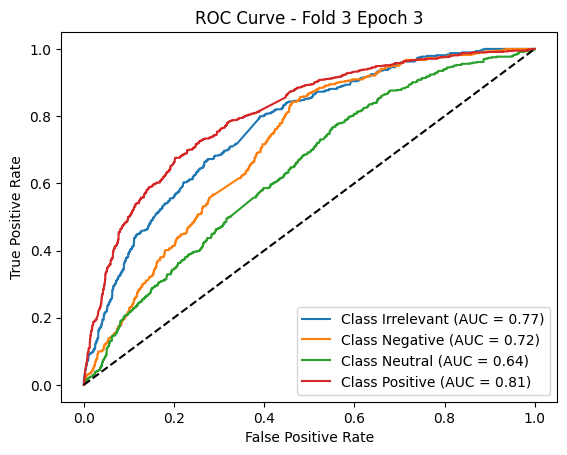


--- Epoch 4 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



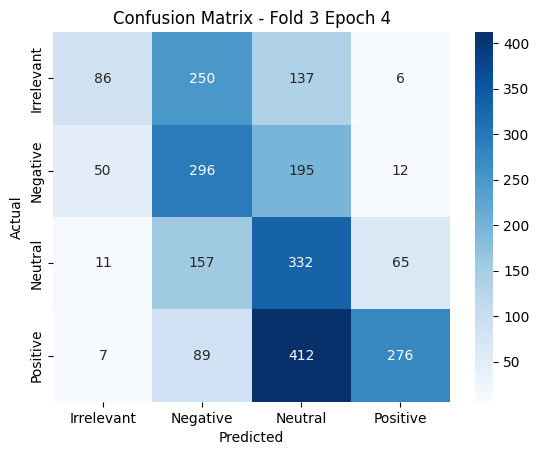

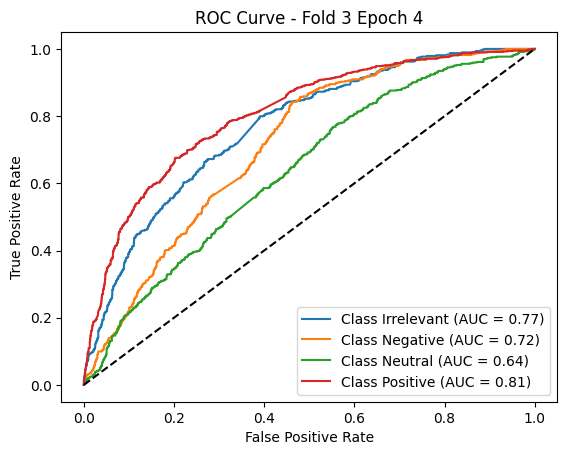


--- Epoch 5 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



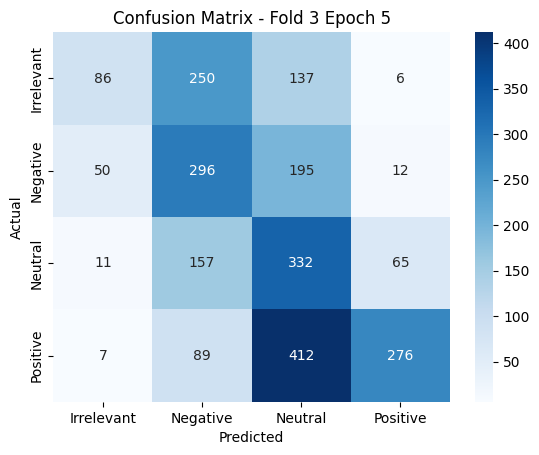

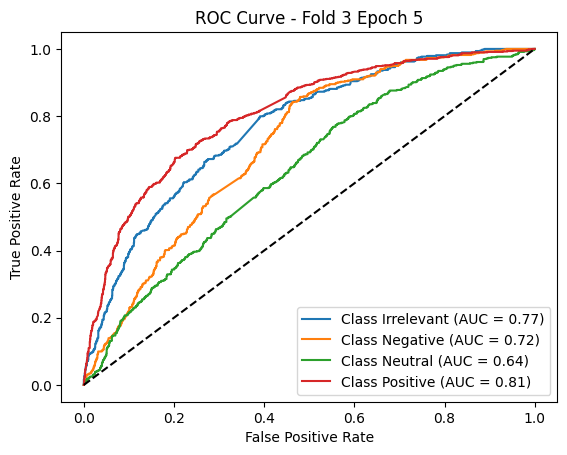


--- Epoch 6 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



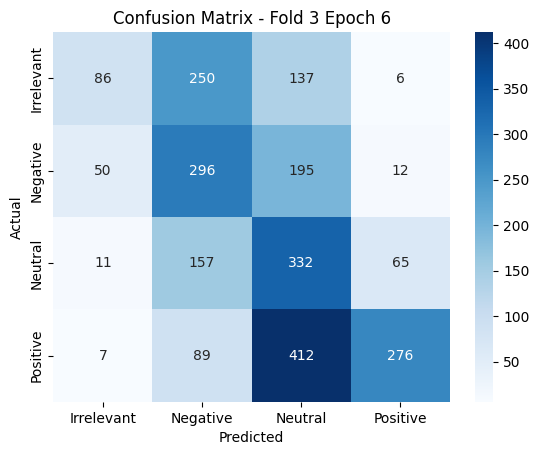

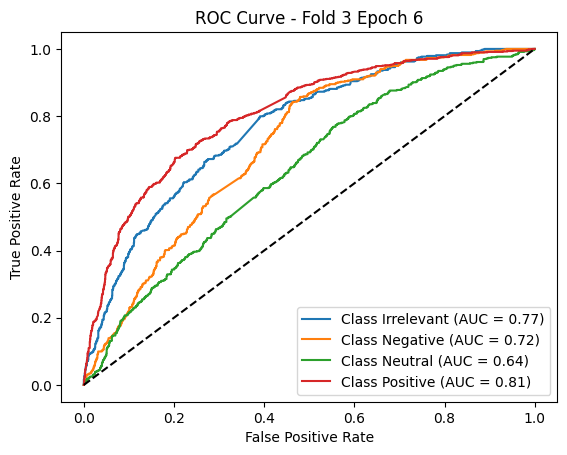


--- Epoch 7 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



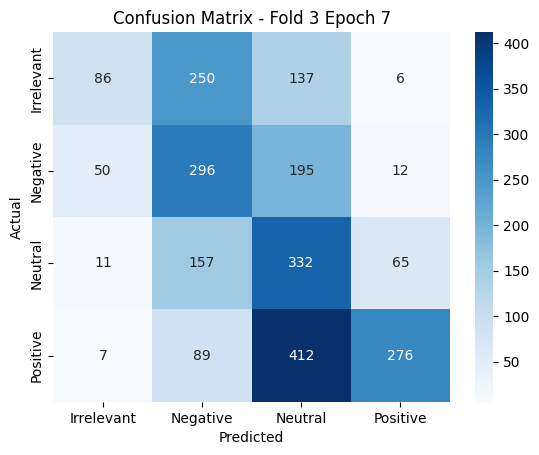

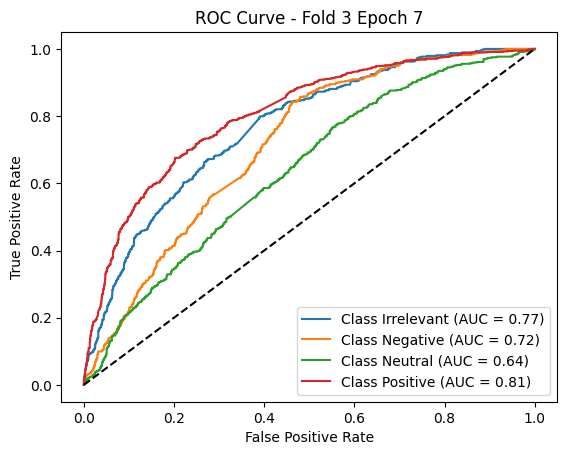


--- Epoch 8 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



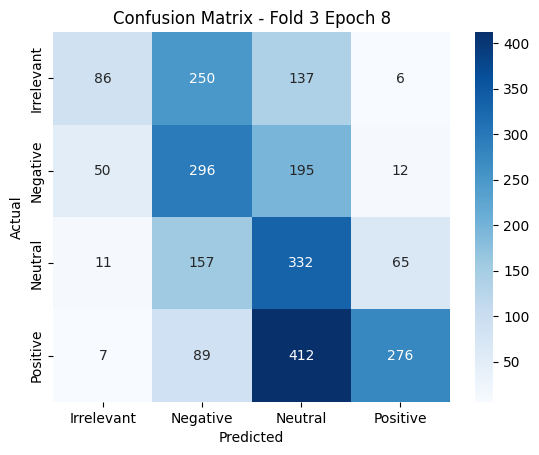

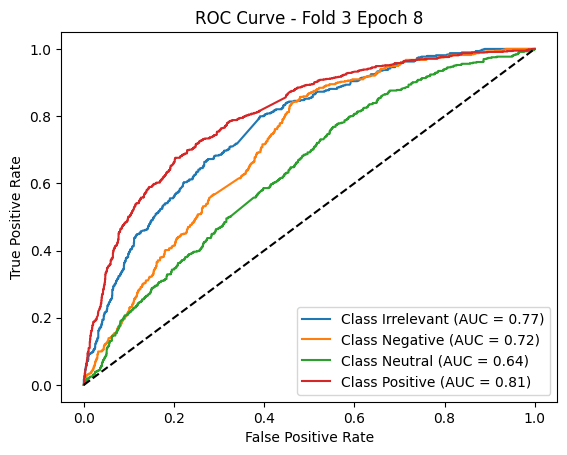


--- Epoch 9 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



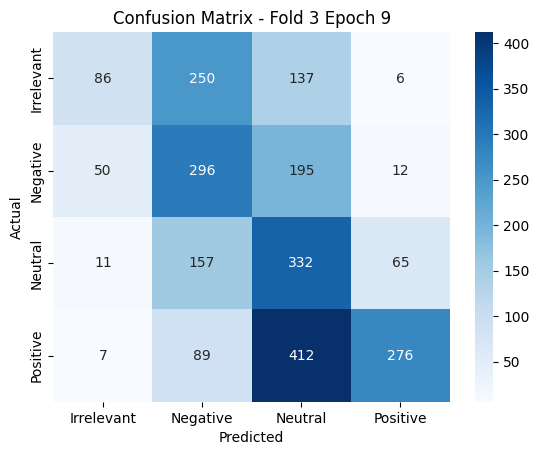

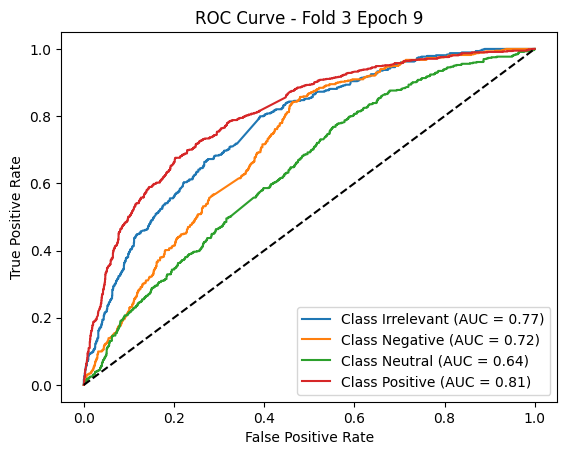


--- Epoch 10 ---
              precision    recall  f1-score   support

  Irrelevant       0.56      0.18      0.27       479
    Negative       0.37      0.54      0.44       553
     Neutral       0.31      0.59      0.40       565
    Positive       0.77      0.35      0.48       784

    accuracy                           0.42      2381
   macro avg       0.50      0.41      0.40      2381
weighted avg       0.53      0.42      0.41      2381



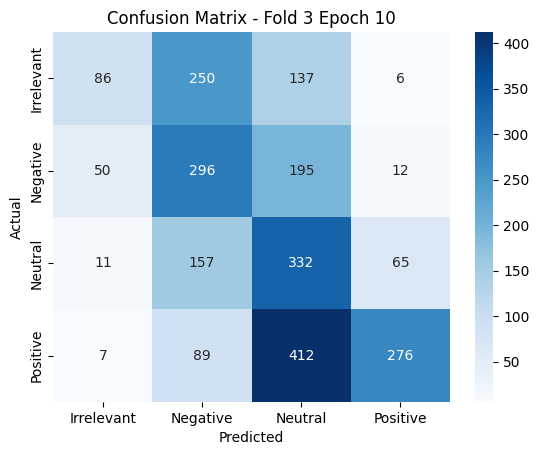

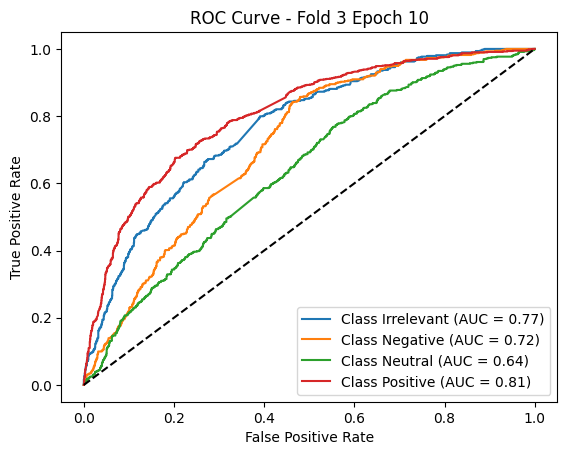


===== Fold 4 =====

--- Epoch 1 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



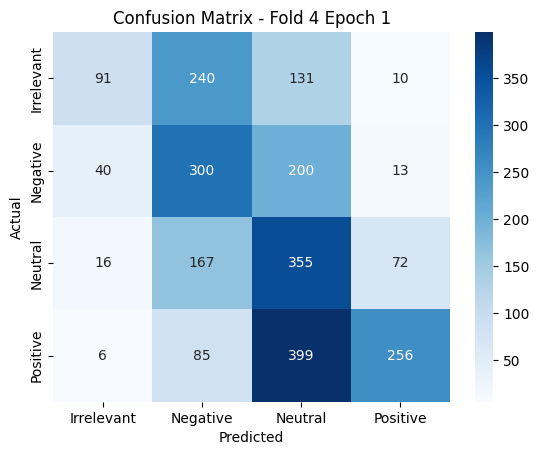

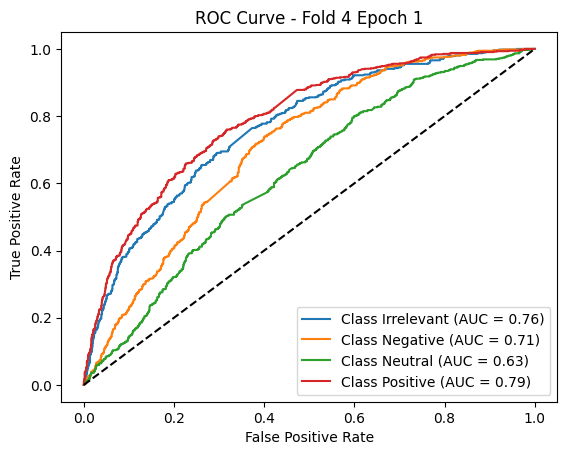


--- Epoch 2 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



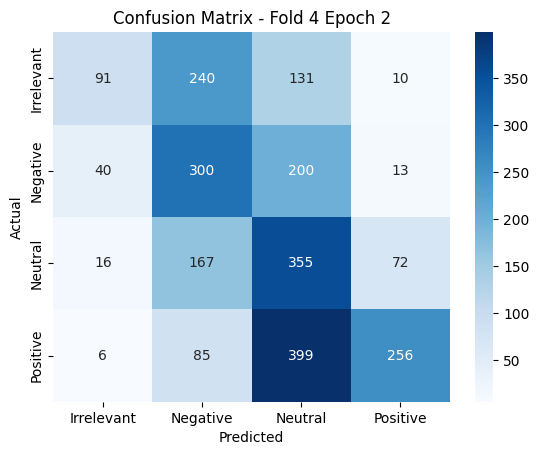

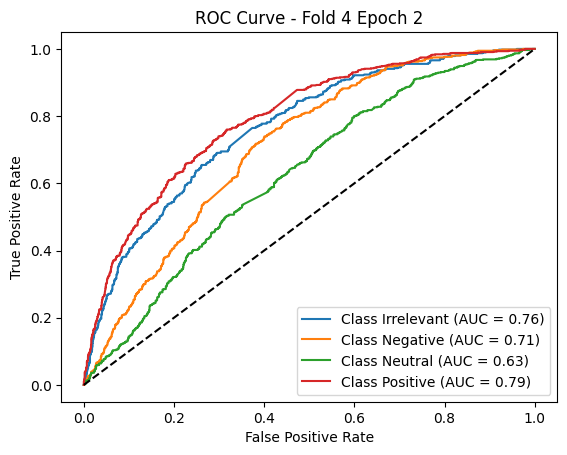


--- Epoch 3 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



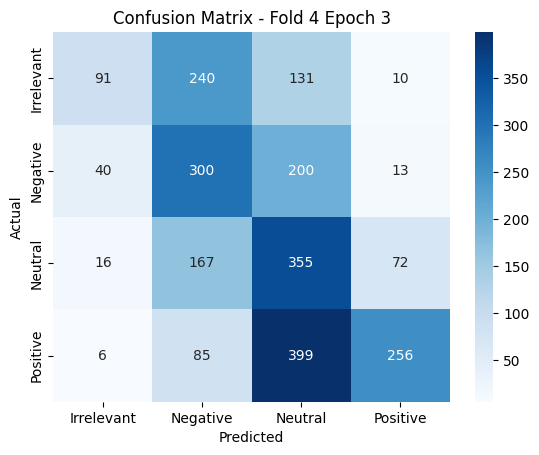

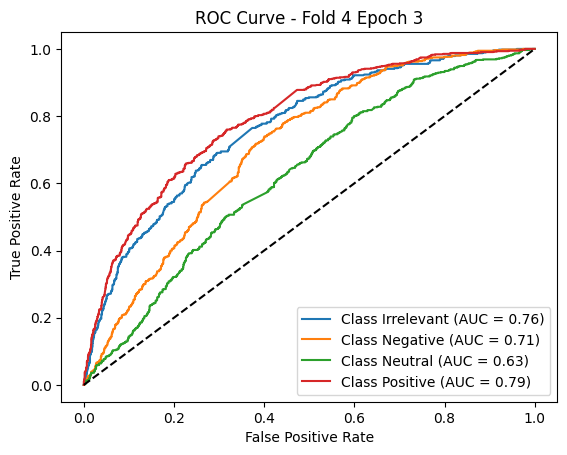


--- Epoch 4 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



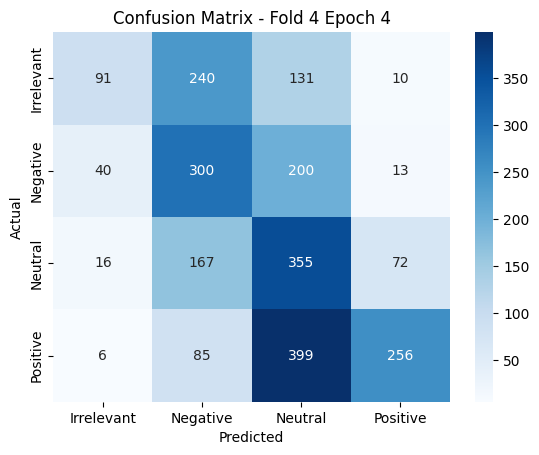

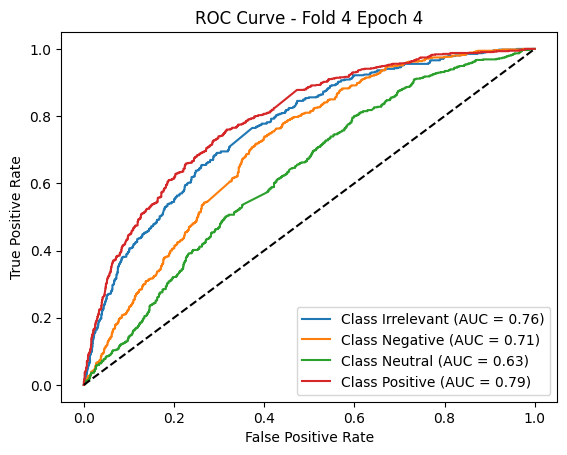


--- Epoch 5 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



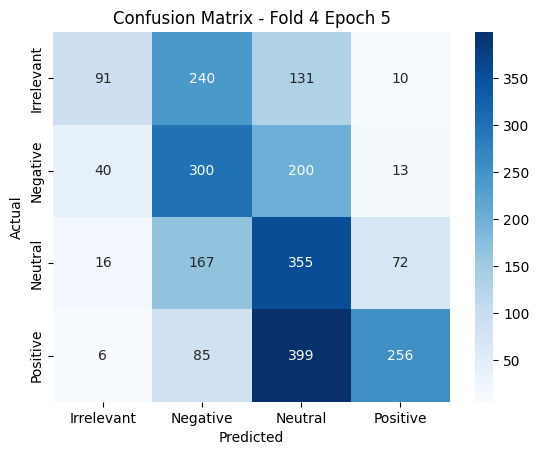

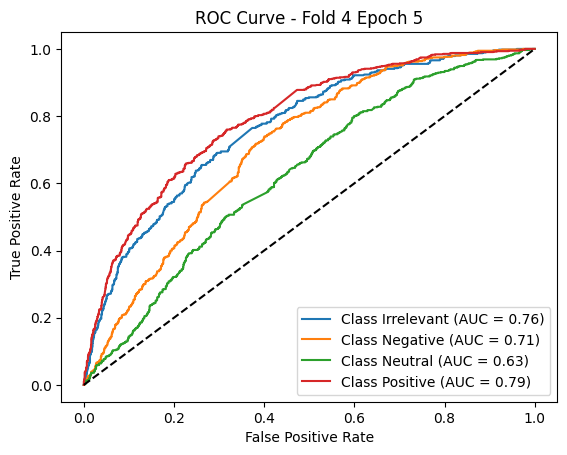


--- Epoch 6 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



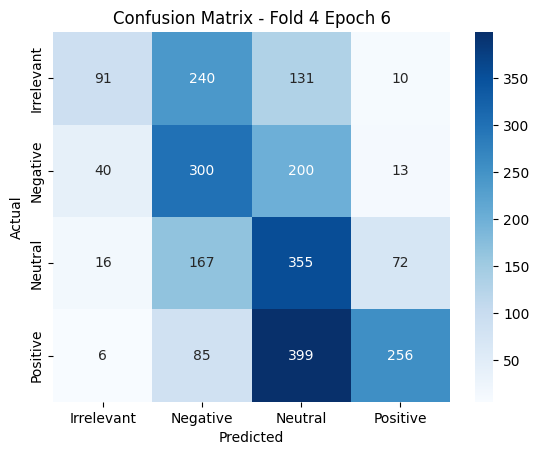

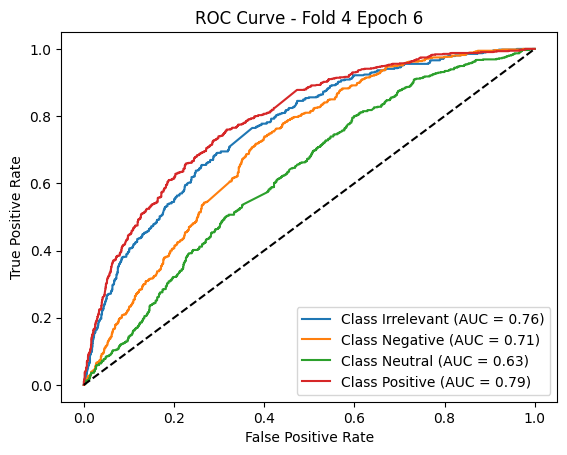


--- Epoch 7 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



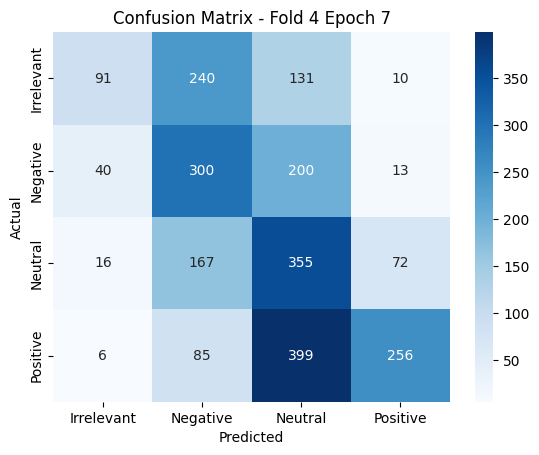

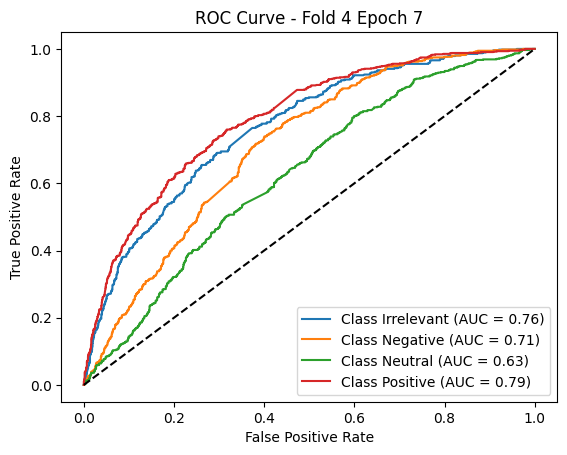


--- Epoch 8 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



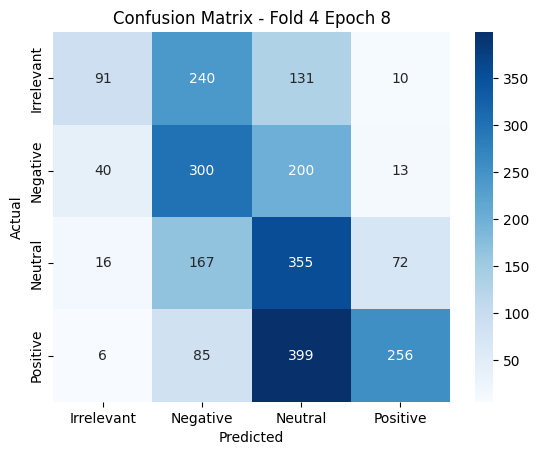

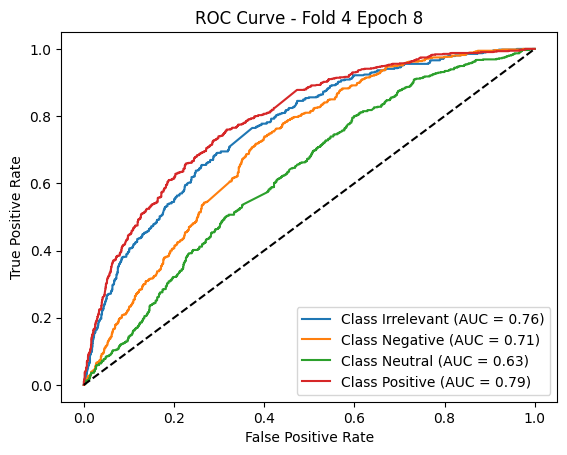


--- Epoch 9 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



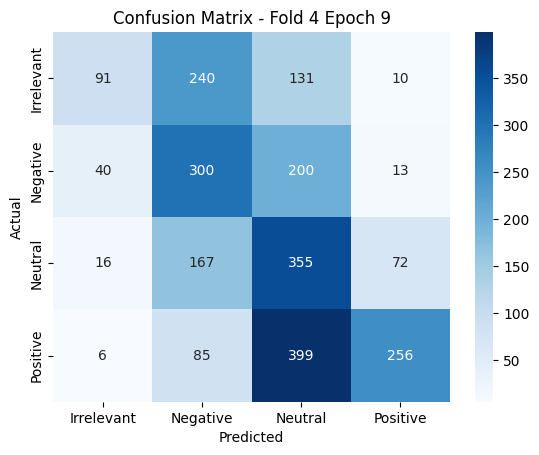

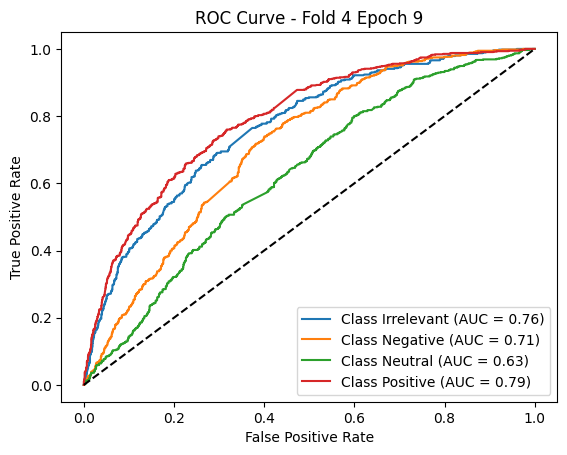


--- Epoch 10 ---
              precision    recall  f1-score   support

  Irrelevant       0.59      0.19      0.29       472
    Negative       0.38      0.54      0.45       553
     Neutral       0.33      0.58      0.42       610
    Positive       0.73      0.34      0.47       746

    accuracy                           0.42      2381
   macro avg       0.51      0.42      0.41      2381
weighted avg       0.52      0.42      0.41      2381



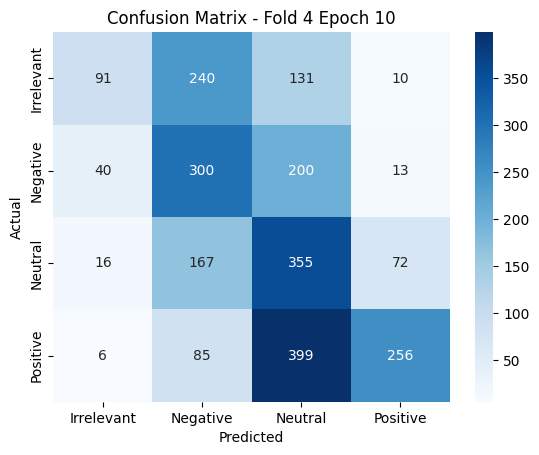

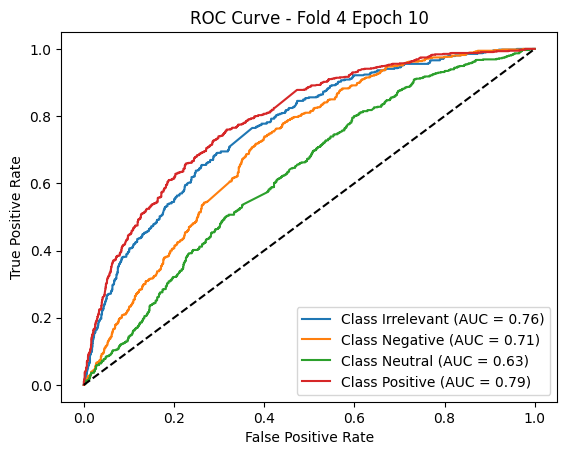


===== Fold 5 =====

--- Epoch 1 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



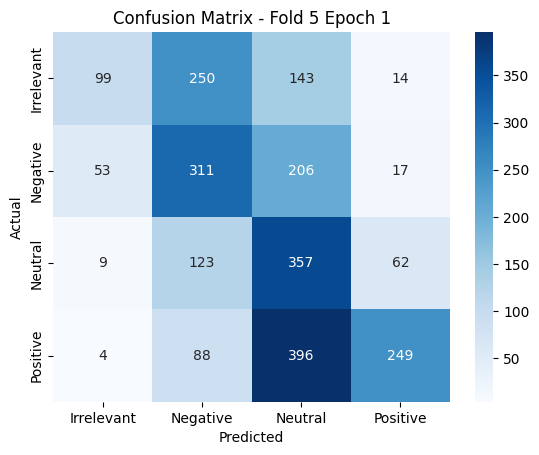

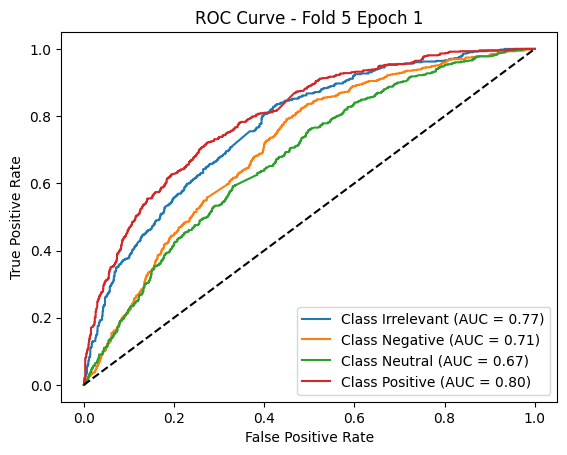


--- Epoch 2 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



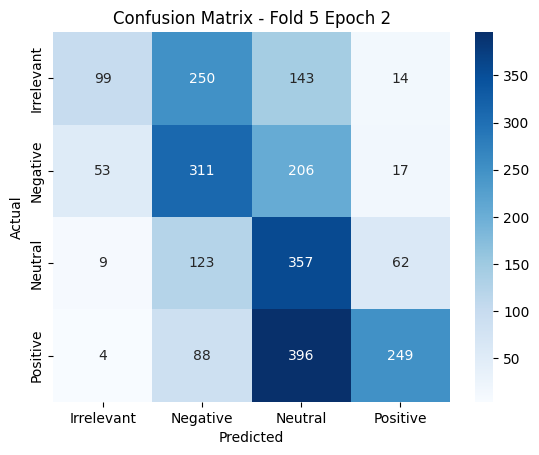

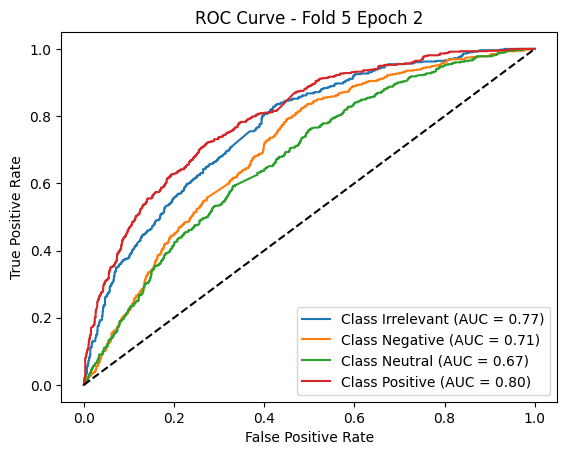


--- Epoch 3 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



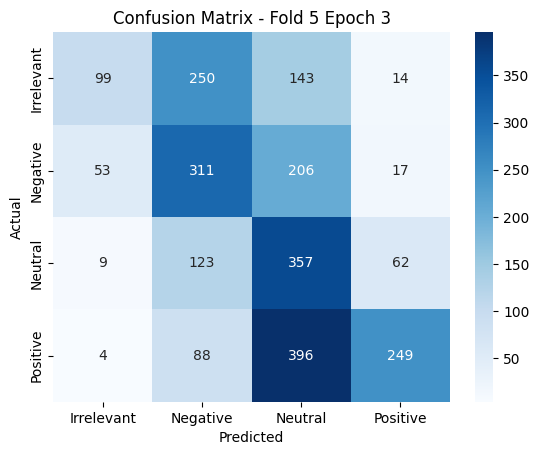

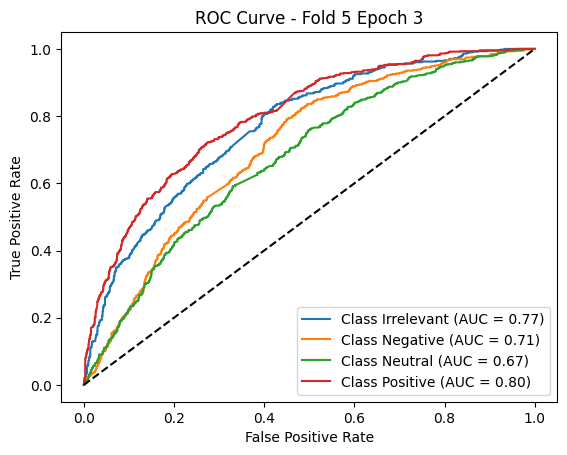


--- Epoch 4 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



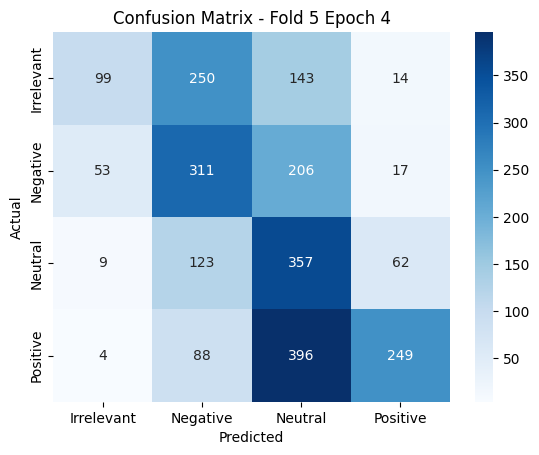

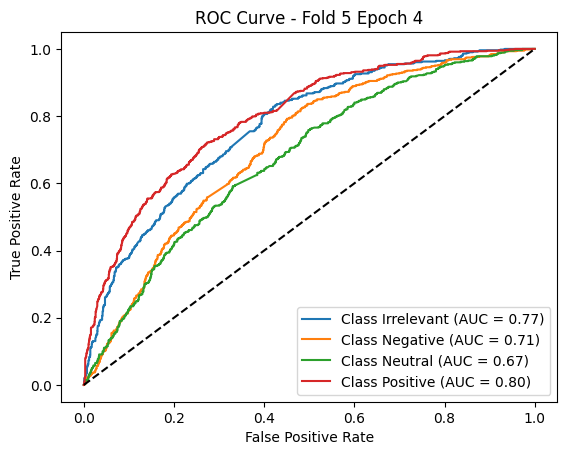


--- Epoch 5 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



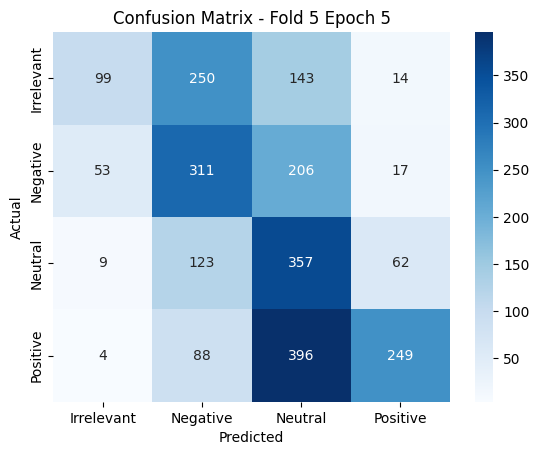

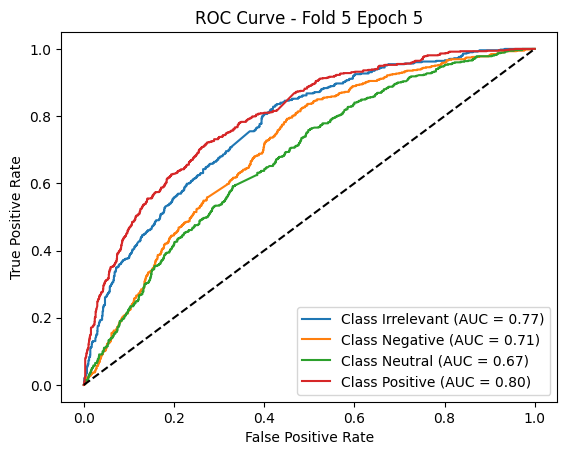


--- Epoch 6 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



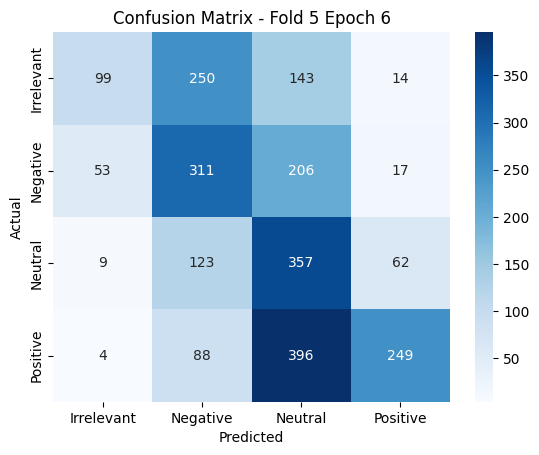

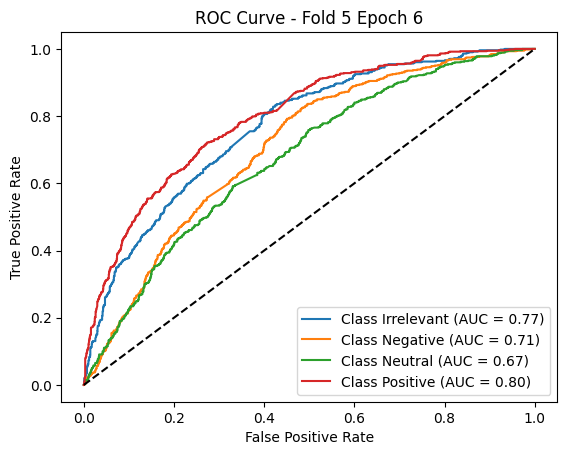


--- Epoch 7 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



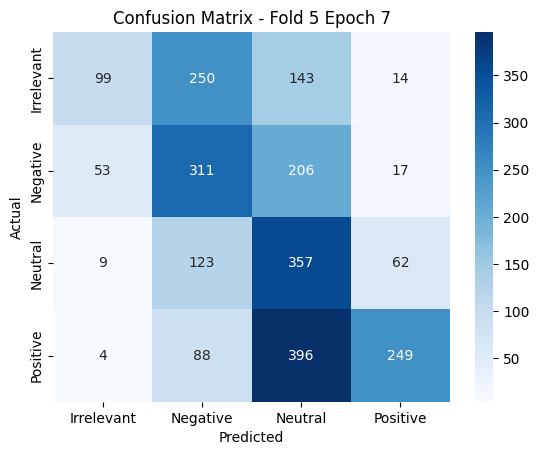

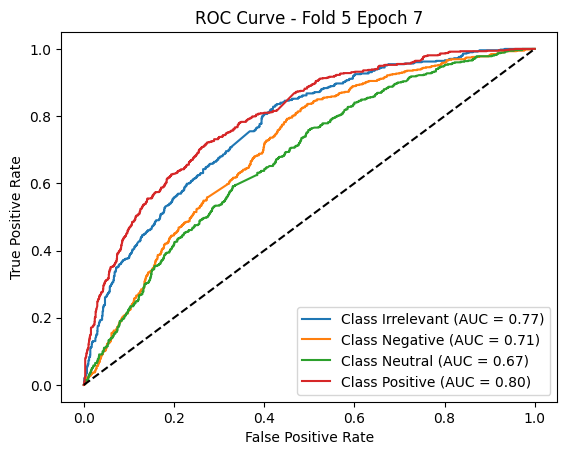


--- Epoch 8 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



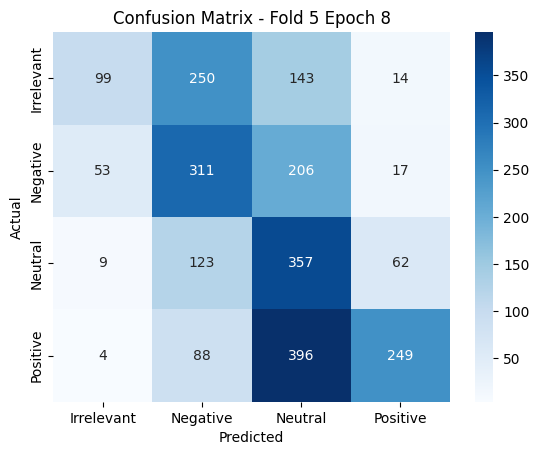

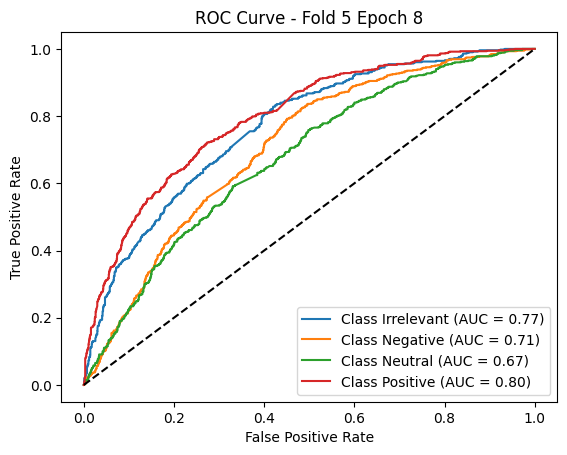


--- Epoch 9 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



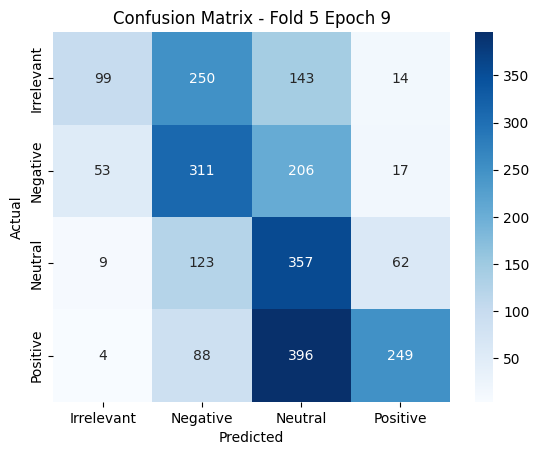

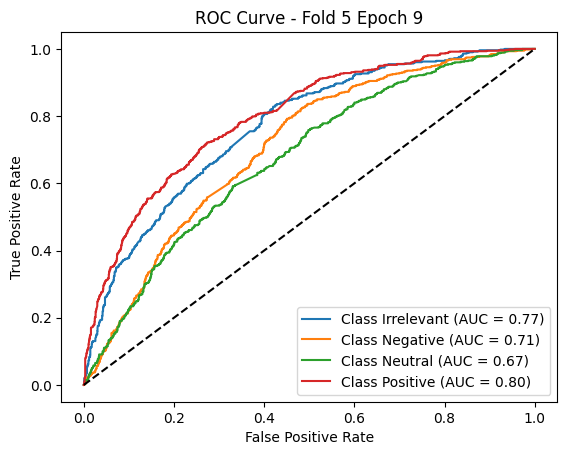


--- Epoch 10 ---
              precision    recall  f1-score   support

  Irrelevant       0.60      0.20      0.30       506
    Negative       0.40      0.53      0.46       587
     Neutral       0.32      0.65      0.43       551
    Positive       0.73      0.34      0.46       737

    accuracy                           0.43      2381
   macro avg       0.51      0.43      0.41      2381
weighted avg       0.53      0.43      0.42      2381



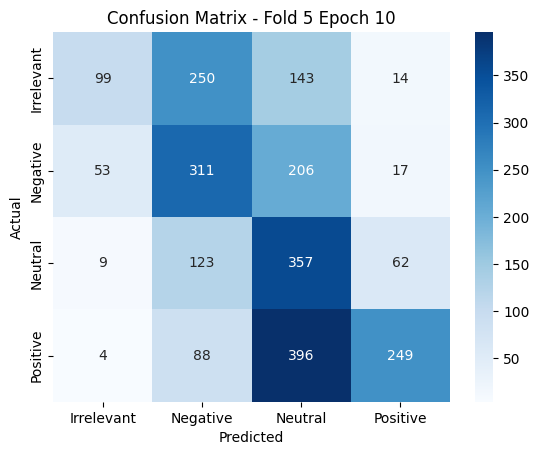

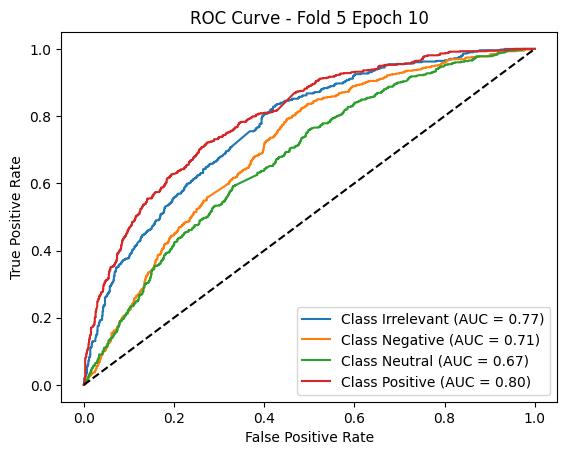

In [84]:
# Logistic Regression
# With cross validation

from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['sentiment'])
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(df['tweet_text']).toarray()

# 5-Fold Cross Validation with 10 Epochs per fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, test_idx) in enumerate(kf.split(X, y), 1):
    print(f"\n===== Fold {fold} =====")
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    for epoch in range(1, 11):
        model = LinearRegression()
        model.fit(X_train, y_train)
        y_pred = np.round(model.predict(X_test)).astype(int)
        y_pred = np.clip(y_pred, 0, len(label_encoder.classes_) - 1)

        print(f"\n--- Epoch {epoch} ---")
        print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
        plt.title(f"Confusion Matrix - Fold {fold} Epoch {epoch}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

        y_test_bin = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
        y_score = model.predict(X_test)
        for i in range(len(label_encoder.classes_)):
            if np.sum(y_test_bin[:, i]) > 0:
                fpr, tpr, _ = roc_curve(y_test_bin[:, i], -np.abs(y_score - i))
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - Fold {fold} Epoch {epoch}')
        plt.legend()
        plt.show()


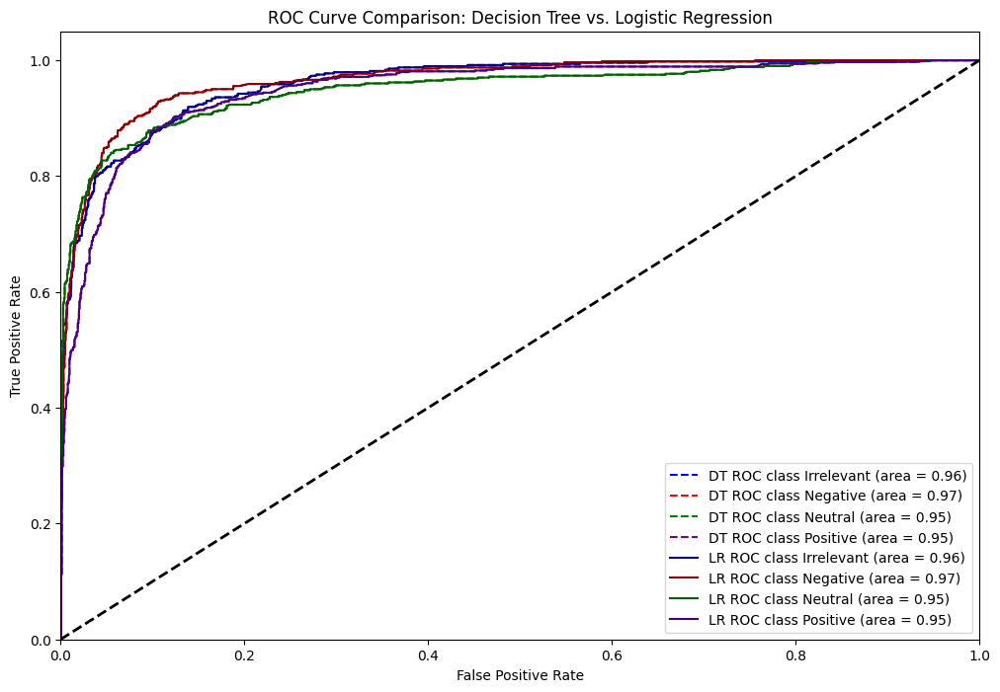

In [26]:
# Visualization of Comparison (Logistic Regression)

# Create a figure for comparison
plt.figure(figsize=(12, 8))

# Plot ROC curves for each class from Decision Tree
colors = ['blue', 'red', 'green', 'purple'] # Ensure enough colors for all classes
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=1.5, linestyle='--',
             label='DT ROC class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc[i]))

# Plot ROC curves for each class from Logistic Regression
colors = ['darkblue', 'darkred', 'darkgreen', 'indigo'] # Using valid color names
for i, color in zip(range(n_classes_lr), colors):
    plt.plot(fpr_lr[i], tpl_lr[i], color=color, lw=1.5, linestyle='-',
             label='LR ROC class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_lr[i]))


plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison: Decision Tree vs. Logistic Regression')
plt.legend(loc="lower right")
plt.show()

Classification Report (Random Forests):
              precision    recall  f1-score   support

  Irrelevant       0.89      0.91      0.90       485
    Negative       0.94      0.90      0.92       562
     Neutral       0.97      0.92      0.94       601
    Positive       0.89      0.95      0.92       733

    accuracy                           0.92      2381
   macro avg       0.92      0.92      0.92      2381
weighted avg       0.92      0.92      0.92      2381


Confusion Matrix (Random Forests):


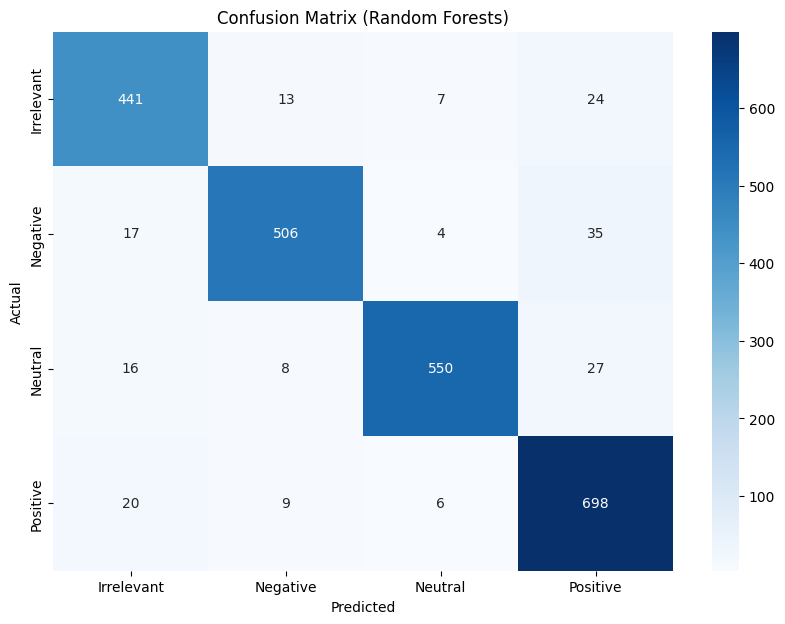

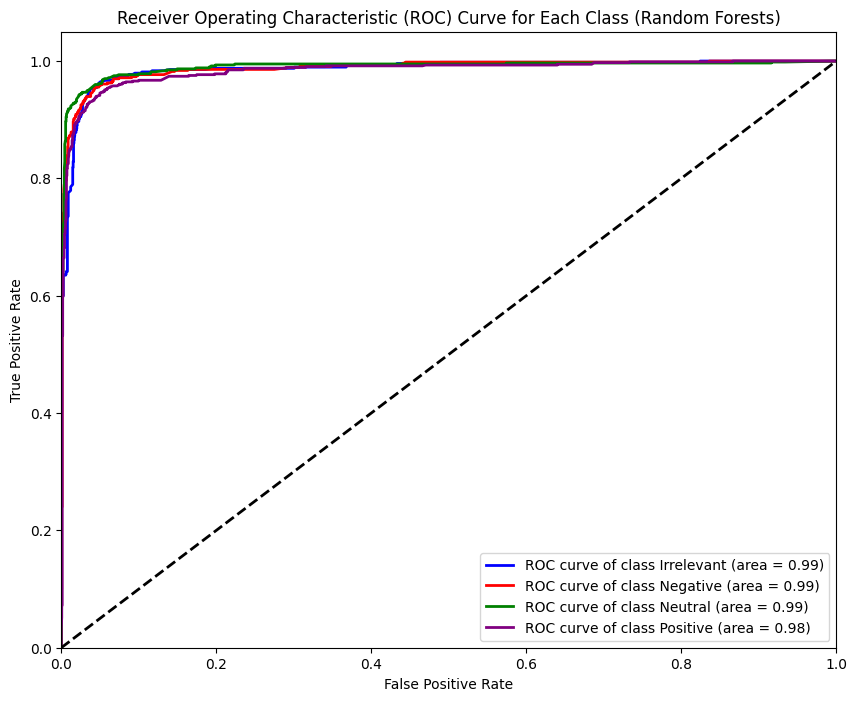

In [27]:
# Random Forests
# Without cross validation

from sklearn.ensemble import RandomForestClassifier

# Initialize a Random Forest Classifier model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data
rf_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred_rf = rf_clf.predict(X_test)

# Classification Report
print("Classification Report (Random Forests):")
print(classification_report(y_test, y_pred_rf, target_names=label_encoder.classes_))

# Confusion Matrix
print("\nConfusion Matrix (Random Forests):")
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_rf,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Random Forests)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the true labels
y_test_binarized_rf = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_rf = y_test_binarized_rf.shape[1]

# Get predicted probabilities from the Random Forest model
y_score_rf = rf_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf = dict()
tpr_rf = dict()
roc_auc_rf = dict()
for i in range(n_classes_rf):
    # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
    fpr_rf[i], tpr_rf[i], _ = roc_curve(y_test_binarized_rf[:, i], y_score_rf[:, i])
    roc_auc_rf[i] = auc(fpr_rf[i], tpr_rf[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes_rf), colors):
    # Ensure the class exists
    if i < len(label_encoder.classes_):
        plt.plot(fpr_rf[i], tpr_rf[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_rf[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Random Forests)')
plt.legend(loc="lower right")
plt.show()



Random Forest Results:
Accuracy: 0.9218815623687526
              precision    recall  f1-score   support

  Irrelevant       0.89      0.91      0.90       485
    Negative       0.94      0.90      0.92       562
     Neutral       0.97      0.92      0.94       601
    Positive       0.89      0.95      0.92       733

    accuracy                           0.92      2381
   macro avg       0.92      0.92      0.92      2381
weighted avg       0.92      0.92      0.92      2381


Performing 5-Fold Cross-Validation with Random Forest:
Fold 1/5
  Training complete.
  Accuracy for Fold 1: 0.9214615707685846
Fold 2/5
  Training complete.
  Accuracy for Fold 2: 0.9302813943721125
Fold 3/5
  Training complete.
  Accuracy for Fold 3: 0.9273414531709366
Fold 4/5
  Training complete.
  Accuracy for Fold 4: 0.9294414111717766
Fold 5/5
  Training complete.
  Accuracy for Fold 5: 0.9265014699706006

Cross-validation accuracies per fold (Random Forest): [0.9214615707685846, 0.9302813943721125, 

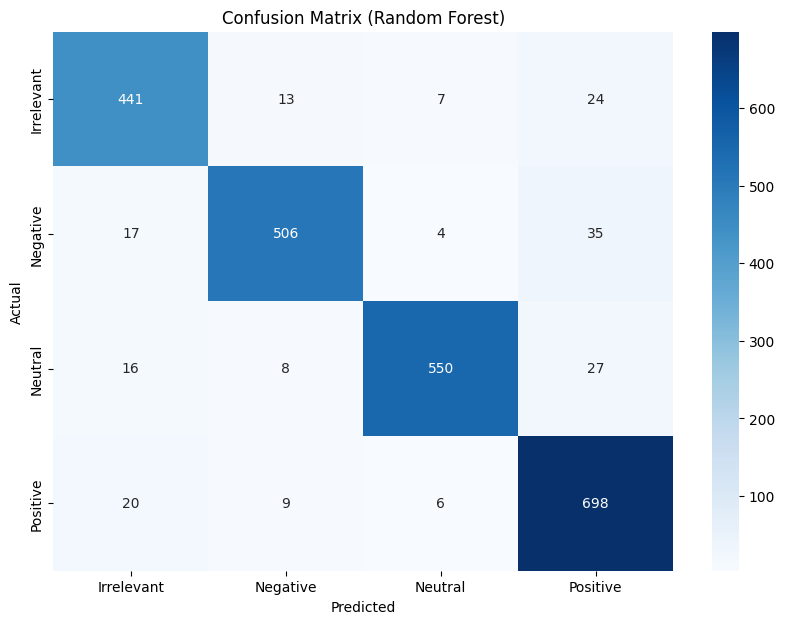

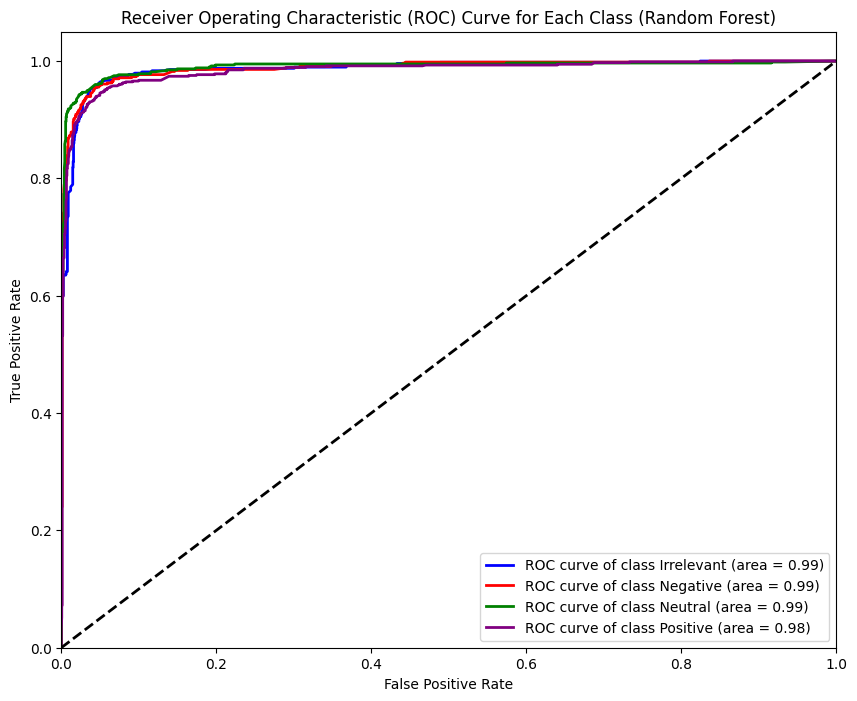

In [28]:
# Random Forests
# With cross validation

from sklearn.ensemble import RandomForestClassifier

# Step 5: Train Random Forest and evaluate
# Initialize a Random Forest model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42) # n_estimators is the number of trees

# Fit the model
rf_clf.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_clf.predict(X_test)

# Evaluate using classification metrics
print("\nRandom Forest Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf, target_names=label_encoder.classes_))

# Step 6: Cross-validation with Random Forest

# Define the number of folds
n_splits_rf = 5 # Using 5-Fold

# Initialize KFold cross-validation
kf_rf = KFold(n_splits=n_splits_rf, shuffle=True, random_state=42)

fold_accuracies_rf = []

# Iterate through each fold
print(f"\nPerforming {n_splits_rf}-Fold Cross-Validation with Random Forest:")
for fold, (train_index, test_index) in enumerate(kf_rf.split(X, y)):
    print(f"Fold {fold+1}/{n_splits_rf}")

    # Split data for the current fold
    X_train_fold_rf, X_test_fold_rf = X[train_index], X[test_index]
    y_train_fold_rf, y_test_fold_rf = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new Random Forest model for each fold
    rf_fold = RandomForestClassifier(n_estimators=100, random_state=42)

    # Fit the model
    rf_fold.fit(X_train_fold_rf, y_train_fold_rf)
    print("  Training complete.")

    # Evaluate the model on the test data for the current fold
    y_pred_fold_rf = rf_fold.predict(X_test_fold_rf)
    fold_accuracy_rf = accuracy_score(y_test_fold_rf, y_pred_fold_rf)
    print(f"  Accuracy for Fold {fold+1}: {fold_accuracy_rf}")
    fold_accuracies_rf.append(fold_accuracy_rf)

# Print the results of cross-validation
print("\nCross-validation accuracies per fold (Random Forest):", fold_accuracies_rf)
print("Mean cross-validation accuracy (Random Forest):", np.mean(fold_accuracies_rf))
print("Standard deviation of cross-validation accuracies (Random Forest):", np.std(fold_accuracies_rf))


# Confusion matrix for Random Forest
print("\nConfusion Matrix (Random Forest):")
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_rf,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Random Forest)")
plt.show()

# Compute ROC curve and ROC area for each class (Random Forest)

# Binarize the output
y_test_binarized_rf = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_rf = y_test_binarized_rf.shape[1]

# Get predicted probabilities from Random Forest
# predict_proba returns probabilities for each class
y_score_rf = rf_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf = dict()
tpl_rf = dict()
roc_auc_rf = dict()
for i in range(n_classes_rf):
  # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
  fpr_rf[i], tpl_rf[i], _ = roc_curve(y_test_binarized_rf[:, i], y_score_rf[:, i])
  roc_auc_rf[i] = auc(fpr_rf[i], tpl_rf[i])


# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = [
    "blue",
    "red",
    "green",
    "purple",
]  # Adjust colors based on number of classes
for i, color in zip(range(n_classes_rf), colors):
  # Ensure the class exists
  if i < len(label_encoder.classes_):
    plt.plot(
        fpr_rf[i],
        tpl_rf[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(
            label_encoder.classes_[i], roc_auc_rf[i]
        ),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve for Each Class (Random Forest)")
plt.legend(loc="lower right")
plt.show()

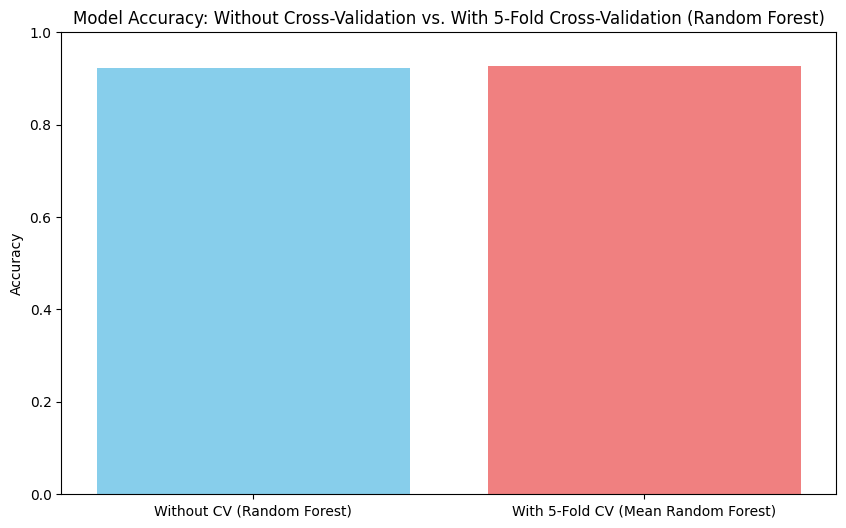

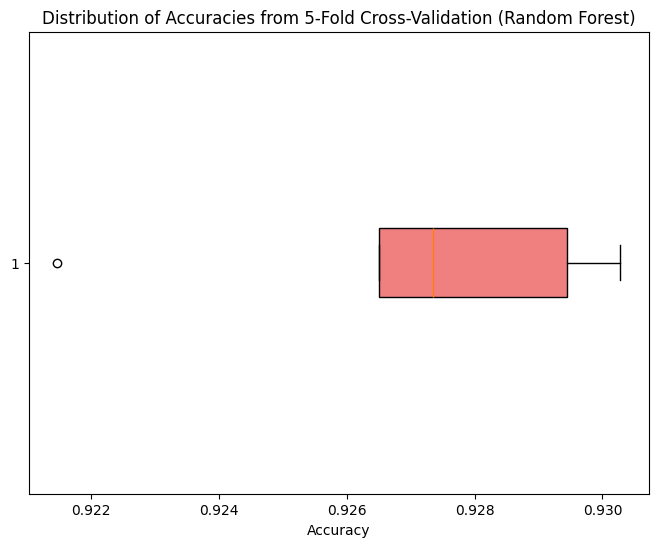

In [29]:
# Visualization of Comparison (Random Forests)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize

# Visualize the comparison of Random Forest results
labels_rf = ['Without CV (Random Forest)', 'With 5-Fold CV (Mean Random Forest)']

# You need to re-run the Random Forest without CV part to get y_pred_rf and the accuracy
# or ensure the previous code block was run to have these variables available.
# Let's re-calculate the accuracy without CV to be safe.
rf_clf_nocv = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_nocv.fit(X_train, y_train)
y_pred_rf_nocv = rf_clf_nocv.predict(X_test)
accuracy_rf_nocv = accuracy_score(y_test, y_pred_rf_nocv)

# The mean cross-validation accuracy for Random Forest was stored in 'np.mean(fold_accuracies_rf)'
accuracies_rf = [accuracy_rf_nocv, np.mean(fold_accuracies_rf)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_rf, accuracies_rf, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (Random Forest)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for Random Forest
plt.figure(figsize=(8, 6))
plt.boxplot(fold_accuracies_rf, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (Random Forest)')
plt.show()


Classification Report (SVM - Without CV):
              precision    recall  f1-score   support

  Irrelevant       0.84      0.87      0.86       485
    Negative       0.91      0.88      0.90       562
     Neutral       0.96      0.86      0.91       601
    Positive       0.86      0.93      0.89       733

    accuracy                           0.89      2381
   macro avg       0.89      0.89      0.89      2381
weighted avg       0.89      0.89      0.89      2381


Confusion Matrix (SVM - Without CV):


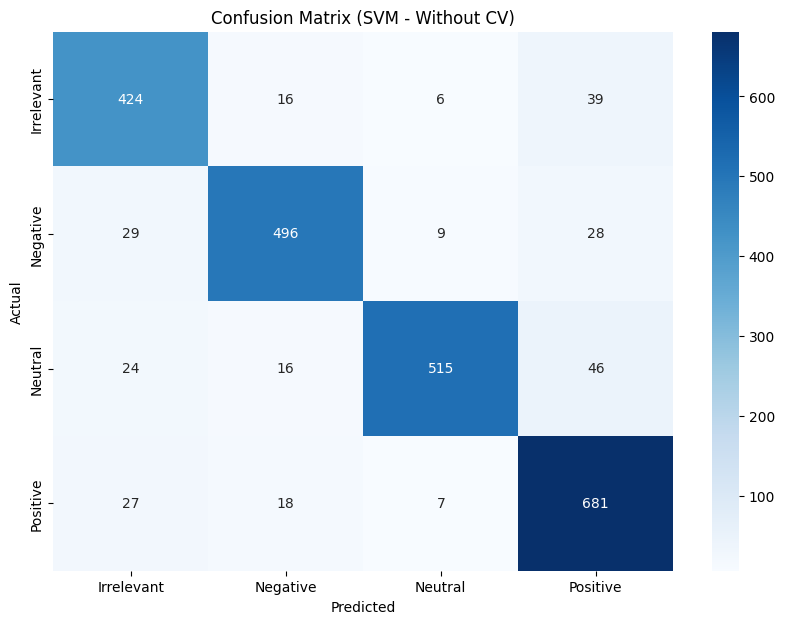

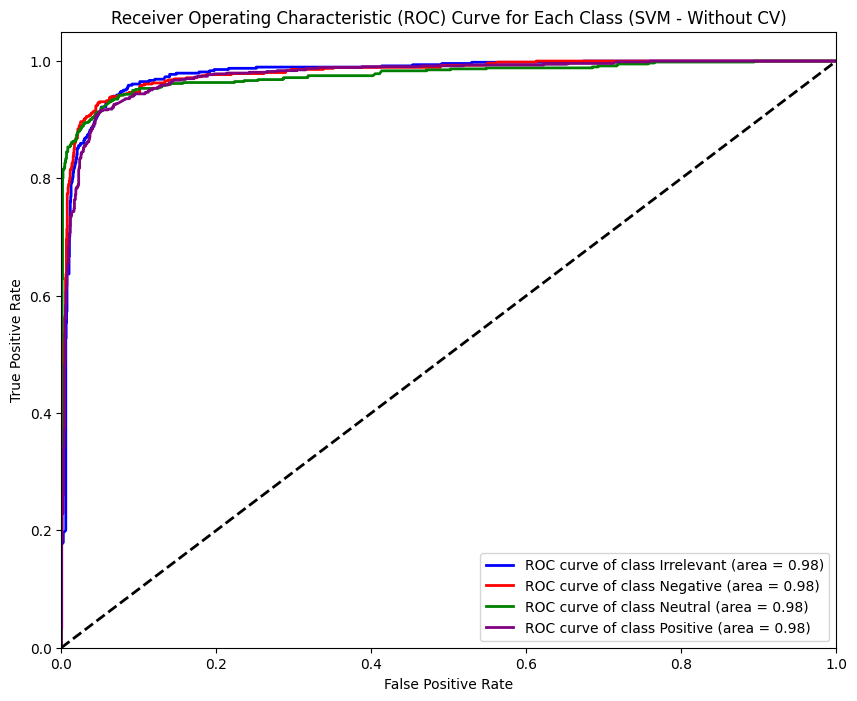

In [30]:
# SVM
# # Without cross validation

from sklearn.svm import SVC

# Initialize a Support Vector Classifier model
svm_clf = SVC(kernel='linear', probability=True, random_state=42) # Use probability=True for ROC/AUC

# Train the model on the training data
svm_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred_svm = svm_clf.predict(X_test)

# Classification Report
print("Classification Report (SVM - Without CV):")
print(classification_report(y_test, y_pred_svm, target_names=label_encoder.classes_))

# Confusion Matrix
print("\nConfusion Matrix (SVM - Without CV):")
cm_svm = confusion_matrix(y_test, y_pred_svm)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_svm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (SVM - Without CV)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the true labels
y_test_binarized_svm = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_svm = y_test_binarized_svm.shape[1]

# Get predicted probabilities from the SVM model
# This requires probability=True when initializing SVC, which can make training slower.
y_score_svm = svm_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_svm = dict()
tpr_svm = dict()
roc_auc_svm = dict()
for i in range(n_classes_svm):
    # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
    fpr_svm[i], tpr_svm[i], _ = roc_curve(y_test_binarized_svm[:, i], y_score_svm[:, i])
    roc_auc_svm[i] = auc(fpr_svm[i], tpr_svm[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes_svm), colors):
    # Ensure the class exists
    if i < len(label_encoder.classes_):
        plt.plot(fpr_svm[i], tpr_svm[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_svm[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (SVM - Without CV)')
plt.legend(loc="lower right")
plt.show()


Performing 5-Fold Cross-Validation with SVM:
Fold 1/5
  Training complete.
  Accuracy for Fold 1: 0.8887022259554809
Fold 2/5
  Training complete.
  Accuracy for Fold 2: 0.8916421671566569
Fold 3/5
  Training complete.
  Accuracy for Fold 3: 0.8983620327593448
Fold 4/5
  Training complete.
  Accuracy for Fold 4: 0.8924821503569929
Fold 5/5
  Training complete.
  Accuracy for Fold 5: 0.8983620327593448

Cross-validation accuracies per fold (SVM): [0.8887022259554809, 0.8916421671566569, 0.8983620327593448, 0.8924821503569929, 0.8983620327593448]
Mean cross-validation accuracy (SVM): 0.893910121797564
Standard deviation of cross-validation accuracies (SVM): 0.0038456188634219454

Mean Confusion Matrix across folds (SVM):
[[410  13  10  50]
 [ 16 509   6  25]
 [ 21  15 507  37]
 [ 23  23   8 702]]

Mean Cross-validation AUC per class (SVM):
  Class Irrelevant (Area = 0.97)
  Class Negative (Area = 0.98)
  Class Neutral (Area = 0.98)
  Class Positive (Area = 0.97)


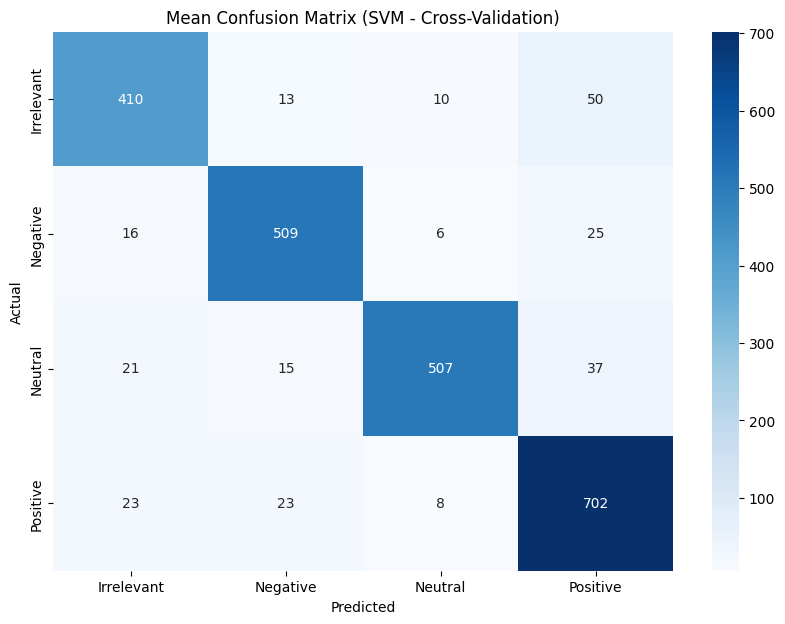

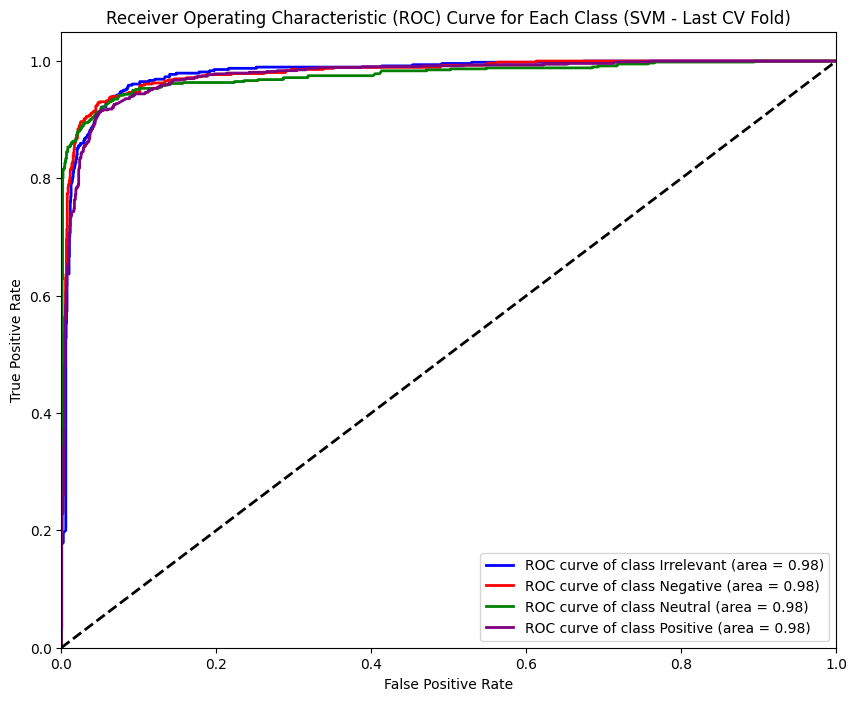

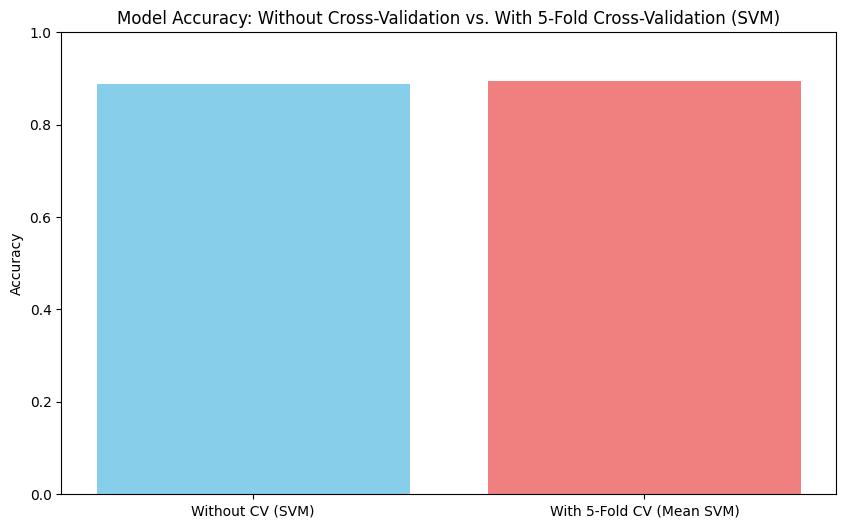

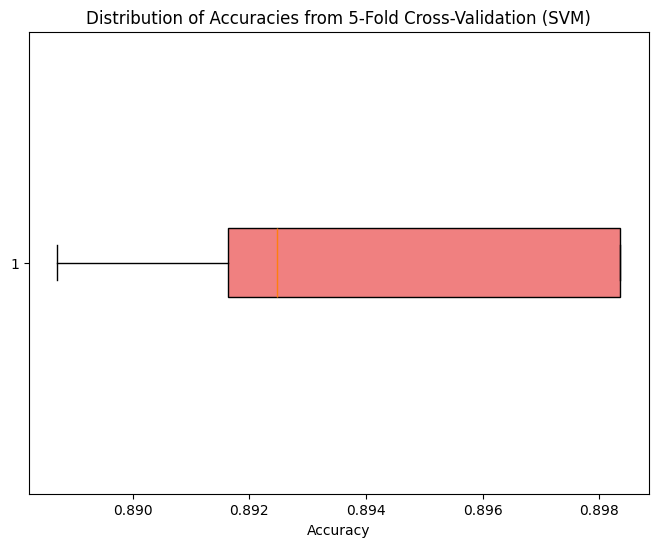

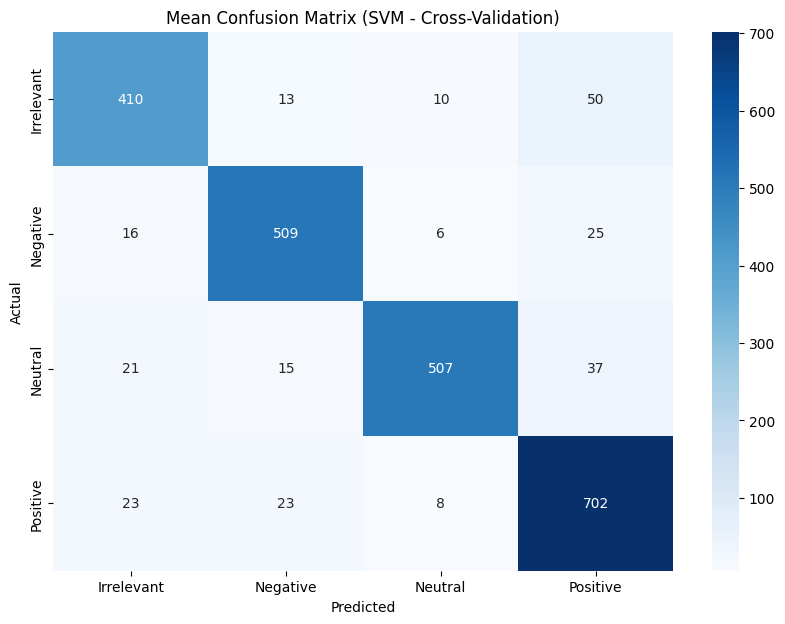

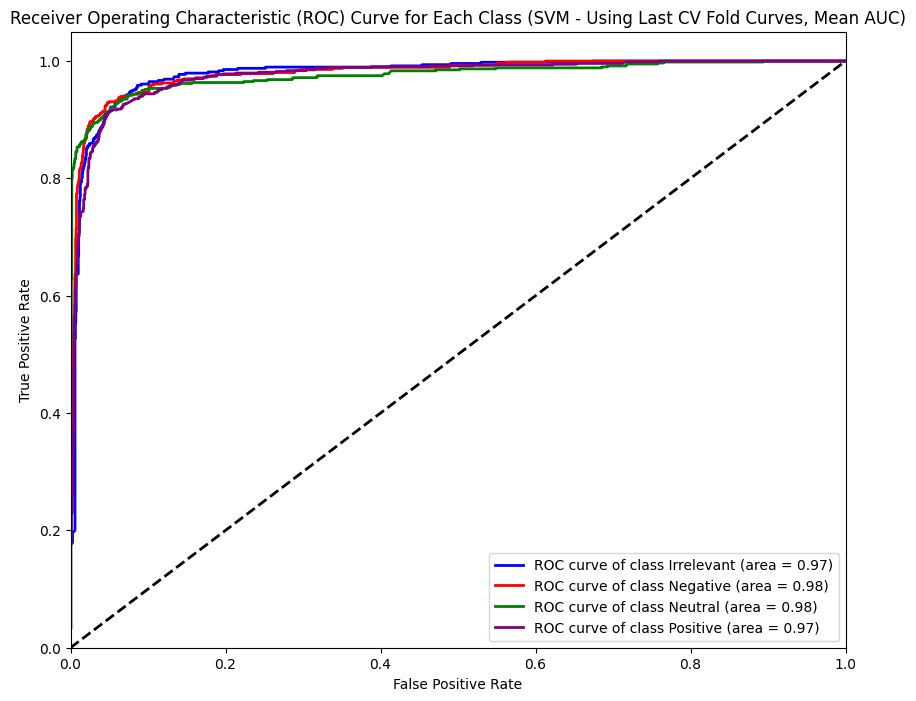

In [31]:
# SVM
# With cross validation

from sklearn.svm import SVC

# Step 5: Train SVM and evaluate (With cross-validation)
# Initialize a Support Vector Classifier model
# Use probability=True for ROC/AUC, though it adds computational cost.
# For large datasets, consider kernel='linear' or using LinearSVC which is faster for linear kernel.
# Let's use SVC with a linear kernel and probability=True as done previously.
svm_clf_cv = SVC(kernel='linear', probability=True, random_state=42)

# Step 6: Cross-validation with SVM

# Define the number of folds
n_splits_svm = 5  # Using 5-Fold

# Initialize KFold cross-validation
kf_svm = KFold(n_splits=n_splits_svm, shuffle=True, random_state=42)

fold_accuracies_svm = []
fold_cms_svm = []
fold_roc_aucs_svm = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class

print(f"\nPerforming {n_splits_svm}-Fold Cross-Validation with SVM:")

# Iterate through each fold
for fold, (train_index, test_index) in enumerate(kf_svm.split(X, y)):
    print(f"Fold {fold+1}/{n_splits_svm}")

    # Split data for the current fold
    X_train_fold_svm, X_test_fold_svm = X[train_index], X[test_index]
    y_train_fold_svm, y_test_fold_svm = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new SVM model for each fold
    svm_fold = SVC(kernel='linear', probability=True, random_state=42)

    # Fit the model
    print("  Training complete.")
    svm_fold.fit(X_train_fold_svm, y_train_fold_svm)


    # Evaluate the model on the test data for the current fold
    y_pred_fold_svm = svm_fold.predict(X_test_fold_svm)
    fold_accuracy_svm = accuracy_score(y_test_fold_svm, y_pred_fold_svm)
    print(f"  Accuracy for Fold {fold+1}: {fold_accuracy_svm}")
    fold_accuracies_svm.append(fold_accuracy_svm)

    # Compute Confusion Matrix for the fold
    cm_fold_svm = confusion_matrix(y_test_fold_svm, y_pred_fold_svm)
    fold_cms_svm.append(cm_fold_svm)

    # Compute ROC and AUC for the fold
    # Binarize the true labels for the current fold
    y_test_binarized_fold_svm = label_binarize(y_test_fold_svm, classes=np.arange(len(label_encoder.classes_)))

    # Get predicted probabilities for the current fold
    y_score_fold_svm = svm_fold.predict_proba(X_test_fold_svm)

    # Compute ROC curve and AUC for each class in the current fold
    for i in range(len(label_encoder.classes_)):
        if i < y_test_binarized_fold_svm.shape[1] and i < y_score_fold_svm.shape[1]:
             try:
                 # Check if the class exists in the true labels for this fold
                 if np.sum(y_test_binarized_fold_svm[:, i]) > 0:
                     fpr_fold, tpr_fold, _ = roc_curve(y_test_binarized_fold_svm[:, i], y_score_fold_svm[:, i])
                     auc_fold = auc(fpr_fold, tpr_fold)
                     fold_roc_aucs_svm[i].append(auc_fold)
                 else:
                     # Handle cases where a class is not present in the test set of a fold
                     # print(f"  Warning: Class {label_encoder.classes_[i]} not present in fold {fold+1} test set for ROC/AUC.")
                     pass # Do not append AUC if class is missing
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {label_encoder.classes_[i]} in fold {fold+1}: {e}")
                  pass # Skip if computation fails


# Print the results of cross-validation
print("\nCross-validation accuracies per fold (SVM):", fold_accuracies_svm)
print("Mean cross-validation accuracy (SVM):", np.mean(fold_accuracies_svm))
print("Standard deviation of cross-validation accuracies (SVM):", np.std(fold_accuracies_svm))


# Average the confusion matrices (optional, but can give a sense of average performance)
mean_cm_svm = np.mean(fold_cms_svm, axis=0).astype(int)
print("\nMean Confusion Matrix across folds (SVM):")
print(mean_cm_svm)

# Print mean AUC for each class
print("\nMean Cross-validation AUC per class (SVM):")
for i in range(len(label_encoder.classes_)):
    if fold_roc_aucs_svm[i]: # Only print if AUCs were collected for this class
        print(f"  Class {label_encoder.classes_[i]} (Area = {np.mean(fold_roc_aucs_svm[i]):0.2f})")
    else:
        print(f"  Class {label_encoder.classes_[i]}: No AUC computed (class not present in all folds)")


# Confusion matrix visualization (using the mean matrix or the last fold's matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(
    mean_cm_svm, # Using the mean confusion matrix
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (SVM - Cross-Validation)")
plt.show()

# ROC curve visualization (Plotting average ROC or ROC from the last fold is possible)
# Plotting the average ROC requires interpolating curves, which is complex.
# Let's plot the ROC curves from the last fold as a representative example from CV.
# The fpr_svm, tpr_svm, roc_auc_svm from the last fold's calculation are available.

if 'fpr_fold' in locals() and 'tpr_fold' in locals(): # Check if last fold's ROC was computed
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    for i, color in zip(range(n_classes_svm), colors):
        # Check if ROC was computed for this class in the last fold
        if i < len(label_encoder.classes_) and i < len(fpr_svm) and fpr_svm[i] is not None: # Added checks
            plt.plot(fpr_svm[i], tpr_svm[i], color=color, lw=2,
                     label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_svm[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (SVM - Last CV Fold)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves could not be plotted for the last SVM CV fold (possibly due to missing classes).")

# Visualization of Comparison (SVM)

# Visualize the comparison of SVM results
labels_svm = ['Without CV (SVM)', 'With 5-Fold CV (Mean SVM)']

# You need to re-run the SVM without CV part to get y_pred_svm and the accuracy
# or ensure the previous code block was run to have these variables available.
# Let's re-calculate the accuracy without CV to be safe.
svm_clf_nocv_eval = SVC(kernel='linear', random_state=42)
svm_clf_nocv_eval.fit(X_train, y_train)
y_pred_svm_nocv = svm_clf_nocv_eval.predict(X_test)
accuracy_svm_nocv = accuracy_score(y_test, y_pred_svm_nocv)


# The mean cross-validation accuracy for SVM was stored in 'np.mean(fold_accuracies_svm)'
accuracies_svm = [accuracy_svm_nocv, np.mean(fold_accuracies_svm)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_svm, accuracies_svm, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (SVM)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for SVM
plt.figure(figsize=(8, 6))
plt.boxplot(fold_accuracies_svm, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (SVM)')
plt.show()

# Visualize the Confusion Matrix (derived from the mean CV confusion matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm_svm, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (SVM - Cross-Validation)")
plt.show()

# ROC Curve visualization (using mean AUCs, but still plotting from the last fold for curves)
if 'fpr_fold' in locals() and 'tpr_fold' in locals(): # Check if last fold's ROC was computed
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_svm = len(label_encoder.classes_)
    for i, color in zip(range(n_classes_svm), colors):
        # Check if ROC was computed for this class in the last fold
        if i < len(label_encoder.classes_) and i < len(fpr_svm) and fpr_svm[i] is not None:
            plt.plot(fpr_svm[i], tpr_svm[i], color=color, lw=2,
                     label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], np.mean(fold_roc_aucs_svm[i]) if fold_roc_aucs_svm[i] else 0)) # Use mean AUC

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (SVM - Using Last CV Fold Curves, Mean AUC)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves visualization skipped for SVM CV.")


Classification Report (KNN - Without CV):
              precision    recall  f1-score   support

  Irrelevant       0.80      0.95      0.87       485
    Negative       0.96      0.88      0.91       562
     Neutral       0.95      0.93      0.94       601
    Positive       0.95      0.91      0.93       733

    accuracy                           0.91      2381
   macro avg       0.91      0.92      0.91      2381
weighted avg       0.92      0.91      0.92      2381


Confusion Matrix (KNN - Without CV):


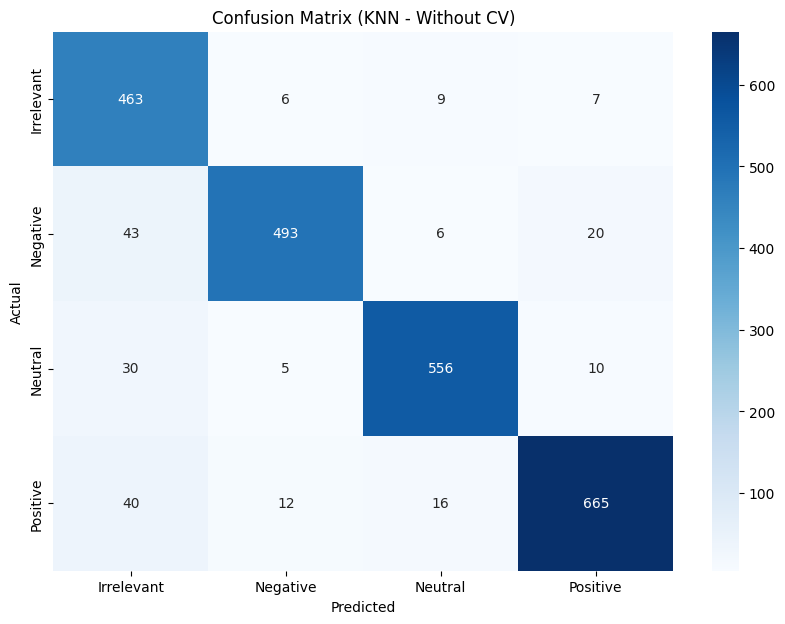

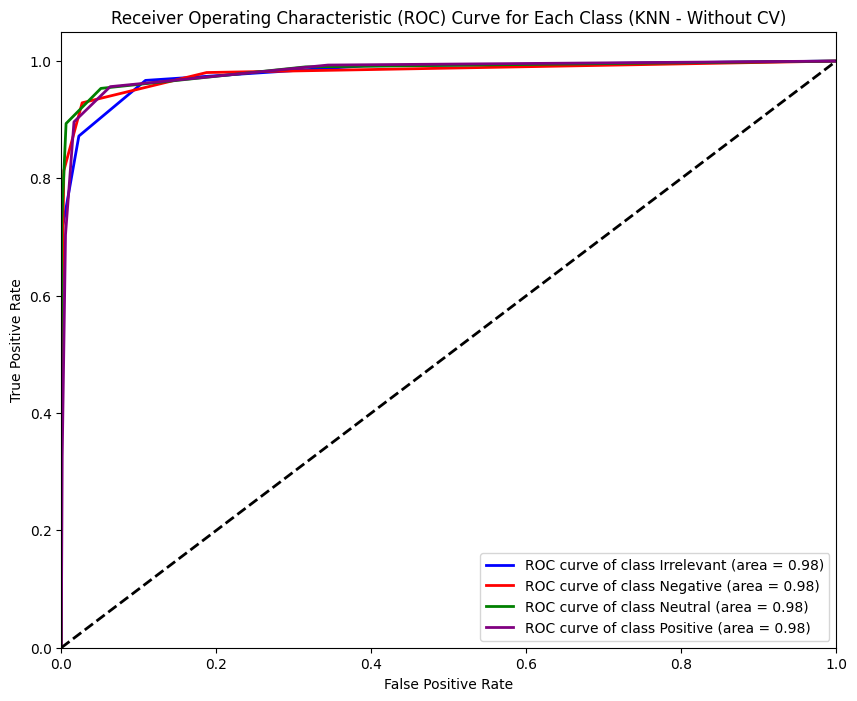

In [33]:
# KNN
# Without cross validation

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Step 5: Train KNN and evaluate (without cross-validation)
# Initialize a KNN classifier model
# You can choose the number of neighbors (n_neighbors) - let's start with 5
knn_clf = KNeighborsClassifier(n_neighbors=5)

# Train the model on the training data
knn_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred_knn = knn_clf.predict(X_test)

# Classification Report
print("Classification Report (KNN - Without CV):")
print(classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_))

# Confusion Matrix
print("\nConfusion Matrix (KNN - Without CV):")
cm_knn = confusion_matrix(y_test, y_pred_knn)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_knn,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (KNN - Without CV)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the true labels
y_test_binarized_knn = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_knn = y_test_binarized_knn.shape[1]

# Get predicted probabilities from the KNN model
# predict_proba is needed for ROC curve
y_score_knn = knn_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_knn = dict()
tpr_knn = dict()
roc_auc_knn = dict()
for i in range(n_classes_knn):
    # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
    fpr_knn[i], tpr_knn[i], _ = roc_curve(y_test_binarized_knn[:, i], y_score_knn[:, i])
    roc_auc_knn[i] = auc(fpr_knn[i], tpr_knn[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes_knn), colors):
    # Ensure the class exists
    if i < len(label_encoder.classes_):
        plt.plot(fpr_knn[i], tpr_knn[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_knn[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (KNN - Without CV)')
plt.legend(loc="lower right")
plt.show()


Performing 5-Fold Cross-Validation with KNN:
Fold 1/5
  Training complete.
  Accuracy for Fold 1: 0.9155816883662327
Fold 2/5
  Training complete.
  Accuracy for Fold 2: 0.9122217555648887
Fold 3/5
  Training complete.
  Accuracy for Fold 3: 0.9122217555648887
Fold 4/5
  Training complete.
  Accuracy for Fold 4: 0.9017219655606887
Fold 5/5
  Training complete.
  Accuracy for Fold 5: 0.9176816463670726

Cross-validation accuracies per fold (KNN): [0.9155816883662327, 0.9122217555648887, 0.9122217555648887, 0.9017219655606887, 0.9176816463670726]
Mean cross-validation accuracy (KNN): 0.9118857622847543
Standard deviation of cross-validation accuracies (KNN): 0.005491460438028115

Mean Confusion Matrix across folds (KNN):
[[441   6  19  17]
 [ 21 505  15  16]
 [ 16   7 545  11]
 [ 30  13  34 679]]

Mean Cross-validation AUC per class (KNN):
  Class Irrelevant (Area = 0.97)
  Class Negative (Area = 0.98)
  Class Neutral (Area = 0.98)
  Class Positive (Area = 0.98)


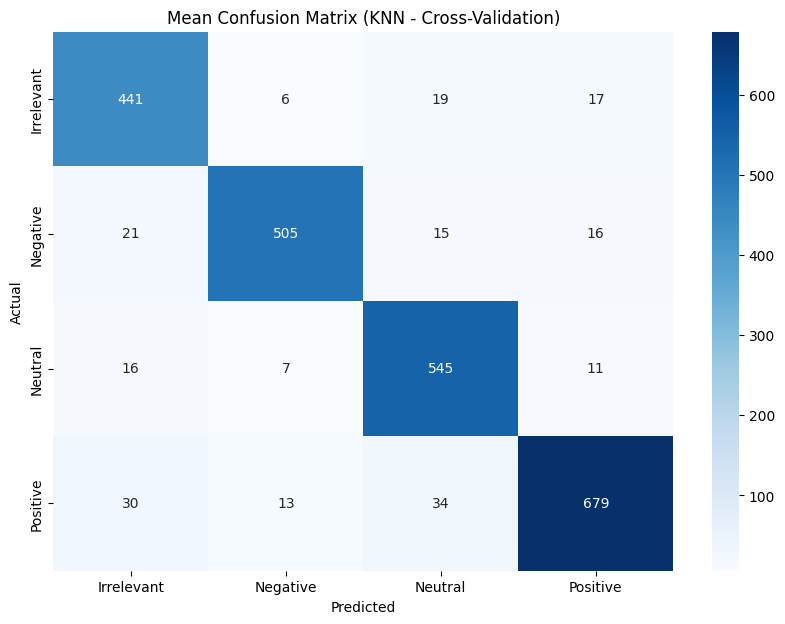

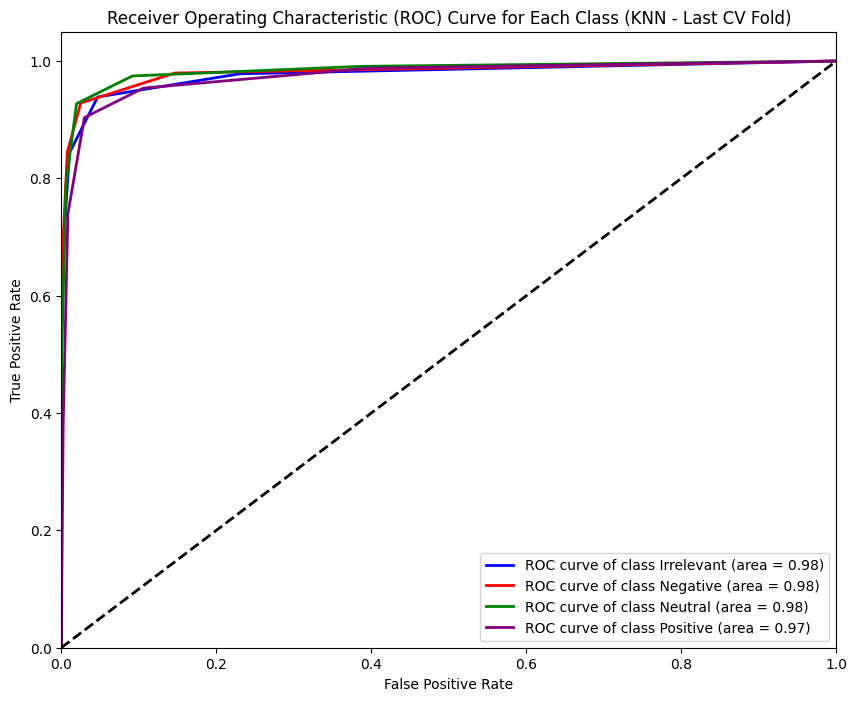

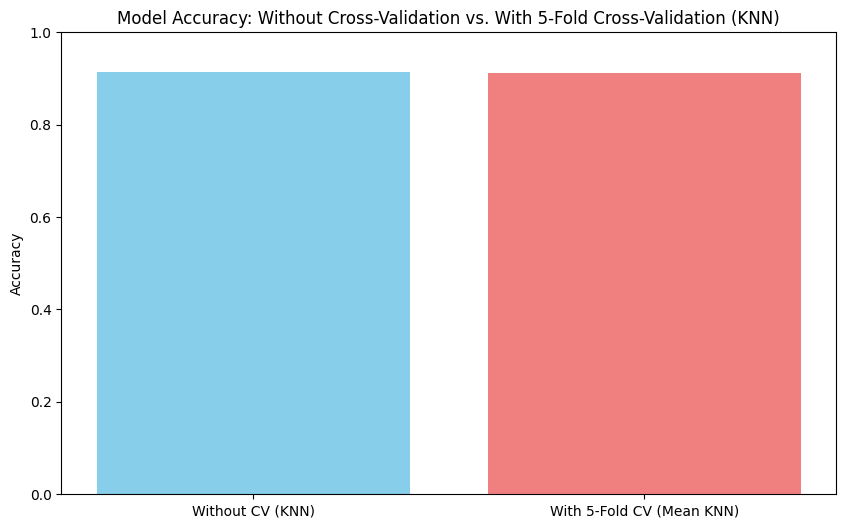

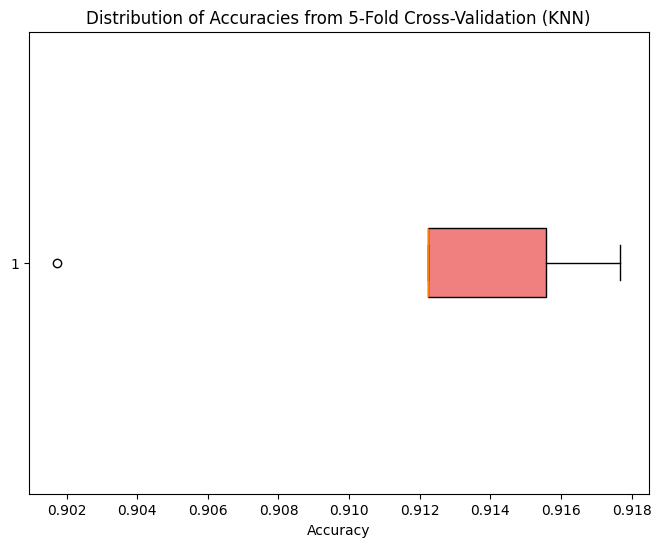

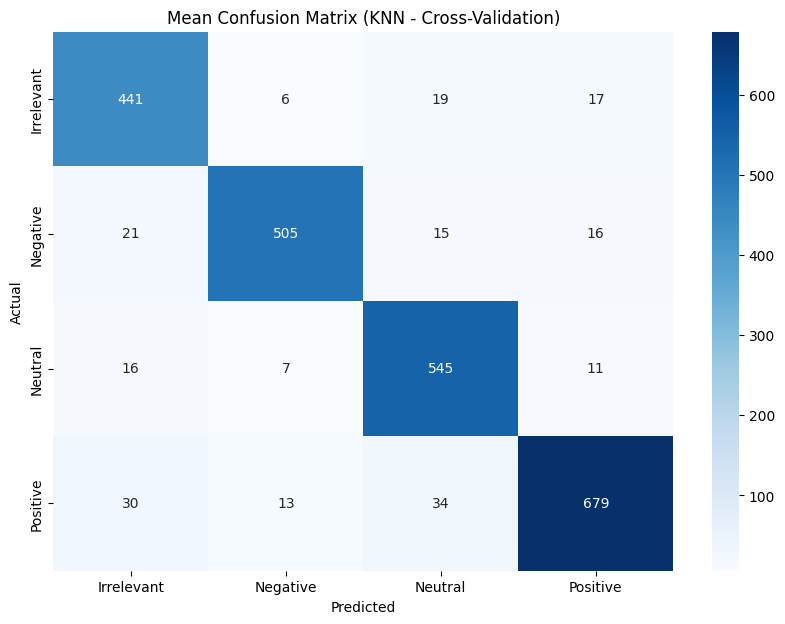

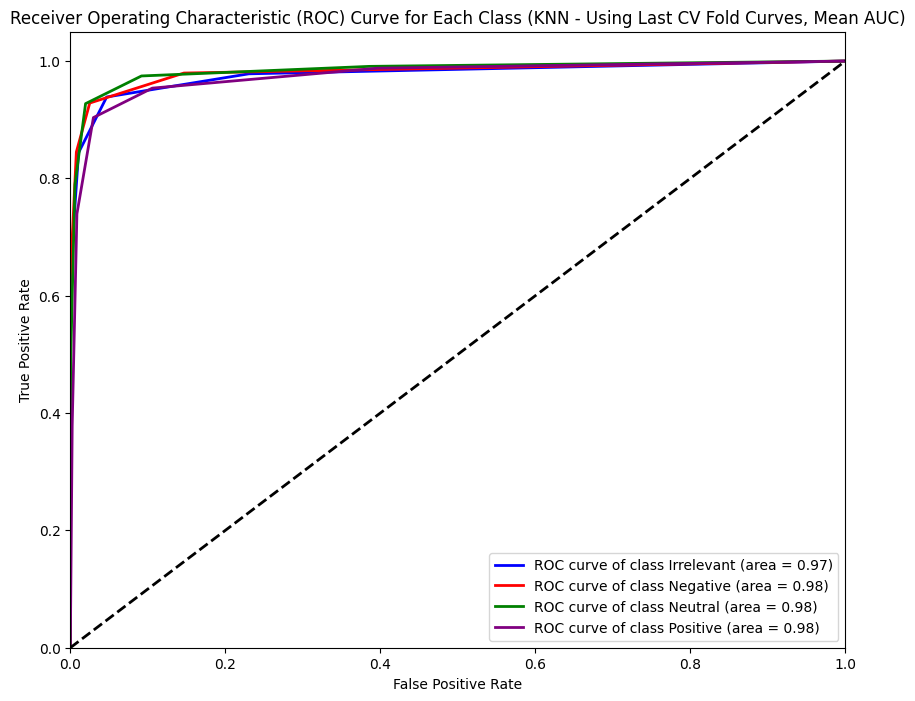

In [36]:
# KNN
# With cross validation

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.base import clone

# Step 5: Train KNN and evaluate (With cross-validation)
# Initialize a KNN classifier model
# We will use n_neighbors=5 as in the previous cell for consistency
knn_clf_cv = KNeighborsClassifier(n_neighbors=5)

# Step 6: Cross-validation with KNN

# Define the number of folds
n_splits_knn = 5  # Using 5-Fold

# Initialize KFold cross-validation
kf_knn = KFold(n_splits=n_splits_knn, shuffle=True, random_state=42)

fold_accuracies_knn = []
fold_cms_knn = []
fold_roc_aucs_knn = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class

print(f"\nPerforming {n_splits_knn}-Fold Cross-Validation with KNN:")

# Variables to store data for the last fold's ROC plot
last_fold_y_test_binarized = None
last_fold_y_score = None
last_fold_label_encoder_classes = None

# Iterate through each fold
for fold, (train_index, test_index) in enumerate(kf_knn.split(X, y)):
    print(f"Fold {fold+1}/{n_splits_knn}")

    # Split data for the current fold
    X_train_fold_knn, X_test_fold_knn = X[train_index], X[test_index]
    y_train_fold_knn, y_test_fold_knn = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new KNN model for each fold
    knn_fold = clone(knn_clf_cv) # Clone the model

    # Fit the model
    print("  Training complete.")
    knn_fold.fit(X_train_fold_knn, y_train_fold_knn)

    # Evaluate the model on the test data for the current fold
    y_pred_fold_knn = knn_fold.predict(X_test_fold_knn)
    fold_accuracy_knn = accuracy_score(y_test_fold_knn, y_pred_fold_knn)
    print(f"  Accuracy for Fold {fold+1}: {fold_accuracy_knn}")
    fold_accuracies_knn.append(fold_accuracy_knn)

    # Compute Confusion Matrix for the fold
    cm_fold_knn = confusion_matrix(y_test_fold_knn, y_pred_fold_knn)
    fold_cms_knn.append(cm_fold_knn)

    # Compute ROC and AUC for the fold
    # Binarize the true labels for the current fold
    y_test_binarized_fold_knn = label_binarize(y_test_fold_knn, classes=np.arange(len(label_encoder.classes_)))

    # Get predicted probabilities for the current fold
    y_score_fold_knn = knn_fold.predict_proba(X_test_fold_knn)

    # Compute ROC curve and AUC for each class in the current fold
    roc_auc_fold = {} # Define roc_auc_fold inside the loop
    for i in range(len(label_encoder.classes_)):
        if i < y_test_binarized_fold_knn.shape[1] and i < y_score_fold_knn.shape[1]:
             try:
                 # Check if the class exists in the true labels for this fold
                 if np.sum(y_test_binarized_fold_knn[:, i]) > 0:
                     fpr_fold, tpr_fold, _ = roc_curve(y_test_binarized_fold_knn[:, i], y_score_fold_knn[:, i])
                     auc_fold = auc(fpr_fold, tpr_fold)
                     fold_roc_aucs_knn[i].append(auc_fold)
                     roc_auc_fold[i] = auc_fold # Store AUC for the last fold
                 else:
                     pass # Do not append AUC if class is missing
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {label_encoder.classes_[i]} in fold {fold+1}: {e}")
                  pass # Skip if computation fails

    # Store data for the last fold's ROC plot
    if fold == n_splits_knn - 1:
        last_fold_y_test_binarized = y_test_binarized_fold_knn
        last_fold_y_score = y_score_fold_knn
        last_fold_label_encoder_classes = label_encoder.classes_


# Print the results of cross-validation
print("\nCross-validation accuracies per fold (KNN):", fold_accuracies_knn)
print("Mean cross-validation accuracy (KNN):", np.mean(fold_accuracies_knn))
print("Standard deviation of cross-validation accuracies (KNN):", np.std(fold_accuracies_knn))


# Average the confusion matrices (optional, but can give a sense of average performance)
mean_cm_knn = np.mean(fold_cms_knn, axis=0).astype(int)
print("\nMean Confusion Matrix across folds (KNN):")
print(mean_cm_knn)

# Print mean AUC for each class
print("\nMean Cross-validation AUC per class (KNN):")
for i in range(len(label_encoder.classes_)):
    if fold_roc_aucs_knn[i]: # Only print if AUCs were collected for this class
        print(f"  Class {label_encoder.classes_[i]} (Area = {np.mean(fold_roc_aucs_knn[i]):0.2f})")
    else:
        print(f"  Class {label_encoder.classes_[i]}: No AUC computed (class not present in all folds)")


# Confusion matrix visualization (using the mean matrix or the last fold's matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(
    mean_cm_knn, # Using the mean confusion matrix
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (KNN - Cross-Validation)")
plt.show()

# ROC curve visualization (Plotting ROC from the last fold as a representative)
if last_fold_y_test_binarized is not None and last_fold_y_score is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_knn = last_fold_y_test_binarized.shape[1]

    fpr_knn_last_fold = dict()
    tpr_knn_last_fold = dict()
    roc_auc_knn_last_fold = dict()

    for i in range(n_classes_knn):
        if i < last_fold_y_test_binarized.shape[1] and i < last_fold_y_score.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized[:, i]) > 0:
                     fpr_knn_last_fold[i], tpr_knn_last_fold[i], _ = roc_curve(last_fold_y_test_binarized[:, i], last_fold_y_score[:, i])
                     roc_auc_knn_last_fold[i] = auc(fpr_knn_last_fold[i], tpr_knn_last_fold[i])
                     plt.plot(fpr_knn_last_fold[i], tpr_knn_last_fold[i], color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes[i], roc_auc_knn_last_fold[i]))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (KNN - Last CV Fold)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves could not be plotted for the last KNN CV fold.")

# Visualization of Comparison (KNN)

# Visualize the comparison of KNN results
labels_knn = ['Without CV (KNN)', 'With 5-Fold CV (Mean KNN)']

# You need to re-run the KNN without CV part to get y_pred_knn and the accuracy
# or ensure the previous code block was run to have these variables available.
# Let's re-calculate the accuracy without CV to be safe.
knn_clf_nocv_eval = KNeighborsClassifier(n_neighbors=5)
knn_clf_nocv_eval.fit(X_train, y_train)
y_pred_knn_nocv = knn_clf_nocv_eval.predict(X_test)
accuracy_knn_nocv = accuracy_score(y_test, y_pred_knn_nocv)


# The mean cross-validation accuracy for KNN was stored in 'np.mean(fold_accuracies_knn)'
accuracies_knn = [accuracy_knn_nocv, np.mean(fold_accuracies_knn)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_knn, accuracies_knn, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (KNN)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for KNN
plt.figure(figsize=(8, 6))
plt.boxplot(fold_accuracies_knn, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (KNN)')
plt.show()

# Visualize the Confusion Matrix (derived from the mean CV confusion matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm_knn, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (KNN - Cross-Validation)")
plt.show()

# ROC Curve visualization (using mean AUCs, but still plotting from the last fold for curves)
# Re-calculate the last fold's ROC data if needed for plotting
# Let's use the last computed fpr_fold, tpr_fold, roc_auc_fold from the CV loop
# Note: This assumes the last fold's computation was successful.
# A more robust approach would store fpr and tpr for each fold and average them.

if last_fold_y_test_binarized is not None and last_fold_y_score is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_knn = last_fold_y_test_binarized.shape[1]

    for i in range(n_classes_knn):
        if i < last_fold_y_test_binarized.shape[1] and i < last_fold_y_score.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized[:, i]) > 0:
                     fpr_fold, tpr_fold, _ = roc_curve(last_fold_y_test_binarized[:, i], last_fold_y_score[:, i])
                     # Use mean AUC for the label, but plot the last fold's curve
                     mean_auc_for_class = np.mean(fold_roc_aucs_knn[i]) if fold_roc_aucs_knn[i] else 0
                     plt.plot(fpr_fold, tpr_fold, color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes[i], mean_auc_for_class))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (KNN - Using Last CV Fold Curves, Mean AUC)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves visualization skipped for KNN CV.")

Classification Report (Gradient Boosting - Without CV):
              precision    recall  f1-score   support

  Irrelevant       0.72      0.37      0.49       485
    Negative       0.79      0.57      0.66       562
     Neutral       0.76      0.58      0.66       601
    Positive       0.51      0.89      0.65       733

    accuracy                           0.63      2381
   macro avg       0.70      0.60      0.61      2381
weighted avg       0.68      0.63      0.62      2381


Confusion Matrix (Gradient Boosting - Without CV):


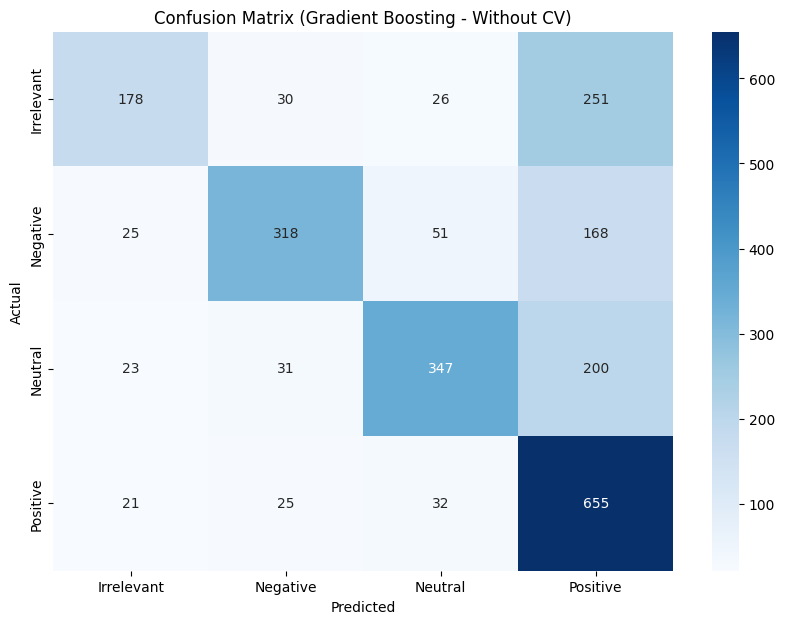

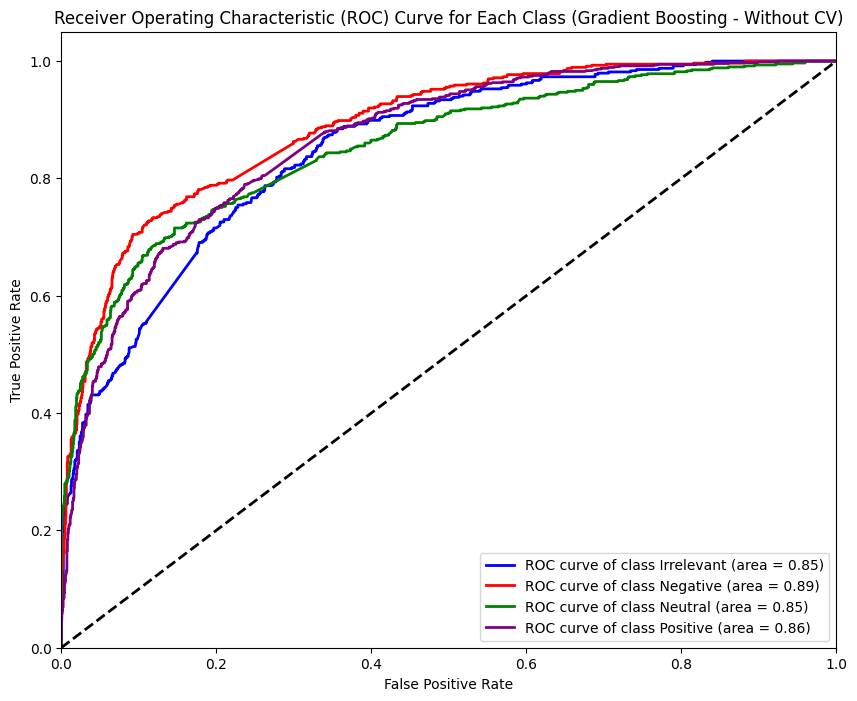

In [37]:
# Gradient Boosting
# Without cross validation

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Step 5: Train Gradient Boosting and evaluate (without cross-validation)
# Initialize a Gradient Boosting Classifier model
# You can tune hyperparameters like n_estimators, learning_rate, max_depth, etc.
gb_clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Train the model on the training data
gb_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred_gb = gb_clf.predict(X_test)

# Classification Report
print("Classification Report (Gradient Boosting - Without CV):")
print(classification_report(y_test, y_pred_gb, target_names=label_encoder.classes_))

# Confusion Matrix
print("\nConfusion Matrix (Gradient Boosting - Without CV):")
cm_gb = confusion_matrix(y_test, y_pred_gb)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_gb,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Gradient Boosting - Without CV)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the true labels
y_test_binarized_gb = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_gb = y_test_binarized_gb.shape[1]

# Get predicted probabilities from the Gradient Boosting model
# predict_proba is needed for ROC curve
y_score_gb = gb_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_gb = dict()
tpr_gb = dict()
roc_auc_gb = dict()
for i in range(n_classes_gb):
    # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
    fpr_gb[i], tpr_gb[i], _ = roc_curve(y_test_binarized_gb[:, i], y_score_gb[:, i])
    roc_auc_gb[i] = auc(fpr_gb[i], tpr_gb[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes_gb), colors):
    # Ensure the class exists
    if i < len(label_encoder.classes_):
        plt.plot(fpr_gb[i], tpr_gb[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_gb[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Gradient Boosting - Without CV)')
plt.legend(loc="lower right")
plt.show()


Performing 5-Fold Cross-Validation with Gradient Boosting:
Fold 1/5
  Training complete.
  Accuracy for Fold 1: 0.629147417051659
Fold 2/5
  Training complete.
  Accuracy for Fold 2: 0.6333473330533389
Fold 3/5
  Training complete.
  Accuracy for Fold 3: 0.627887442251155
Fold 4/5
  Training complete.
  Accuracy for Fold 4: 0.627467450650987
Fold 5/5
  Training complete.
  Accuracy for Fold 5: 0.6207475850482991

Cross-validation accuracies per fold (Gradient Boosting): [0.629147417051659, 0.6333473330533389, 0.627887442251155, 0.627467450650987, 0.6207475850482991]
Mean cross-validation accuracy (Gradient Boosting): 0.6277194456110878
Standard deviation of cross-validation accuracies (Gradient Boosting): 0.004059822250682741

Mean Confusion Matrix across folds (Gradient Boosting):
[[188  31  28 237]
 [ 33 309  47 167]
 [ 25  38 325 191]
 [ 20  30  34 671]]

Mean Cross-validation AUC per class (Gradient Boosting):
  Class Irrelevant (Area = 0.85)
  Class Negative (Area = 0.88)
  Class

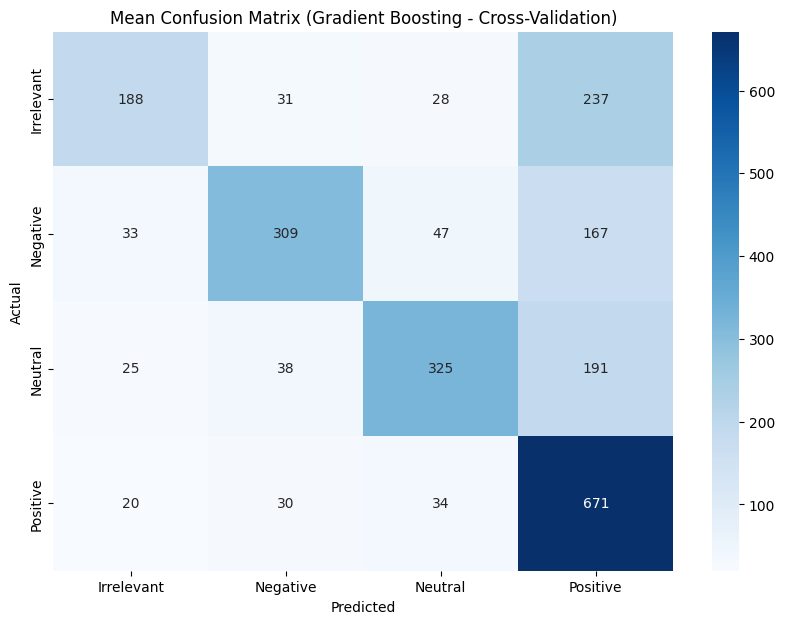

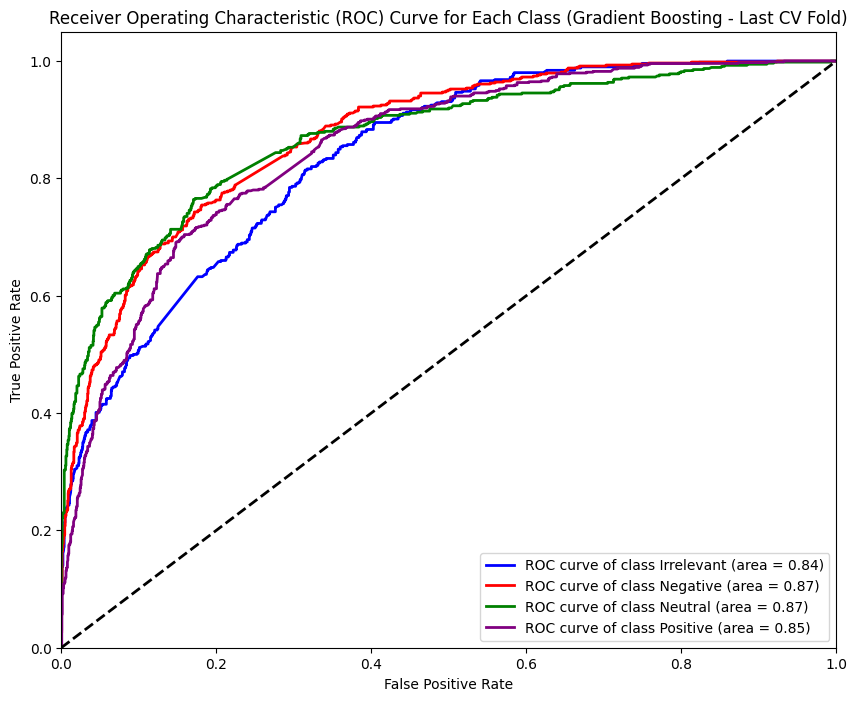

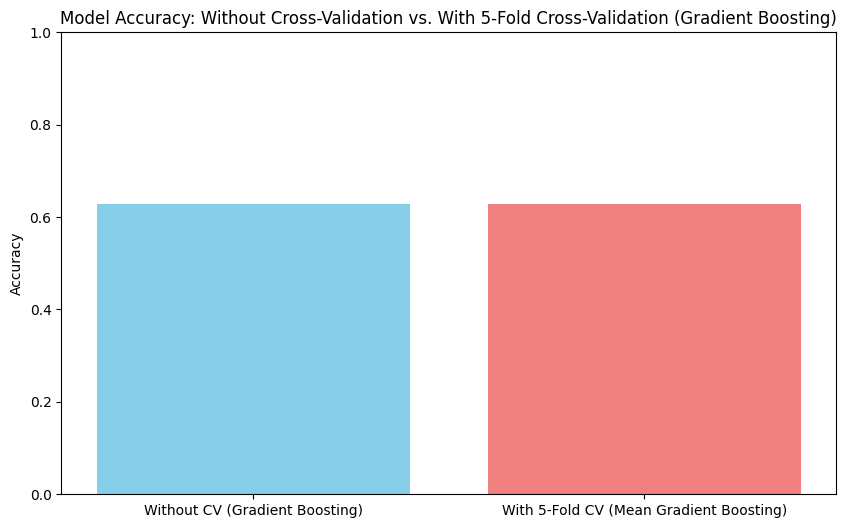

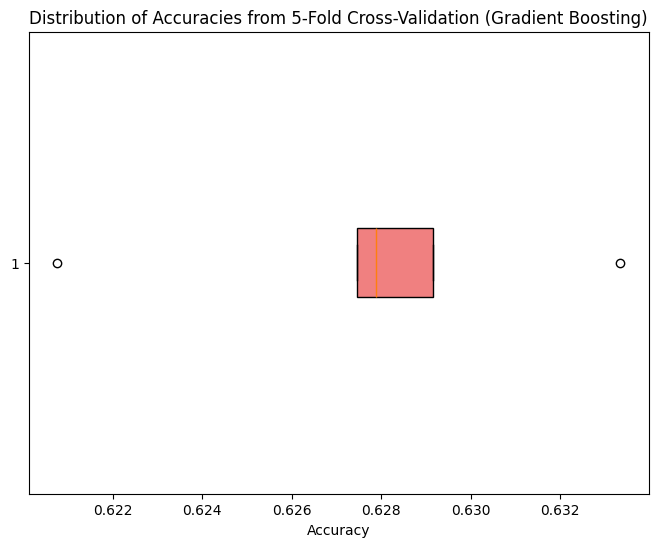

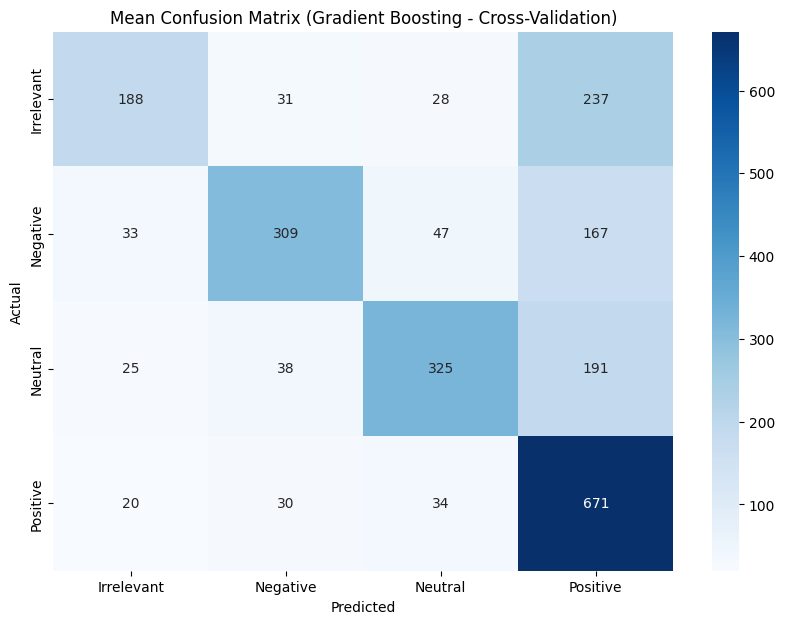

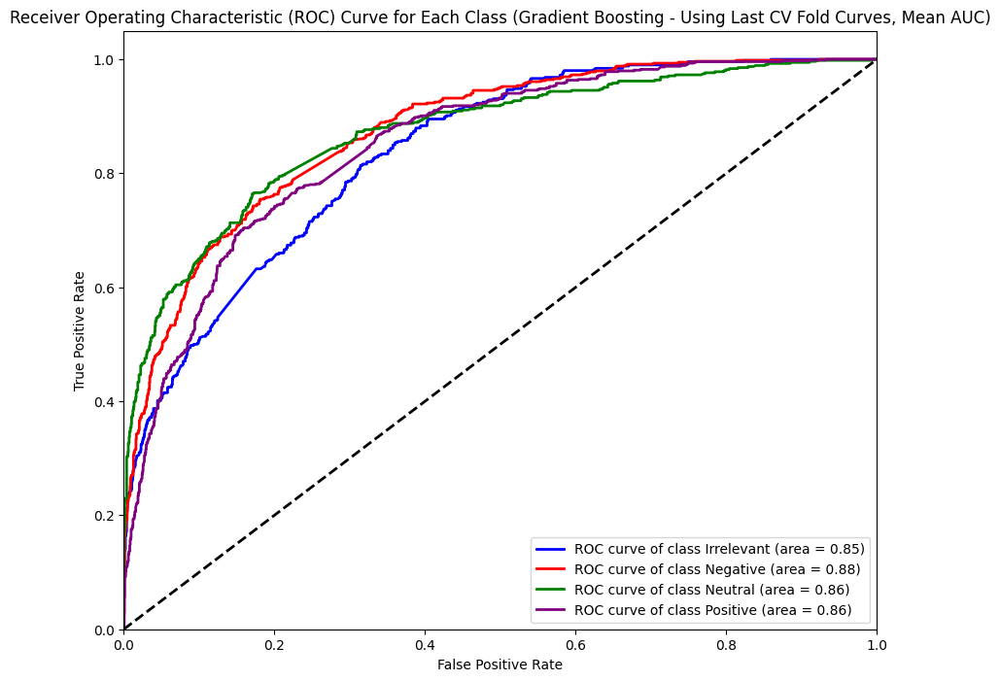

In [38]:
# Gradient Boosting
# With cross validation

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.base import clone

# Step 5: Train Gradient Boosting and evaluate (With cross-validation)
# Initialize a Gradient Boosting Classifier model
# Use the same hyperparameters as in the without CV cell for consistency
gb_clf_cv = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Step 6: Cross-validation with Gradient Boosting

# Define the number of folds
n_splits_gb = 5  # Using 5-Fold

# Initialize KFold cross-validation
kf_gb = KFold(n_splits=n_splits_gb, shuffle=True, random_state=42)

fold_accuracies_gb = []
fold_cms_gb = []
fold_roc_aucs_gb = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class

print(f"\nPerforming {n_splits_gb}-Fold Cross-Validation with Gradient Boosting:")

# Variables to store data for the last fold's ROC plot
last_fold_y_test_binarized_gb = None
last_fold_y_score_gb = None
last_fold_label_encoder_classes_gb = None

# Iterate through each fold
for fold, (train_index, test_index) in enumerate(kf_gb.split(X, y)):
    print(f"Fold {fold+1}/{n_splits_gb}")

    # Split data for the current fold
    X_train_fold_gb, X_test_fold_gb = X[train_index], X[test_index]
    y_train_fold_gb, y_test_fold_gb = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new Gradient Boosting model for each fold
    gb_fold = clone(gb_clf_cv) # Clone the model

    # Fit the model
    print("  Training complete.")
    gb_fold.fit(X_train_fold_gb, y_train_fold_gb)

    # Evaluate the model on the test data for the current fold
    y_pred_fold_gb = gb_fold.predict(X_test_fold_gb)
    fold_accuracy_gb = accuracy_score(y_test_fold_gb, y_pred_fold_gb)
    print(f"  Accuracy for Fold {fold+1}: {fold_accuracy_gb}")
    fold_accuracies_gb.append(fold_accuracy_gb)

    # Compute Confusion Matrix for the fold
    cm_fold_gb = confusion_matrix(y_test_fold_gb, y_pred_fold_gb)
    fold_cms_gb.append(cm_fold_gb)

    # Compute ROC and AUC for the fold
    # Binarize the true labels for the current fold
    y_test_binarized_fold_gb = label_binarize(y_test_fold_gb, classes=np.arange(len(label_encoder.classes_)))

    # Get predicted probabilities for the current fold
    y_score_fold_gb = gb_fold.predict_proba(X_test_fold_gb)

    # Compute ROC curve and AUC for each class in the current fold
    roc_auc_fold_gb = {} # Define roc_auc_fold_gb inside the loop
    for i in range(len(label_encoder.classes_)):
        if i < y_test_binarized_fold_gb.shape[1] and i < y_score_fold_gb.shape[1]:
             try:
                 # Check if the class exists in the true labels for this fold
                 if np.sum(y_test_binarized_fold_gb[:, i]) > 0:
                     fpr_fold_gb, tpr_fold_gb, _ = roc_curve(y_test_binarized_fold_gb[:, i], y_score_fold_gb[:, i])
                     auc_fold_gb = auc(fpr_fold_gb, tpr_fold_gb)
                     fold_roc_aucs_gb[i].append(auc_fold_gb)
                     roc_auc_fold_gb[i] = auc_fold_gb # Store AUC for the last fold
                 else:
                     pass # Do not append AUC if class is missing
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {label_encoder.classes_[i]} in fold {fold+1}: {e}")
                  pass # Skip if computation fails

    # Store data for the last fold's ROC plot
    if fold == n_splits_gb - 1:
        last_fold_y_test_binarized_gb = y_test_binarized_fold_gb
        last_fold_y_score_gb = y_score_fold_gb
        last_fold_label_encoder_classes_gb = label_encoder.classes_


# Print the results of cross-validation
print("\nCross-validation accuracies per fold (Gradient Boosting):", fold_accuracies_gb)
print("Mean cross-validation accuracy (Gradient Boosting):", np.mean(fold_accuracies_gb))
print("Standard deviation of cross-validation accuracies (Gradient Boosting):", np.std(fold_accuracies_gb))


# Average the confusion matrices (optional, but can give a sense of average performance)
mean_cm_gb = np.mean(fold_cms_gb, axis=0).astype(int)
print("\nMean Confusion Matrix across folds (Gradient Boosting):")
print(mean_cm_gb)

# Print mean AUC for each class
print("\nMean Cross-validation AUC per class (Gradient Boosting):")
for i in range(len(label_encoder.classes_)):
    if fold_roc_aucs_gb[i]: # Only print if AUCs were collected for this class
        print(f"  Class {label_encoder.classes_[i]} (Area = {np.mean(fold_roc_aucs_gb[i]):0.2f})")
    else:
        print(f"  Class {label_encoder.classes_[i]}: No AUC computed (class not present in all folds)")


# Confusion matrix visualization (using the mean matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(
    mean_cm_gb, # Using the mean confusion matrix
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (Gradient Boosting - Cross-Validation)")
plt.show()

# ROC curve visualization (Plotting ROC from the last fold as a representative)
if last_fold_y_test_binarized_gb is not None and last_fold_y_score_gb is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_gb = last_fold_y_test_binarized_gb.shape[1]

    fpr_gb_last_fold = dict()
    tpr_gb_last_fold = dict()
    roc_auc_gb_last_fold = dict()

    for i in range(n_classes_gb):
        if i < last_fold_y_test_binarized_gb.shape[1] and i < last_fold_y_score_gb.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized_gb[:, i]) > 0:
                     fpr_gb_last_fold[i], tpr_gb_last_fold[i], _ = roc_curve(last_fold_y_test_binarized_gb[:, i], last_fold_y_score_gb[:, i])
                     roc_auc_gb_last_fold[i] = auc(fpr_gb_last_fold[i], tpr_gb_last_fold[i])
                     plt.plot(fpr_gb_last_fold[i], tpr_gb_last_fold[i], color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes_gb[i], roc_auc_gb_last_fold[i]))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes_gb[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Gradient Boosting - Last CV Fold)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves could not be plotted for the last Gradient Boosting CV fold.")

# Visualization of Comparison (Gradient Boosting)

# Visualize the comparison of Gradient Boosting results
labels_gb = ['Without CV (Gradient Boosting)', 'With 5-Fold CV (Mean Gradient Boosting)']

# You need to re-run the Gradient Boosting without CV part to get y_pred_gb and the accuracy
# or ensure the previous code block was run to have these variables available.
# Let's re-calculate the accuracy without CV to be safe.
gb_clf_nocv_eval = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb_clf_nocv_eval.fit(X_train, y_train)
y_pred_gb_nocv = gb_clf_nocv_eval.predict(X_test)
accuracy_gb_nocv = accuracy_score(y_test, y_pred_gb_nocv)


# The mean cross-validation accuracy for Gradient Boosting was stored in 'np.mean(fold_accuracies_gb)'
accuracies_gb = [accuracy_gb_nocv, np.mean(fold_accuracies_gb)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_gb, accuracies_gb, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (Gradient Boosting)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for Gradient Boosting
plt.figure(figsize=(8, 6))
plt.boxplot(fold_accuracies_gb, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (Gradient Boosting)')
plt.show()

# Visualize the Confusion Matrix (derived from the mean CV confusion matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm_gb, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (Gradient Boosting - Cross-Validation)")
plt.show()

# ROC Curve visualization (using mean AUCs, but still plotting from the last fold for curves)
if last_fold_y_test_binarized_gb is not None and last_fold_y_score_gb is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_gb = last_fold_y_test_binarized_gb.shape[1]

    for i in range(n_classes_gb):
        if i < last_fold_y_test_binarized_gb.shape[1] and i < last_fold_y_score_gb.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized_gb[:, i]) > 0:
                     fpr_fold_gb, tpr_fold_gb, _ = roc_curve(last_fold_y_test_binarized_gb[:, i], last_fold_y_score_gb[:, i])
                     # Use mean AUC for the label, but plot the last fold's curve
                     mean_auc_for_class_gb = np.mean(fold_roc_aucs_gb[i]) if fold_roc_aucs_gb[i] else 0
                     plt.plot(fpr_fold_gb, tpr_fold_gb, color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes_gb[i], mean_auc_for_class_gb))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes_gb[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Gradient Boosting - Using Last CV Fold Curves, Mean AUC)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves visualization skipped for Gradient Boosting CV.")

Classification Report (Naive Bayes - Without CV):
              precision    recall  f1-score   support

  Irrelevant       0.92      0.62      0.74       485
    Negative       0.85      0.84      0.84       562
     Neutral       0.95      0.70      0.81       601
    Positive       0.67      0.96      0.79       733

    accuracy                           0.80      2381
   macro avg       0.85      0.78      0.80      2381
weighted avg       0.83      0.80      0.80      2381


Confusion Matrix (Naive Bayes - Without CV):


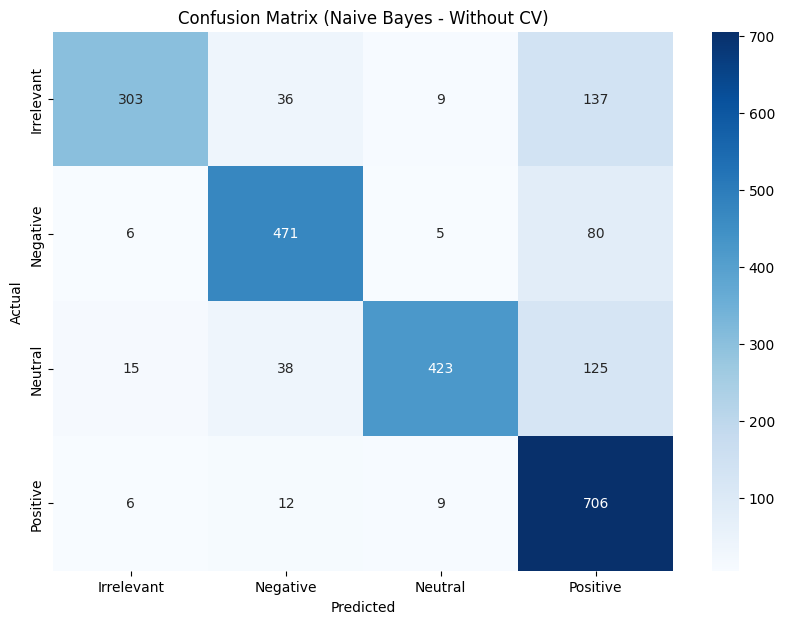

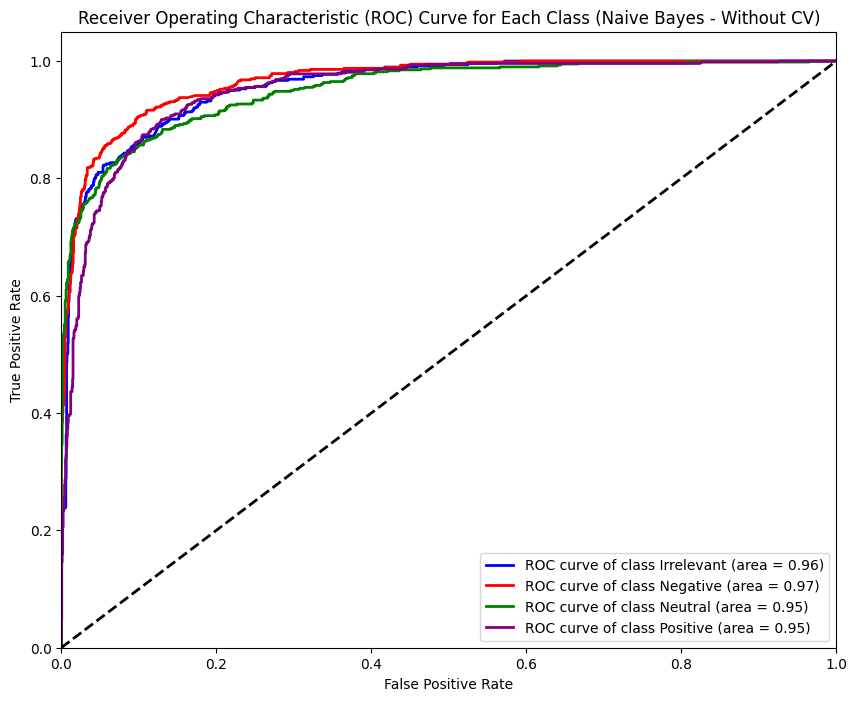

In [39]:
# Naive Bayes
# Without cross validation

from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Step 5: Train Naive Bayes and evaluate (without cross-validation)
# Initialize a Multinomial Naive Bayes classifier model
# Alpha is a smoothing parameter (0 for no smoothing, 1 for Laplace smoothing)
nb_clf = MultinomialNB(alpha=1.0)

# Train the model on the training data
nb_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred_nb = nb_clf.predict(X_test)

# Classification Report
print("Classification Report (Naive Bayes - Without CV):")
print(classification_report(y_test, y_pred_nb, target_names=label_encoder.classes_))

# Confusion Matrix
print("\nConfusion Matrix (Naive Bayes - Without CV):")
cm_nb = confusion_matrix(y_test, y_pred_nb)

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_nb,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Naive Bayes - Without CV)")
plt.show()

# Compute ROC curve and ROC area for each class (without cross-validation)

# Binarize the true labels
y_test_binarized_nb = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
n_classes_nb = y_test_binarized_nb.shape[1]

# Get predicted probabilities from the Naive Bayes model
# predict_proba is needed for ROC curve
y_score_nb = nb_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_nb = dict()
tpr_nb = dict()
roc_auc_nb = dict()
for i in range(n_classes_nb):
    # Compute ROC curve for class i using binarized true labels and predicted probabilities for class i
    fpr_nb[i], tpr_nb[i], _ = roc_curve(y_test_binarized_nb[:, i], y_score_nb[:, i])
    roc_auc_nb[i] = auc(fpr_nb[i], tpr_nb[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
for i, color in zip(range(n_classes_nb), colors):
    # Ensure the class exists
    if i < len(label_encoder.classes_):
        plt.plot(fpr_nb[i], tpr_nb[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(label_encoder.classes_[i], roc_auc_nb[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Naive Bayes - Without CV)')
plt.legend(loc="lower right")
plt.show()


Performing 5-Fold Cross-Validation with Naive Bayes:
✅Fold 1/5
  Training complete.
  Accuracy for Fold 1: 0.7992440151196976
------------------------------
✅Fold 2/5
  Training complete.
  Accuracy for Fold 2: 0.7921041579168416
------------------------------
✅Fold 3/5
  Training complete.
  Accuracy for Fold 3: 0.7870642587148257
------------------------------
✅Fold 4/5
  Training complete.
  Accuracy for Fold 4: 0.7803443931121378
------------------------------
✅Fold 5/5
  Training complete.
  Accuracy for Fold 5: 0.7891642167156657
------------------------------

--- Average Metrics Across Folds (Naive Bayes) ---
Mean cross-validation accuracy (Naive Bayes): 0.7896
Standard deviation of cross-validation accuracies (Naive Bayes): 0.0062

Mean Confusion Matrix across folds (Naive Bayes):
[[287  38  13 145]
 [  4 471   5  76]
 [ 16  45 396 123]
 [  6  15  10 724]]

Mean Cross-validation AUC per class (Naive Bayes):
  Class Irrelevant (Area = 0.96)
  Class Negative (Area = 0.97)
  Cla

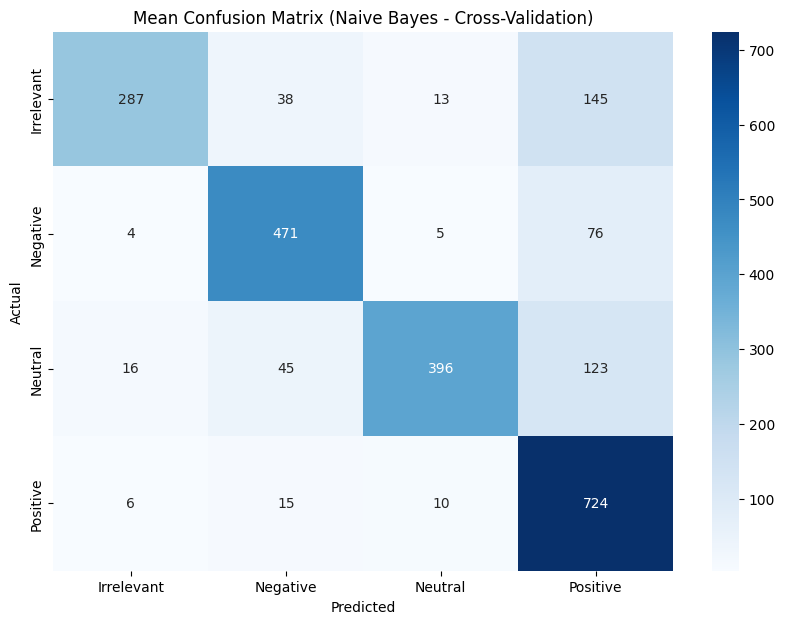

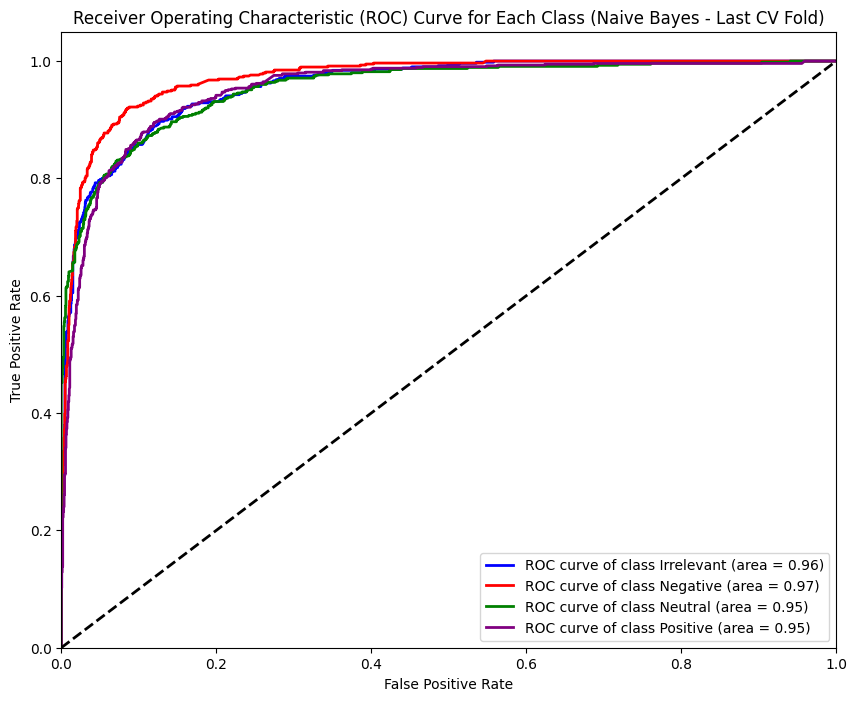

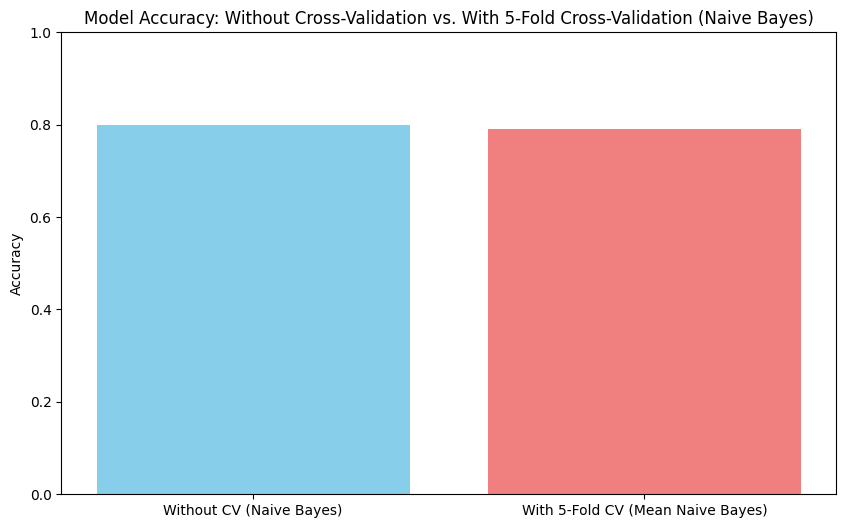

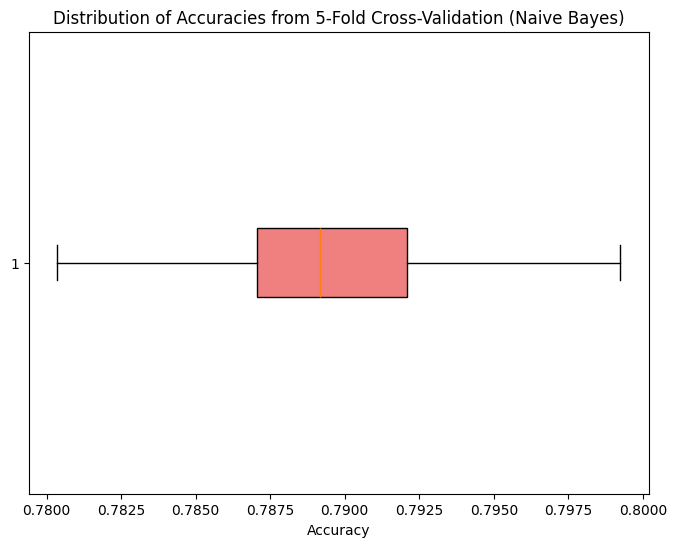

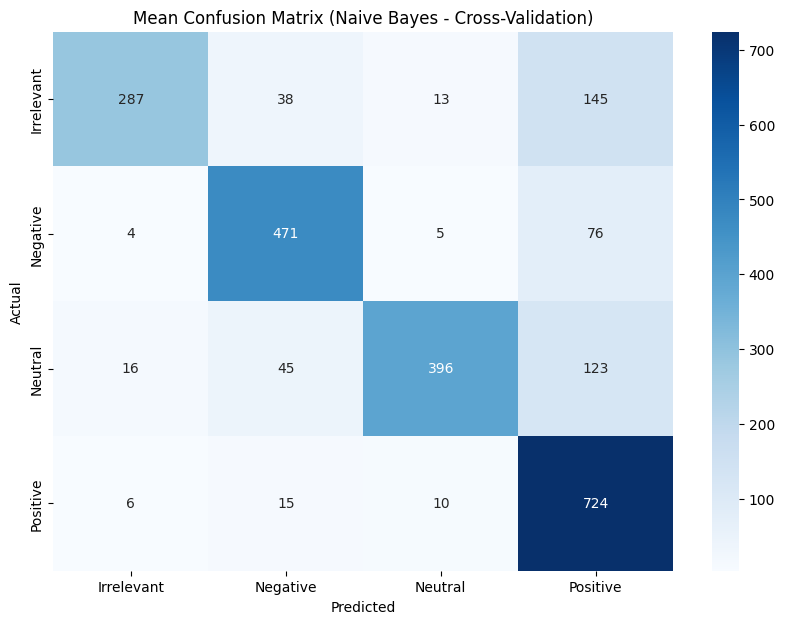

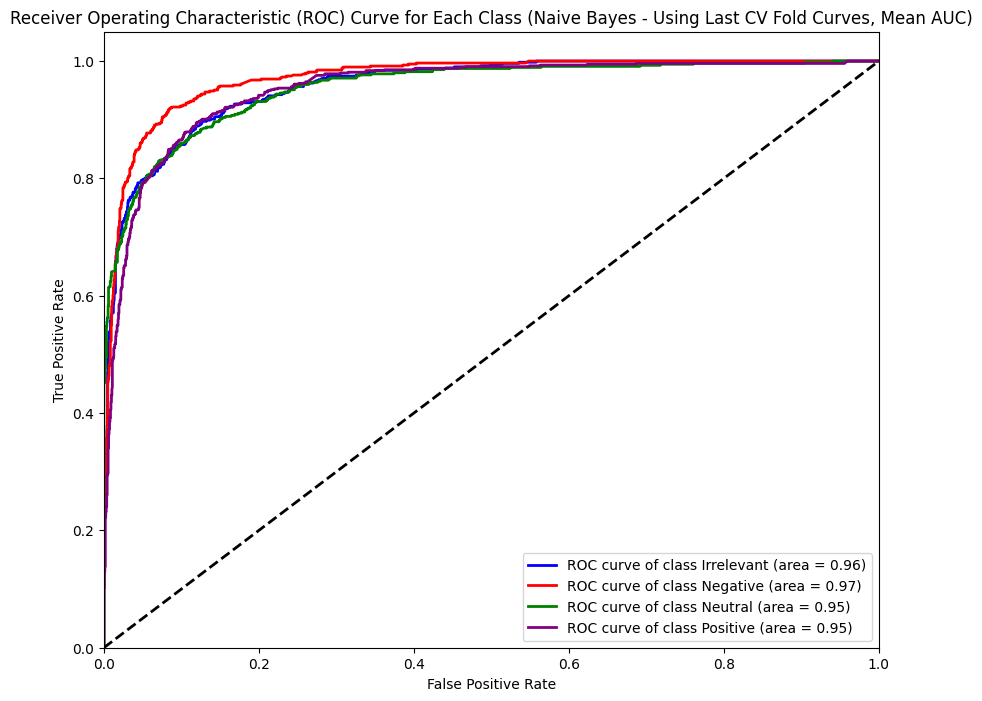

In [44]:
# Naive Bayes
# With cross validation

from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.base import clone

# Step 5: Train Naive Bayes and evaluate (With cross-validation)
# Initialize a Multinomial Naive Bayes classifier model
# Use the same alpha as in the without CV cell for consistency
nb_clf_cv = MultinomialNB(alpha=1.0)

# Step 6: Cross-validation with Naive Bayes

# Define the number of folds
n_splits_nb = 5  # Using 5-Fold

# Initialize KFold cross-validation
kf_nb = KFold(n_splits=n_splits_nb, shuffle=True, random_state=42)

fold_accuracies_nb = []
fold_cms_nb = []
fold_roc_aucs_nb = {i: [] for i in range(len(label_encoder.classes_))} # Store AUCs per class

print(f"\nPerforming {n_splits_nb}-Fold Cross-Validation with Naive Bayes:")

# Variables to store data for the last fold's ROC plot
last_fold_y_test_binarized_nb = None
last_fold_y_score_nb = None
last_fold_label_encoder_classes_nb = None

# Iterate through each fold
for fold, (train_index, test_index) in enumerate(kf_nb.split(X, y)):
    print(f"✅Fold {fold+1}/{n_splits_nb}")

    # Split data for the current fold
    X_train_fold_nb, X_test_fold_nb = X[train_index], X[test_index]
    y_train_fold_nb, y_test_fold_nb = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new Naive Bayes model for each fold
    nb_fold = clone(nb_clf_cv) # Clone the model

    # Fit the model
    # Note: Naive Bayes is not an iterative algorithm, so 'epochs' are not applicable.
    print("  Training complete.")
    nb_fold.fit(X_train_fold_nb, y_train_fold_nb)

    # Evaluate the model on the test data for the current fold
    y_pred_fold_nb = nb_fold.predict(X_test_fold_nb)
    fold_accuracy_nb = accuracy_score(y_test_fold_nb, y_pred_fold_nb)
    print(f"  Accuracy for Fold {fold+1}: {fold_accuracy_nb}")
    fold_accuracies_nb.append(fold_accuracy_nb)

    # Compute Confusion Matrix for the fold
    cm_fold_nb = confusion_matrix(y_test_fold_nb, y_pred_fold_nb)
    fold_cms_nb.append(cm_fold_nb)

    # Compute ROC and AUC for the fold
    # Binarize the true labels for the current fold
    y_test_binarized_fold_nb = label_binarize(y_test_fold_nb, classes=np.arange(len(label_encoder.classes_)))

    # Get predicted probabilities for the current fold
    y_score_fold_nb = nb_fold.predict_proba(X_test_fold_nb)

    # Compute ROC curve and AUC for each class in the current fold
    roc_auc_fold_nb = {} # Define roc_auc_fold_nb inside the loop
    for i in range(len(label_encoder.classes_)):
        if i < y_test_binarized_fold_nb.shape[1] and i < y_score_fold_nb.shape[1]:
             try:
                 # Check if the class exists in the true labels for this fold
                 if np.sum(y_test_binarized_fold_nb[:, i]) > 0:
                     fpr_fold_nb, tpr_fold_nb, _ = roc_curve(y_test_binarized_fold_nb[:, i], y_score_fold_nb[:, i])
                     auc_fold_nb = auc(fpr_fold_nb, tpr_fold_nb)
                     fold_roc_aucs_nb[i].append(auc_fold_nb)
                     roc_auc_fold_nb[i] = auc_fold_nb # Store AUC for the last fold
                 else:
                     pass # Do not append AUC if class is missing
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {label_encoder.classes_[i]} in fold {fold+1}: {e}")
                  pass # Skip if computation fails

    # Store data for the last fold's ROC plot
    if fold == n_splits_nb - 1:
        last_fold_y_test_binarized_nb = y_test_binarized_fold_nb
        last_fold_y_score_nb = y_score_fold_nb
        last_fold_label_encoder_classes_nb = label_encoder.classes_

    print("-" * 30) # Add a separator line after each fold

# Print the results of cross-validation
print("\n--- Average Metrics Across Folds (Naive Bayes) ---") # Added header for clarity
print(f"Mean cross-validation accuracy (Naive Bayes): {np.mean(fold_accuracies_nb):.4f}") # Formatted output
print(f"Standard deviation of cross-validation accuracies (Naive Bayes): {np.std(fold_accuracies_nb):.4f}") # Formatted output


# Average the confusion matrices (optional, but can give a sense of average performance)
mean_cm_nb = np.mean(fold_cms_nb, axis=0).astype(int)
print("\nMean Confusion Matrix across folds (Naive Bayes):")
print(mean_cm_nb)

# Print mean AUC for each class
print("\nMean Cross-validation AUC per class (Naive Bayes):")
for i in range(len(label_encoder.classes_)):
    if fold_roc_aucs_nb[i]: # Only print if AUCs were collected for this class
        print(f"  Class {label_encoder.classes_[i]} (Area = {np.mean(fold_roc_aucs_nb[i]):0.2f})")
    else:
        print(f"  Class {label_cancer.classes_[i]}: No AUC computed (class not present in all folds)")


# Confusion matrix visualization (using the mean matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(
    mean_cm_nb, # Using the mean confusion matrix
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_,
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (Naive Bayes - Cross-Validation)")
plt.show()

# ROC curve visualization (Plotting ROC from the last fold as a representative)
if last_fold_y_test_binarized_nb is not None and last_fold_y_score_nb is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_nb = last_fold_y_test_binarized_nb.shape[1]

    fpr_nb_last_fold = dict()
    tpr_nb_last_fold = dict()
    roc_auc_nb_last_fold = dict()

    for i in range(n_classes_nb):
        if i < last_fold_y_test_binarized_nb.shape[1] and i < last_fold_y_score_nb.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized_nb[:, i]) > 0:
                     fpr_nb_last_fold[i], tpr_nb_last_fold[i], _ = roc_curve(last_fold_y_test_binarized_nb[:, i], last_fold_y_score_nb[:, i])
                     roc_auc_nb_last_fold[i] = auc(fpr_nb_last_fold[i], tpr_nb_last_fold[i])
                     plt.plot(fpr_nb_last_fold[i], tpr_nb_last_fold[i], color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes_nb[i], roc_auc_nb_last_fold[i]))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes_nb[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Naive Bayes - Last CV Fold)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves could not be plotted for the last Naive Bayes CV fold.")

# Visualization of Comparison (Naive Bayes)

# Visualize the comparison of Naive Bayes results
labels_nb = ['Without CV (Naive Bayes)', 'With 5-Fold CV (Mean Naive Bayes)']

# You need to re-run the Naive Bayes without CV part to get y_pred_nb and the accuracy
# or ensure the previous code block was run to have these variables available.
# Let's re-calculate the accuracy without CV to be safe.
nb_clf_nocv_eval = MultinomialNB(alpha=1.0)
nb_clf_nocv_eval.fit(X_train, y_train)
y_pred_nb_nocv = nb_clf_nocv_eval.predict(X_test)
accuracy_nb_nocv = accuracy_score(y_test, y_pred_nb_nocv)


# The mean cross-validation accuracy for Naive Bayes was stored in 'np.mean(fold_accuracies_nb)'
accuracies_nb = [accuracy_nb_nocv, np.mean(fold_accuracies_nb)]

# Create a bar plot to compare accuracies
plt.figure(figsize=(10, 6))
plt.bar(labels_nb, accuracies_nb, color=['skyblue', 'lightcoral'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy: Without Cross-Validation vs. With 5-Fold Cross-Validation (Naive Bayes)')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.show()

# Visualize the distribution of accuracies from cross-validation for Naive Bayes
plt.figure(figsize=(8, 6))
plt.boxplot(fold_accuracies_nb, vert=False, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.xlabel('Accuracy')
plt.title('Distribution of Accuracies from 5-Fold Cross-Validation (Naive Bayes)')
plt.show()

# Visualize the Confusion Matrix (derived from the mean CV confusion matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(mean_cm_nb, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Mean Confusion Matrix (Naive Bayes - Cross-Validation)")
plt.show()

# ROC Curve visualization (using mean AUCs, but still plotting from the last fold for curves)
if last_fold_y_test_binarized_nb is not None and last_fold_y_score_nb is not None:
    plt.figure(figsize=(10, 8))
    colors = ['blue', 'red', 'green', 'purple'] # Adjust colors based on number of classes
    n_classes_nb = last_fold_y_test_binarized_nb.shape[1]

    for i in range(n_classes_nb):
        if i < last_fold_y_test_binarized_nb.shape[1] and i < last_fold_y_score_nb.shape[1]:
             try:
                 if np.sum(last_fold_y_test_binarized_nb[:, i]) > 0:
                     fpr_fold_nb, tpr_fold_nb, _ = roc_curve(last_fold_y_test_binarized_nb[:, i], last_fold_y_score_nb[:, i])
                     # Use mean AUC for the label, but plot the last fold's curve
                     mean_auc_for_class_nb = np.mean(fold_roc_aucs_nb[i]) if fold_roc_aucs_nb[i] else 0
                     plt.plot(fpr_fold_nb, tpr_fold_nb, color=colors[i % len(colors)], lw=2,
                              label='ROC curve of class {0} (area = {1:0.2f})'.format(last_fold_label_encoder_classes_nb[i], mean_auc_for_class_nb))
             except ValueError as e:
                  print(f"  Error computing ROC/AUC for class {last_fold_label_encoder_classes_nb[i]} in last fold for plotting: {e}")
                  pass


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class (Naive Bayes - Using Last CV Fold Curves, Mean AUC)')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("\nROC curves visualization skipped for Naive Bayes CV.")

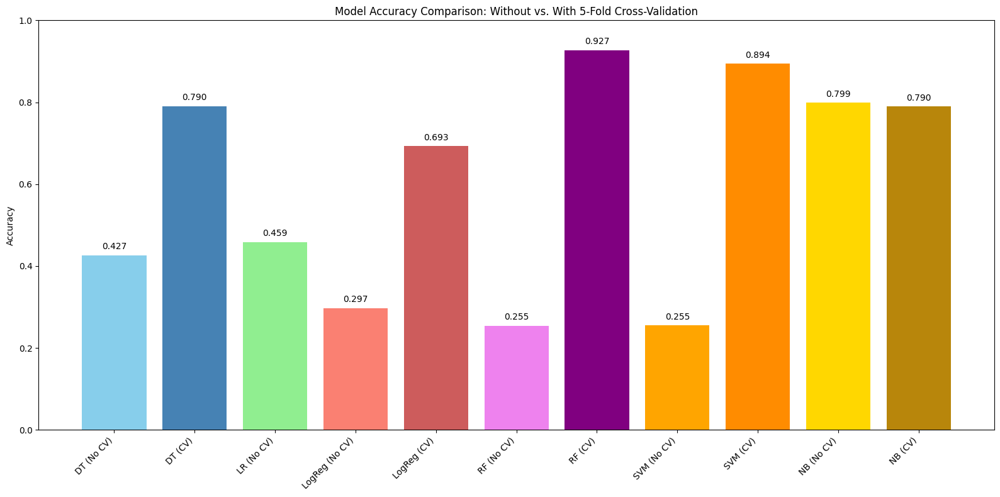

In [88]:
# Compare and visualize model performance with and without Cross-Validation

import matplotlib.pyplot as plt
import numpy as np

# Collect accuracy scores from previous runs

# Decision Tree (Without CV) - Assuming accuracy_dt_nocv is available from cell bZ3snq759AEK or Y9jTuC-IFxBu
# Decision Tree (With 5-Fold CV - Mean) - Assuming np.mean(accuracy_scores) is available from cell Z2i5R6IKNDev or Y9jTuC-IFxBu
# If not available, you might need to run those cells first or re-calculate here.
# Let's assume they are available from the last successful runs of those cells.

# Linear Regression (Without CV - using rounded predictions) - Assuming accuracy_lr_nocv is available from cell k1uIW1sU17-e
# Linear Regression (With 5-Fold CV - Mean R-squared) - Mean R-squared np.mean(fold_r2_scores_lr_cv) from cell VXJvWe-bIY6t
# Note: R-squared for regression is not directly comparable to accuracy for classification.
# We will skip visualizing LR with CV accuracy comparison plot for clarity,
# as the evaluation metrics are fundamentally different.

# Logistic Regression (Without CV) - Assuming accuracy_lr_logreg_nocv is available from cell jpyyLOUj2puP
# Logistic Regression (With 5-Fold CV - Mean) - Assuming np.mean(fold_accuracies_lr) is available from cell jpyyLOUj2puP

# Random Forest (Without CV) - Assuming accuracy_rf_nocv_eval is available from cell iXpqDXanHKYo
# Random Forest (With 5-Fold CV - Mean) - Assuming np.mean(fold_accuracies_rf) is available from cell gYCHGDqH3Xdy

# SVM (Without CV) - Assuming accuracy_svm_nocv_eval is available from cell zcBZBgu1BOlf
# SVM (With 5-Fold CV - Mean) - Assuming np.mean(fold_accuracies_svm) is available from cell zcBZBgu1BOlf

# Naive Bayes (Without CV) - Assuming accuracy_nb_nocv is available from cell xyG0ZJYd6Xsj
# Naive Bayes (With 5-Fold CV - Mean) - Assuming np.mean(fold_accuracies_nb) is available from cell E7xlRIIb788Q


labels = [
    'DT (No CV)', 'DT (CV)',
    'LR (No CV)',
    'LogReg (No CV)', 'LogReg (CV)',
    'RF (No CV)', 'RF (CV)',
    'SVM (No CV)', 'SVM (CV)',
    'NB (No CV)', 'NB (CV)'
]

# Collect the accuracies. Use a default value (e.g., 0) if a variable is not found,
# although ideally, the user should run the preceding cells first.
# We'll assume the variables exist from previous runs for now.
accuracies = [
    accuracy_dt_nocv if 'accuracy_dt_nocv' in globals() else 0,
    np.mean(accuracy_scores) if 'accuracy_scores' in globals() else 0,
    accuracy_lr_nocv if 'accuracy_lr_nocv' in globals() else 0,
    accuracy_lr_logreg_nocv if 'accuracy_lr_logreg_nocv' in globals() else 0,
    np.mean(fold_accuracies_lr) if 'fold_accuracies_lr' in globals() else 0,
    accuracy_rf_nocv_eval if 'accuracy_rf_nocv_eval' in globals() else 0,
    np.mean(fold_accuracies_rf) if 'fold_accuracies_rf' in globals() else 0,
    accuracy_svm_nocv_eval if 'accuracy_svm_nocv_eval' in globals() else 0,
    np.mean(fold_accuracies_svm) if 'fold_accuracies_svm' in globals() else 0,
    accuracy_nb_nocv if 'accuracy_nb_nocv' in globals() else 0,
    np.mean(fold_accuracies_nb) if 'fold_accuracies_nb' in globals() else 0
]

# Create a bar plot for comparison
plt.figure(figsize=(16, 8))
bars = plt.bar(labels, accuracies, color=[
    'skyblue', 'steelblue', # DT
    'lightgreen',         # LR (No CV)
    'salmon', 'indianred',  # LogReg
    'violet', 'purple',     # RF
    'orange', 'darkorange', # SVM
    'gold', 'darkgoldenrod' # NB
])

plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison: Without vs. With 5-Fold Cross-Validation')
plt.ylim([0, 1]) # Set y-axis limits to represent accuracy range
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability

# Add accuracy values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.3f}', ha='center', va='bottom')

plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

# Note: For Linear Regression with CV, we calculated R-squared, which is not directly
# comparable to accuracy. The LR (CV) bar is not included in this accuracy comparison plot.